# ## Cell 1: Setup and Configuration

In [1]:
import os
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.filters import gaussian
import seaborn as sns
from tqdm import tqdm
import cv2
from skimage.feature import hog, local_binary_pattern
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc, roc_auc_score
from sklearn.utils.class_weight import compute_class_weight

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import models, transforms, datasets
from torch.optim.lr_scheduler import ReduceLROnPlateau, CosineAnnealingWarmRestarts
from sklearn.preprocessing import label_binarize
from scipy.signal import butter, lfilter


import random
from PIL import Image

import torch._dynamo
torch._dynamo.config.suppress_errors = True


# Global plotting settings
sns.set(style='whitegrid', font_scale=1.2)
plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['image.cmap'] = 'inferno'

# Set random seeds for reproducibility
SEED = 207
torch.manual_seed(SEED)
np.random.seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = True

# Set device
device = torch.device("cuda:1" if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

# Configuration parameters
data_dir = './chest_xray_data/'
input_size = (224, 224)          # Standard input size for pretrained models
batch_size = 256                 # Batch size
num_epochs = 25                  # Maximum number of training epochs
num_classes = 4                  # COVID-19, NORMAL, PNEUMONIA, TUBERCULOSIS
early_stopping_patience = 7
classes = ['COVID19', 'NORMAL', 'PNEUMONIA', 'TUBERCULOSIS']

# Mixed precision training
use_amp = True  # Use automatic mixed precision for faster training

Using device: cuda:1


# ## Cell 2: Helper Functions - Image Enhancement and Feature Extraction

In [2]:
class EnhancedLoader:
    @staticmethod
    def apply_clahe(img, clip_limit=1.8, tile_grid_size=(8, 8)):
        """
        Applies Contrast Limited Adaptive Histogram Equalization (CLAHE)
        
        Args:
            img (np.ndarray): Input image (uint8)
            clip_limit (float): Contrast clipping threshold
            tile_grid_size (tuple): Grid size for local histogram equalization
            
        Returns:
            np.ndarray: Contrast-enhanced image
        """
        # Ensure uint8 input
        if img.dtype != np.uint8:
            img = (np.clip(img, 0, 255)).astype(np.uint8)

        # Process color images in YUV space
        if len(img.shape) == 3 and img.shape[2] == 3:
            img_yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
            clahe = cv2.createCLAHE(
                clipLimit=clip_limit, 
                tileGridSize=tile_grid_size
            )
            img_yuv[..., 0] = clahe.apply(img_yuv[..., 0])
            return cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
            
        # Process grayscale images directly
        clahe = cv2.createCLAHE(
            clipLimit=clip_limit, 
            tileGridSize=tile_grid_size
        )
        return clahe.apply(img)

    @staticmethod
    def denoise_image(img, strength=2):
        """Apply non-local means denoising to improve image quality"""
        # Convert to uint8 if not already
        img = img.astype(np.uint8) if img.dtype != np.uint8 else img
        
        if len(img.shape) == 3 and img.shape[2] == 3:
            return cv2.fastNlMeansDenoisingColored(img, None, strength, strength, 7, 21)
        else:
            return cv2.fastNlMeansDenoising(img, None, strength, 7, 21)

    @staticmethod
    def apply_butterworth_bandpass_filter(img, lowcut, highcut, order=3):
        """
        Applies Butterworth bandpass filter to image with robust normalization
        
        Args:
            img (np.ndarray): Input image (grayscale or RGB)
            lowcut (int): Lower cutoff frequency (1-100 typical)
            highcut (int): Upper cutoff frequency (50-200 typical)
            order (int): Filter order (3-5 recommended)
            
        Returns:
            np.ndarray: Filtered uint8 image
        """
        # Convert to float32 for processing
        img = img.astype(np.float32)
        
        # Process each channel for color images
        if len(img.shape) == 3:
            filtered = np.zeros_like(img)
            for ch in range(3):
                filtered[..., ch] = EnhancedLoader._butterworth_bandpass(
                    img[..., ch], lowcut, highcut, order)
        else:
            filtered = EnhancedLoader._butterworth_bandpass(
                img, lowcut, highcut, order)

        # Robust normalization using percentile clipping
        p_low, p_high = np.percentile(filtered, [2, 98])  # Clip extreme 2%
        np.clip(filtered, p_low, p_high, out=filtered)
        
        if (p_high - p_low) > 1e-6:  # Avoid division by zero
            filtered = (filtered - p_low) / (p_high - p_low) * 255
            
        return np.clip(filtered, 0, 255).astype(np.uint8)

    @staticmethod
    def _butterworth_bandpass(img, lowcut, highcut, order):
        """
        Applies Butterworth bandpass filter in frequency domain
        
        Args:
            img (np.ndarray): Input grayscale image
            lowcut (int): Lower cutoff frequency (pixels)
            highcut (int): Upper cutoff frequency (pixels)
            order (int): Filter order controlling steepness
            
        Returns:
            np.ndarray: Filtered image in spatial domain
        """
        # Validate input dimensions
        if len(img.shape) != 2:
            raise ValueError("Input image must be single-channel grayscale")
            
        rows, cols = img.shape
        
        # Create frequency domain coordinates
        u = np.fft.fftfreq(cols)
        v = np.fft.fftfreq(rows)
        u, v = np.meshgrid(u, v)
        
        # Calculate frequency distances
        d = np.sqrt(u**2 + v**2)
        
        # Construct Butterworth bandpass filter
        low_pass = 1 / (1 + (d / (lowcut/rows))**(2*order))
        high_pass = 1 - 1/(1 + (d/(highcut/rows))**(2*order))
        bandpass_filter = low_pass * high_pass
        
        # Frequency domain processing
        f = np.fft.fft2(img)
        fshift = np.fft.fftshift(f)
        filtered = fshift * bandpass_filter
        
        # Convert back to spatial domain
        f_ishift = np.fft.ifftshift(filtered)
        img_back = np.fft.ifft2(f_ishift)
        return np.abs(img_back)

    @staticmethod
    def apply_adaptive_masking(img, low_percentile=1, high_percentile=99):
        
        if len(img.shape) == 3:
            gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        else:
            gray_img = img

        low_thresh = np.percentile(gray_img, low_percentile)
        high_thresh = np.percentile(gray_img, high_percentile)

        # Example: Mask out very dark or very bright regions
        mask = np.logical_and(gray_img > low_thresh, gray_img < high_thresh)
        
        # Create output with proper dimensions
        if len(img.shape) == 3:
            mask_3d = np.stack([mask] * img.shape[2], axis=2)
            masked_img = np.where(mask_3d, img, 0)
        else:
            masked_img = np.where(mask, img, 0)
            
        return masked_img.astype(np.uint8)

    @staticmethod
    def apply_histogram_equalization(img):
        """Apply histogram equalization"""
        # Convert to uint8 if not already
        img = img.astype(np.uint8) if img.dtype != np.uint8 else img
        
        if len(img.shape) == 3 and img.shape[2] == 3:
            img_yuv = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
            img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0])
            img = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2RGB)
        else:
            img = cv2.equalizeHist(img)
        return img

    @staticmethod
    def apply_gaussian_blur(img, sigma=0.8):
        """Apply Gaussian blur to the image using skimage's gaussian function
        
        Compatible with both older and newer versions of scikit-image.
        """
        # Try the new API first (channel_axis parameter)
        try:
            if len(img.shape) == 3:
                return (gaussian(img.astype(np.float32)/255.0, sigma=sigma, channel_axis=-1) * 255).astype(np.uint8)
            else:
                return (gaussian(img.astype(np.float32)/255.0, sigma=sigma) * 255).astype(np.uint8)
        except TypeError:
            # Fall back to older API (multichannel parameter)
            try:
                if len(img.shape) == 3:
                    return (gaussian(img.astype(np.float32)/255.0, sigma=sigma, multichannel=True) * 255).astype(np.uint8)
                else:
                    return (gaussian(img.astype(np.float32)/255.0, sigma=sigma) * 255).astype(np.uint8)
            except TypeError:
                # If both fail, use OpenCV's GaussianBlur as a fallback
                return cv2.GaussianBlur(img, (0, 0), sigmaX=sigma, sigmaY=sigma)


# Custom transformation classes
class CLAHETransform:
    def __init__(self, clip_limit=1.8, tile_grid_size=(8, 8)):
        self.clip_limit = clip_limit
        self.tile_grid_size = tile_grid_size

    def __call__(self, img):
        img_np = np.array(img)
        img_np = EnhancedLoader.apply_clahe(img_np)
        return transforms.functional.to_pil_image(img_np)

class DenoiseTransform:
    def __call__(self, img):
        img_np = np.array(img)
        img_np = EnhancedLoader.denoise_image(img_np)
        return transforms.functional.to_pil_image(img_np)

class CLAHEButterworthTransform:
    """Combines CLAHE and Butterworth filtering in a transform pipeline"""
    
    def __init__(self, lowcut=25, highcut=165, order=3, brightness_factor=1.1):
        """
        Initialize preprocessing parameters
        
        Args:
            lowcut (int): Lower cutoff frequency for bandpass filter
            highcut (int): Upper cutoff frequency for bandpass filter
            order (int): Filter order (higher values make steeper roll-off)
            brightness_factor (float): Post-processing brightness multiplier
        """
        self.lowcut = lowcut
        self.highcut = highcut
        self.order = order
        self.brightness_factor = brightness_factor

    def __call__(self, img):
        """
        Apply preprocessing to PIL Image
        
        Args:
            img (PIL.Image): Input image
            
        Returns:
            PIL.Image: Processed image
        """
        # Convert to numpy array
        img_np = np.array(img)
        
        # CLAHE enhancement
        clahe_img = EnhancedLoader.apply_clahe(img_np)
        
        # Frequency domain filtering
        filtered = EnhancedLoader.apply_butterworth_bandpass_filter(
            clahe_img, self.lowcut, self.highcut, self.order)
        
        # Adjust brightness
        enhanced = np.clip(filtered * self.brightness_factor, 0, 255)
        
        return transforms.functional.to_pil_image(enhanced.astype(np.uint8))

class AdaptiveMaskingHistEqGaussianBlurTransform:
    def __init__(self, gaussian_sigma=0.8, low_percentile=5, high_percentile=95):
        self.gaussian_sigma = gaussian_sigma
        self.low_percentile = low_percentile
        self.high_percentile = high_percentile

    def __call__(self, img):
        img_np = np.array(img)
        masked_img = EnhancedLoader.apply_adaptive_masking(img_np, low_percentile=self.low_percentile, high_percentile=self.high_percentile)
        hist_eq_img = EnhancedLoader.apply_histogram_equalization(masked_img)
        gaussian_blurred_img = EnhancedLoader.apply_gaussian_blur(hist_eq_img, sigma=self.gaussian_sigma)
        return transforms.functional.to_pil_image(gaussian_blurred_img)

class HistEqGaussianBlurTransform:
    def __init__(self, gaussian_sigma=0.8, clip_limit=2.0, tile_grid_size=(12, 12)):
        self.gaussian_sigma = gaussian_sigma
        self.clip_limit = clip_limit
        self.tile_grid_size = tile_grid_size

    def __call__(self, img):
        img_np = np.array(img)
        hist_eq_img = EnhancedLoader.apply_histogram_equalization(img_np)
        gaussian_blurred_img = EnhancedLoader.apply_gaussian_blur(hist_eq_img, sigma=self.gaussian_sigma)
        return transforms.functional.to_pil_image(gaussian_blurred_img)

class CombinedPreprocessingTransform:
    def __init__(self, gaussian_sigma=0.8, brightness=0.1, contrast=0.1):
        self.gaussian_sigma = gaussian_sigma
        self.brightness = brightness
        self.contrast = contrast

    def __call__(self, img):
        img_np = np.array(img)
        # Apply histogram equalization and Gaussian blur
        hist_eq_img = EnhancedLoader.apply_histogram_equalization(img_np)
        processed_img = EnhancedLoader.apply_gaussian_blur(hist_eq_img, sigma=self.gaussian_sigma)
        return transforms.functional.to_pil_image(processed_img)

class CombinedCLAHEAugmentedTransform:
    def __init__(self, clip_limit=1.8, tile_grid_size=(8, 8)):
        self.clip_limit = clip_limit
        self.tile_grid_size = tile_grid_size

    def __call__(self, img):
        img_np = np.array(img)
        enhanced_img = EnhancedLoader.apply_clahe(img_np, 
                                                 clip_limit=self.clip_limit, 
                                                 tile_grid_size=self.tile_grid_size)
        return transforms.functional.to_pil_image(enhanced_img)

# ## Cell 3: Helper Functions - Data Transformations

In [3]:
def get_transforms(preprocessing_method='standard', input_size=(224, 224)):
    """
    Define image transformations based on selected preprocessing method

    Args:
        preprocessing_method (str): The preprocessing method to use
            - 'standard': Basic normalization and resizing
            - 'augmented': Standard + data augmentation
            - 'clahe': Standard + Contrast Limited Adaptive Histogram Equalization
            - 'denoise': Standard + denoising
            - 'clahe_butterworth': Standard + CLAHE + Butterworth Bandpass Filter
            - 'adaptive_masking_histeq_gaussian': Standard + Adaptive Masking + Histogram Equalization + Gaussian Blur
            - 'histeq_gaussian': Standard + Histogram Equalization + Gaussian Blur
        input_size (tuple): The desired input size for the images

    Returns:
        dict: Dictionary with train and test transformations
    """
    # Base transformations for testing
    test_transforms = transforms.Compose([
        transforms.Resize(input_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    # Define different training transformations based on method
    if preprocessing_method == 'standard':
        train_transforms = transforms.Compose([
            transforms.Resize(input_size),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
        test_transforms = transforms.Compose([
            transforms.Resize(input_size),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

    elif preprocessing_method == 'augmented':
        train_transforms = transforms.Compose([
            transforms.Resize((input_size[0] + 32, input_size[1] + 32)),  # Resize larger
            transforms.RandomCrop(input_size),                            # Random crop
            transforms.RandomHorizontalFlip(p=0.2),                      # Horizontal flip
            transforms.RandomRotation(5),                                 # Rotation
            transforms.RandomAffine(degrees=0, translate=(0.03, 0.03)),  # Small translation
            transforms.ColorJitter(brightness=0.1, contrast=0.1),          # Color jitter
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
        test_transforms = transforms.Compose([
            transforms.Resize(input_size),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

    elif preprocessing_method == 'clahe':
        train_transforms = transforms.Compose([
            transforms.Resize(input_size),
            CLAHETransform(),
            transforms.RandomHorizontalFlip(p=0.2),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
        test_transforms = transforms.Compose([
            transforms.Resize(input_size),
            CLAHETransform(),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

    elif preprocessing_method == 'denoise':
        train_transforms = transforms.Compose([
            transforms.Resize(input_size),
            DenoiseTransform(),
            transforms.RandomHorizontalFlip(p=0.2),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
        test_transforms = transforms.Compose([
            transforms.Resize(input_size),
            DenoiseTransform(),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

    elif preprocessing_method == 'clahe_butterworth':
        train_transforms = transforms.Compose([
            transforms.Resize(input_size),
            CLAHEButterworthTransform(), # Adjust lowcut and highcut
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
        test_transforms = transforms.Compose([
            transforms.Resize(input_size),
            CLAHEButterworthTransform(), # Adjust lowcut and highcut
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

    elif preprocessing_method == 'adaptive_masking_histeq_gaussian':
        train_transforms = transforms.Compose([
            transforms.Resize(input_size),
            AdaptiveMaskingHistEqGaussianBlurTransform(), # Adjust gaussian_sigma
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
        test_transforms = transforms.Compose([
            transforms.Resize(input_size),
            AdaptiveMaskingHistEqGaussianBlurTransform(), # Adjust gaussian_sigma
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

    elif preprocessing_method == 'histeq_gaussian':
        train_transforms = transforms.Compose([
            transforms.Resize(input_size),
            HistEqGaussianBlurTransform(), # Adjust gaussian_sigma
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
        test_transforms = transforms.Compose([
            transforms.Resize(input_size),
            HistEqGaussianBlurTransform(), # Adjust gaussian_sigma
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

    elif preprocessing_method == 'combined':
        train_transforms = transforms.Compose([
            transforms.Resize((input_size[0] + 32, input_size[1] + 32)),
            transforms.RandomCrop(input_size),
            transforms.RandomHorizontalFlip(p=0.2),
            transforms.RandomRotation(5),
            CombinedPreprocessingTransform(),  # Apply HistEq + Gaussian
            transforms.ColorJitter(brightness=0.1, contrast=0.1),  # From augmented
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
        test_transforms = transforms.Compose([
            transforms.Resize(input_size),
            CombinedPreprocessingTransform(),  # Apply HistEq + Gaussian for test too
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

    elif preprocessing_method == 'clahe_augmented':
        train_transforms = transforms.Compose([
            transforms.Resize((input_size[0] + 32, input_size[1] + 32)),  
            transforms.RandomCrop(input_size),                           
            CombinedCLAHEAugmentedTransform(),                           
            transforms.RandomHorizontalFlip(p=0.2),                      
            transforms.RandomRotation(5),                                
            transforms.RandomAffine(degrees=0, translate=(0.03, 0.03)),  
            transforms.ColorJitter(brightness=0.1, contrast=0.1),        
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
        
        
        test_transforms = transforms.Compose([
            transforms.Resize(input_size),
            CombinedCLAHEAugmentedTransform(),                        
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

    else:  # Default to standard if method not recognized
        train_transforms = test_transforms

    return {'train': train_transforms, 'test': test_transforms}

# ## Cell 4: Helper Functions - Handling Class Imbalance

In [4]:
def calculate_class_weights(dataset):
    """
    Calculate class weights for imbalanced datasets

    Args:
        dataset: PyTorch dataset with targets attribute

    Returns:
        torch.Tensor: Tensor of class weights
    """
    # Extract all labels
    if hasattr(dataset, 'targets'):
        labels = dataset.targets
    else:
        # If dataset doesn't have targets attribute, extract them manually
        labels = []
        for _, label in dataset:
            labels.append(label)
    
    # Calculate class weights
    class_weights = compute_class_weight(
        class_weight='balanced',
        classes=np.unique(labels),
        y=np.array(labels)
    )
    
    return torch.FloatTensor(class_weights).to(device)

def create_weighted_sampler(dataset):
    """
    Create a weighted sampler for imbalanced datasets
    
    Args:
        dataset: PyTorch dataset
        
    Returns:
        WeightedRandomSampler: Sampler for balanced batch sampling
    """
    # Extract all labels
    if hasattr(dataset, 'targets'):
        labels = dataset.targets
    else:
        # If dataset doesn't have targets attribute, extract them manually
        labels = []
        for _, label in dataset:
            labels.append(label)
    
    # Calculate sample weights
    class_counts = np.bincount(labels)
    class_weights = 1. / torch.Tensor(class_counts)
    sample_weights = class_weights[labels]
    
    # Create sampler
    sampler = WeightedRandomSampler(
        weights=sample_weights,
        num_samples=len(sample_weights),
        replacement=True
    )
    
    return sampler

# ## Cell 5: Helper Functions - Data Loading

In [5]:
def load_datasets(preprocessing_method='standard'):
    """
    Load and prepare the datasets with specified preprocessing

    Args:
        preprocessing_method (str): Preprocessing method to apply

    Returns:
        dict: Dictionary containing dataloaders and dataset info
    """
    print(f"Loading datasets with {preprocessing_method} preprocessing...")

    # Get appropriate transforms
    transforms_dict = get_transforms(preprocessing_method)

    # Load datasets
    train_dataset = datasets.ImageFolder(
        os.path.join(data_dir, 'train'),
        transform=transforms_dict['train']
    )

    val_dataset = datasets.ImageFolder(
        os.path.join(data_dir, 'val'),
        transform=transforms_dict['test']
    )

    test_dataset = datasets.ImageFolder(
        os.path.join(data_dir, 'test'),
        transform=transforms_dict['test']
    )

    # Create weighted sampler for handling class imbalance
    train_sampler = create_weighted_sampler(train_dataset)

    # Create optimized dataloaders with improved parameters
    train_loader = DataLoader(
        train_dataset,
        batch_size=batch_size,
        sampler=train_sampler,
        num_workers=4,
        pin_memory=True,
        persistent_workers=True,  # Keep worker processes alive between iterations
        prefetch_factor=2,        # Each worker prefetches 4 batches ahead
        drop_last=True            # Skip the last incomplete batch
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True,
        persistent_workers=True,
        prefetch_factor=2
        # No drop_last for validation to use all samples
    )

    test_loader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=4,
        pin_memory=True,
        persistent_workers=True,
        prefetch_factor=2
        # No drop_last for test to evaluate on all samples
    )

    # Display class distribution
    class_names = train_dataset.classes
    train_counts = np.bincount([label for _, label in train_dataset])
    val_counts = np.bincount([label for _, label in val_dataset])
    test_counts = np.bincount([label for _, label in test_dataset])

    print("\nClass distribution:")
    for i, class_name in enumerate(class_names):
        print(f"{class_name}: Train={train_counts[i]}, Val={val_counts[i]}, Test={test_counts[i]}")

    # Calculate class weights for loss function
    class_weights = calculate_class_weights(train_dataset)

    return {
        'train_loader': train_loader,
        'val_loader': val_loader,
        'test_loader': test_loader,
        'train_dataset': train_dataset,
        'val_dataset': val_dataset,
        'test_dataset': test_dataset,
        'class_names': class_names,
        'class_weights': class_weights
    }

# ## Cell 6: Model Definition - Custom CNN Model

In [6]:
class CustomCNN(nn.Module):
    def __init__(self, num_classes=4):
        super(CustomCNN, self).__init__()

        # Layer 1
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Layer 2
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Layer 3
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Layer 4
        self.conv4 = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Calculate output size after convolutions and pooling
        # Input: 224x224 -> After 4 pooling layers: 14x14
        self.fc1 = nn.Linear(256 * 14 * 14, 512)
        self.dropout = nn.Dropout(0.5)
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        # Layer 1
        x = self.pool1(F.relu(self.bn1(self.conv1(x))))

        # Layer 2
        x = self.pool2(F.relu(self.bn2(self.conv2(x))))

        # Layer 3
        x = self.pool3(F.relu(self.bn3(self.conv3(x))))

        # Layer 4
        x = self.pool4(F.relu(self.bn4(self.conv4(x))))

        # Flatten
        x = x.view(x.size(0), -1)

        # Fully connected layers
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)

        return x


# ## Cell 7: Model Initialization - Pre-trained Models

In [7]:
def initialize_model(model_name, num_classes, feature_extract=True, use_pretrained=True, use_channels_last=True, compile_model=True):
    """
    Initialize a model with specified architecture with optimizations for A100 GPU

    Args:
        model_name (str): Name of the model architecture
        num_classes (int): Number of output classes
        feature_extract (bool): If True, only update the reshaped layer params
        use_pretrained (bool): If True, use pretrained weights
        use_channels_last (bool): If True, convert model to channels last format for better performance on NVIDIA GPUs
        compile_model (bool): If True, use torch.compile() for PyTorch 2.0+ acceleration

    Returns:
        model: Initialized model optimized for A100 GPU
    """
    model_ft = None

    # Dictionary to store model-specific classifier attribute names
    classifier_names = {
        "resnet50": "fc",
        "mobilenet_v2": "classifier",
        "densenet121": "classifier",
        "efficientnet_b0": "classifier",
    }

    if model_name == "resnet50":
        model_ft = models.resnet50(weights='IMAGENET1K_V2' if use_pretrained else None)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)

    elif model_name == "mobilenet_v2":
        model_ft = models.mobilenet_v2(weights='IMAGENET1K_V2' if use_pretrained else None)
        num_ftrs = model_ft.classifier[1].in_features
        model_ft.classifier[1] = nn.Linear(num_ftrs, num_classes)

    elif model_name == "densenet121":
        model_ft = models.densenet121(weights='IMAGENET1K_V1' if use_pretrained else None)
        num_ftrs = model_ft.classifier.in_features
        model_ft.classifier = nn.Linear(num_ftrs, num_classes)

    elif model_name == "efficientnet_b0":
        model_ft = models.efficientnet_b0(weights='IMAGENET1K_V1' if use_pretrained else None)
        num_ftrs = model_ft.classifier[1].in_features
        model_ft.classifier[1] = nn.Linear(num_ftrs, num_classes)

    elif model_name == "custom_cnn":
        model_ft = CustomCNN(num_classes=num_classes)

    else:
        print(f"Invalid model name: {model_name}, using ResNet50 as default")
        model_ft = models.resnet50(weights='IMAGENET1K_V2' if use_pretrained else None)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)

    # Feature extraction (more efficient way to freeze parameters)
    if feature_extract and model_name != "custom_cnn":
        # Get the name of the classifier for this model
        classifier_name = classifier_names.get(model_name, "fc")

        # Freeze all parameters
        for param in model_ft.parameters():
            param.requires_grad = False

        # Unfreeze classifier parameters
        if model_name in ["mobilenet_v2", "efficientnet_b0"]:
            # For models with classifier as sequential module
            for param in model_ft.classifier.parameters():
                param.requires_grad = True
        else:
            # For models with classifier as a single layer
            for param in getattr(model_ft, classifier_name).parameters():
                param.requires_grad = True

    # Optimize memory format for NVIDIA GPUs
    if use_channels_last and hasattr(model_ft, 'to') and model_name != "custom_cnn":
        model_ft = model_ft.to(memory_format=torch.channels_last)
        print(f"Converted {model_name} to channels-last format for improved GPU performance")

    # Apply PyTorch 2.0+ compiler optimizations if available
    if compile_model and hasattr(torch, 'compile'):
        try:
            model_ft = torch.compile(model_ft, mode="reduce-overhead")
            print(f"Applied torch.compile() to {model_name} for accelerated execution")
        except Exception as e:
            print(f"Warning: Failed to compile model with torch.compile(): {e}")
            print("Continuing with uncompiled model")

    # Print model parameter status (trainable vs frozen)
    trainable_params = sum(p.numel() for p in model_ft.parameters() if p.requires_grad)
    total_params = sum(p.numel() for p in model_ft.parameters())
    print(f"Model {model_name} initialized with {total_params:,} total parameters")
    print(f"Trainable parameters: {trainable_params:,} ({trainable_params/total_params:.2%} of total)")

    return model_ft

# ## Cell 8: Training and Validation Function

In [8]:
def train_model(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25, is_weighted=False,
                early_stopping_patience=7, use_amp=True):
    """
    Optimized training function with proper mixed precision implementation

    Args:
        model: PyTorch model to train
        dataloaders: Dictionary with train and val dataloaders
        criterion: Loss function
        optimizer: Optimizer
        scheduler: Learning rate scheduler
        num_epochs (int): Maximum number of epochs
        is_weighted (bool): If True, use class weights in loss calculation
        early_stopping_patience (int): Number of epochs to wait before early stopping
        use_amp (bool): Whether to use automatic mixed precision

    Returns:
        model: Trained model
        history: Training history
    """
    since = time.time()
    device = next(model.parameters()).device
    
    # Initialize training history
    history = {
        'train_loss': [],
        'train_acc': [],
        'val_loss': [],
        'val_acc': []
    }
    
    best_model_wts = model.state_dict()
    best_acc = 0.0
    best_epoch = 0
    no_improvement_count = 0
    
    # Initialize scaler for mixed precision training
    scaler = torch.cuda.amp.GradScaler(enabled=use_amp)
    
    # Get dataset sizes for correct metric calculation
    dataset_sizes = {
        'train': len(dataloaders['train_loader'].dataset),
        'val': len(dataloaders['val_loader'].dataset)
    }
    
    print(f"\nTraining for up to {num_epochs} epochs with early stopping patience {early_stopping_patience}...")
    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)
        
        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()
            
            running_loss = 0.0
            running_corrects = 0
            
            # Define dataloader based on phase
            dataloader = dataloaders[f'{phase}_loader']
            
            # Iterate over data with progress bar
            for inputs, labels in tqdm(dataloader, desc=phase):
                # Move inputs and labels to device with non-blocking option
                inputs = inputs.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)
                
                # Zero the parameter gradients
                optimizer.zero_grad(set_to_none=True)  # More efficient than default
                
                # Forward pass - track history only in train phase
                with torch.set_grad_enabled(phase == 'train'):
                    if phase == 'train':
                        # Mixed precision training path
                        with torch.amp.autocast(device_type='cuda', enabled=use_amp):
                            outputs = model(inputs)
                            loss = criterion(outputs, labels)
                        
                        # Backward + optimize only in training phase with proper mixed precision handling
                        scaler.scale(loss).backward()
                        
                        # Optionally clip gradients
                        if use_amp:
                            scaler.unscale_(optimizer)
                            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                        
                        scaler.step(optimizer)
                        scaler.update()
                    else:
                        # Standard validation path (no need for mixed precision here)
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)
                
                # Compute predictions after computing loss to save memory in validation
                _, preds = torch.max(outputs, 1)
                
                # Statistics - use item() to avoid keeping computation graph
                batch_size = inputs.size(0)
                running_loss += loss.item() * batch_size
                running_corrects += torch.sum(preds == labels).item()
            
            # Calculate epoch metrics using correct dataset sizes
            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects / dataset_sizes[phase]
            
            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')
            
            # Record training history
            if phase == 'train':
                history['train_loss'].append(epoch_loss)
                history['train_acc'].append(epoch_acc)
            else:  # phase == 'val'
                history['val_loss'].append(epoch_loss)
                history['val_acc'].append(epoch_acc)
                
                # Capture current learning rate
                old_lr = optimizer.param_groups[0]['lr']

                # Step the scheduler based on validation loss
                scheduler.step(epoch_loss)

                # Check if learning rate changed
                new_lr = optimizer.param_groups[0]['lr']
                if new_lr != old_lr:
                    print(f'Learning rate adjusted from {old_lr:.6f} to {new_lr:.6f}')
                
                # Save the best model
                if epoch_acc > best_acc:
                    best_acc = epoch_acc
                    best_model_wts = model.state_dict().copy()
                    best_epoch = epoch
                    no_improvement_count = 0
                else:
                    no_improvement_count += 1
        
        print()
        
        # Check for early stopping
        if no_improvement_count >= early_stopping_patience:
            print(f'Early stopping triggered after {epoch+1} epochs')
            break
    
    # Training complete
    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:.4f} at epoch {best_epoch+1}')
    
    # Load best model weights
    model.load_state_dict(best_model_wts)
    
    return model, history

# ## Cell 9: Evaluation Function

In [9]:
def compute_sample_weights(labels):
    """
    Compute sample weights for imbalanced datasets

    Args:
        labels: List or array of class labels

    Returns:
        np.ndarray: Array of sample weights
    """
    class_weights = compute_class_weight(
        class_weight='balanced',
        classes=np.unique(labels),
        y=labels
    )

    sample_weights = np.zeros(len(labels))
    for i, label in enumerate(labels):
        sample_weights[i] = class_weights[label]

    return sample_weights

def evaluate_model(model, test_loader, criterion):
    """
    Evaluate model performance on test set

    Args:
        model: Trained PyTorch model
        test_loader: DataLoader for test set
        criterion: Loss function

    Returns:
        dict: Dictionary with evaluation results
    """
    model.eval()

    running_loss = 0.0
    all_preds = []
    all_labels = []
    all_probs = []

    # Collect predictions and true labels without gradient calculation
    with torch.no_grad():
        for inputs, labels in tqdm(test_loader, desc='Evaluating'):
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            # Get predictions and probabilities
            _, preds = torch.max(outputs, 1)
            probs = F.softmax(outputs, dim=1)

            # Accumulate loss
            running_loss += loss.item() * inputs.size(0)

            # Store predictions and labels for later analysis
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    # Calculate test loss
    test_loss = running_loss / len(test_loader.dataset)

    # Calculate accuracy
    test_acc = np.mean(np.array(all_preds) == np.array(all_labels))

    # Calculate confusion matrix
    cm = confusion_matrix(all_labels, all_preds)

    # Calculate classification report
    cr = classification_report(all_labels, all_preds,
                              target_names=test_loader.dataset.classes,
                              output_dict=True)

    # Convert lists to numpy arrays for ROC calculation
    all_probs = np.array(all_probs)
    all_labels = np.array(all_labels)

    # Get number of classes
    n_classes = len(test_loader.dataset.classes)

    # Correct multi-class ROC calculation
    # Convert integer labels to one-hot encoded format
    y_true = label_binarize(all_labels, classes=range(n_classes))
    y_score = all_probs  # Predicted probabilities

    # Calculate ROC curves and AUC scores for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Calculate macro-average ROC curve and AUC
    # This combines the results from all classes
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        # Interpolate the TPR values at the standard FPR points
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    # Average the TPR values
    mean_tpr /= n_classes

    # Store the macro-average values
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # Print summary results
    print(f'Test Loss: {test_loss:.4f}, Test Acc: {test_acc:.4f}')
    print(f'Macro ROC AUC: {roc_auc["macro"]:.4f}')

    # Return comprehensive results dictionary
    return {
        'test_loss': test_loss,
        'test_acc': test_acc,
        'confusion_matrix': cm,
        'classification_report': cr,
        'roc': {
            'fpr': fpr,
            'tpr': tpr,
            'auc': roc_auc
        },
        'predictions': all_preds,
        'true_labels': all_labels,
        'probabilities': all_probs
    }

# ## Cell 10: Visualization Functions

In [10]:
def plot_training_history(history, title='Training History'):
    """
    Plot training and validation metrics

    Args:
        history (dict): Dictionary with training history
        title (str): Plot title
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    # Plot loss
    ax1.plot(history['train_loss'], label='Training Loss')
    ax1.plot(history['val_loss'], label='Validation Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.set_title('Loss Over Time')
    ax1.legend()
    ax1.grid(True)

    # Plot accuracy
    ax2.plot(history['train_acc'], label='Training Accuracy')
    ax2.plot(history['val_acc'], label='Validation Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.set_title('Accuracy Over Time')
    ax2.legend()
    ax2.grid(True)

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.savefig('training_history.png')
    plt.show()

def plot_confusion_matrix(cm, classes, title='Confusion Matrix'):
    """
    Plot confusion matrix

    Args:
        cm (array): Confusion matrix
        classes (list): List of class names
        title (str): Plot title
    """
    plt.figure(figsize=(10, 8))

    # Normalize confusion matrix
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    # Plot
    sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues',
                xticklabels=classes, yticklabels=classes)

    plt.title(title, fontsize=16)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.tight_layout()
    plt.savefig('confusion_matrix.png')
    plt.show()

def plot_roc_curves(results, title='ROC Curves'):
    """
    Plot ROC curves

    Args:
        results (dict): Evaluation results
        title (str): Plot title
    """
    plt.figure(figsize=(10, 8))

    # Plot ROC for each class
    for i, class_name in enumerate(results['classification_report'].keys()):
        if class_name in ['accuracy', 'macro avg', 'weighted avg']:
            continue

        plt.plot(
            results['roc']['fpr'][i],
            results['roc']['tpr'][i],
            label=f'{class_name} (AUC = {results["roc"]["auc"][i]:.3f})'
        )

    # Plot macro-average ROC curve
    plt.plot(
        results['roc']['fpr']['macro'],
        results['roc']['tpr']['macro'],
        label=f'Macro-average (AUC = {results["roc"]["auc"]["macro"]:.3f})',
        linestyle='--',
        linewidth=2
    )

    # Plot random chance line
    plt.plot([0, 1], [0, 1], 'k--', label='Random Chance')

    plt.xlim()
    plt.ylim()
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(title, fontsize=16)
    plt.legend(loc='lower right')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig('roc_curves.png')
    plt.show()

def plot_classification_report(cr, title='Classification Report'):
    """
    Plot classification report metrics

    Args:
        cr (dict): Classification report as dictionary
        title (str): Plot title
    """
    classes = []
    precision = []
    recall = []
    f1_score = []
    support = []

    # Extract metrics for each class
    for class_name, metrics in cr.items():
        if class_name in ['accuracy', 'macro avg', 'weighted avg']:
            continue
        classes.append(class_name)
        precision.append(metrics['precision'])
        recall.append(metrics['recall'])
        f1_score.append(metrics['f1-score'])
        support.append(metrics['support'])

    # Create dataframe for plotting
    metrics_df = pd.DataFrame({
        'Class': classes,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1_score,
        'Support': support
    })

    # Melt dataframe for easier plotting
    metrics_long = pd.melt(
        metrics_df,
        id_vars=['Class', 'Support'],
        value_vars=['Precision', 'Recall', 'F1-Score'],
        var_name='Metric',
        value_name='Value'
    )

    # Plot
    plt.figure(figsize=(12, 6))
    g = sns.barplot(x='Class', y='Value', hue='Metric', data=metrics_long)
    plt.title(title, fontsize=16)
    plt.xlabel('Class')
    plt.ylabel('Score')
    plt.ylim(0, 1.05)
    # Add support as text on the plot
    for i, cls in enumerate(classes):
        plt.text(
            i, 0.05, f'n={support[i]}', ha='center', va='bottom', color='black', fontweight='bold'
        )
    plt.legend(title='Metric')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig('classification_report.png')
    plt.show()

def visualize_model_predictions(model, dataloader, num_images=6):
    """
    Visualize model predictions on a few sample images

    Args:
        model: Trained PyTorch model
        dataloader: DataLoader for image data
        num_images (int): Number of images to visualize
    """
    model.eval()
    # Get a batch of images
    images, labels = next(iter(dataloader))
    images = images[:num_images].to(device)
    labels = labels[:num_images]
    # Get predictions
    with torch.no_grad():
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        probs = F.softmax(outputs, dim=1)
    # Plot images with predictions
    fig, axes = plt.subplots(2, num_images // 2, figsize=(16, 8))
    axes = axes.flatten()
    class_names = dataloader.dataset.classes
    for i, (img, label, pred, prob) in enumerate(zip(images, labels, preds, probs)):
        # Denormalize image
        img = img.cpu().numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = std * img + mean
        img = np.clip(img, 0, 1)
        # Plot image
        axes[i].imshow(img)
        # Set title with prediction info
        title_color = 'green' if pred == label else 'red'
        axes[i].set_title(
            f'True: {class_names[label]}\nPred: {class_names[pred.item()]}\nProb: {prob[pred.item()]:.2f}',
            color=title_color
        )
        axes[i].axis('off')
    plt.tight_layout()
    plt.savefig('model_predictions.png')
    plt.show()


def generate_grad_cam(model, dataloader, target_layer, num_images=4, 
                      mean=[0.485, 0.456, 0.406], 
                      std=[0.229, 0.224, 0.225],
                      device='cuda'):
    """
    Generate Grad-CAM visualizations to highlight important regions in images
    
    Args:
        model: Trained PyTorch model
        dataloader: DataLoader for image data
        target_layer: Target layer for Grad-CAM
        num_images (int): Number of images to visualize
        mean: Normalization mean values
        std: Normalization standard deviation values
        device: Device to run the model on
    """

    model = model.to(device)
    model.eval()

    for param in target_layer.parameters():
        param.requires_grad = True

    activation = {}
    gradient = {}

    # Define a forward hook that also registers a gradient hook on the output tensor
    def get_activation_with_grad(name):
        def hook(module, input, output):
            activation[name] = output.detach()
            def save_grad(grad):
                gradient[name] = grad.detach()
                print(f"Gradient captured for {name}")
            output.register_hook(save_grad)
        return hook

    # Register the forward hook
    handle_forward = target_layer.register_forward_hook(get_activation_with_grad('target'))
    print(f"Forward hook registered on {target_layer}")

    try:
        # Get a batch of images and labels
        images, labels = next(iter(dataloader))
        num_images = min(num_images, len(images))
        images = images[:num_images].to(device)
        labels = labels[:num_images].to(device)

        # Set up the plot
        fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
        if num_images == 1:
            axes = axes[np.newaxis, :]  # Ensure axes is 2D for a single image

        with torch.enable_grad():
            for i in range(num_images):
                img = images[i].unsqueeze(0)  # Shape: [1, 3, 224, 224]
                label = labels[i].item()

                # Clear previous gradients
                model.zero_grad()
                # Forward pass
                output = model(img)
                pred_class = output.argmax(dim=1).item()

                # Create one-hot tensor for the target class
                one_hot = torch.zeros_like(output)
                one_hot[0, label] = 1

                # Backward pass to compute gradients
                output.backward(gradient=one_hot)

                # Check if gradients were captured
                if 'target' not in gradient:
                    print(f"Error: Gradient not captured for image {i}. Check target_layer and gradient flow.")
                    continue

                # Get activations and gradients
                act = activation['target'].cpu()  # Shape: [1, C, H, W]
                grad = gradient['target'].cpu()   # Shape: [1, C, H, W]

                # Compute Grad-CAM
                weights = grad.mean(dim=(2, 3), keepdim=True)  # Shape: [1, C, 1, 1]
                cam = (weights * act).sum(dim=1).squeeze()     # Shape: [H, W]
                cam = F.relu(cam)
                if cam.max() > 0:
                    cam = cam / cam.max()
                cam = F.interpolate(cam.unsqueeze(0).unsqueeze(0), size=(224, 224), 
                                    mode='bilinear', align_corners=False).squeeze().numpy()

                # Prepare the original image for visualization
                img_np = img[0].cpu().numpy().transpose((1, 2, 0))
                img_np = img_np * np.array(std) + np.array(mean)
                img_np = np.clip(img_np, 0, 1)

                # Create heatmap and overlay
                heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
                heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0
                overlay = 0.6 * img_np + 0.4 * heatmap
                overlay = np.clip(overlay, 0, 1)

                # Plot results
                axes[i, 0].imshow(img_np)
                axes[i, 0].set_title(f'Original: {label}')
                axes[i, 0].axis('off')
                axes[i, 1].imshow(cam, cmap='jet')
                axes[i, 1].set_title('Grad-CAM Heatmap')
                axes[i, 1].axis('off')
                axes[i, 2].imshow(overlay)
                axes[i, 2].set_title('Overlay')
                axes[i, 2].axis('off')

        plt.tight_layout()
        plt.savefig('grad_cam_visualization.png')
        plt.show()

    except Exception as e:
        print(f"Error in Grad-CAM generation: {e}")
        import traceback
        traceback.print_exc()

    finally:
        # Clean up
        handle_forward.remove()

# ## Cell 11: Experiment - Preprocessing Methods Comparison

In [ ]:
def visualize_preprocessing_methods(data_dir='./chest_xray_data/', classes=None):
    """
    Create visualizations for different preprocessing methods.

    Args:
        data_dir: Path to the data directory
        classes: List of class names to sample from (if None, infers from directories)
    """
    if classes is None:
        # Get classes from directories
        classes = [d for d in os.listdir(os.path.join(data_dir, 'train'))
                   if os.path.isdir(os.path.join(data_dir, 'train', d))]

    # Pick one sample image from each class
    sample_images = {}
    for class_name in classes:
        class_dir = os.path.join(data_dir, 'train', class_name)
        if not os.path.exists(class_dir):
            print(f"Warning: Directory not found for class {class_name}")
            continue

        # Get a sample image file path
        image_files = [f for f in os.listdir(class_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]
        if not image_files:
            print(f"Warning: No image files found for class {class_name}")
            continue

        sample_path = os.path.join(class_dir, image_files[0])
        sample_images[class_name] = sample_path

    # Instantiate preprocessing methods
    resize_transform = transforms.Resize((224, 224))
    clahe_transform = CLAHETransform()
    denoise_transform = DenoiseTransform()
    clahe_butterworth_transform = CLAHEButterworthTransform()
    adaptive_masking_histeq_gaussian_transform = AdaptiveMaskingHistEqGaussianBlurTransform()
    histeq_gaussian_transform = HistEqGaussianBlurTransform()
    normalize_transform = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    to_tensor_transform = transforms.ToTensor()

    def denormalize(tensor):
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        out = tensor.numpy().transpose(1, 2, 0) * std + mean
        return np.clip(out, 0, 1)

    # Process each class image with different preprocessing methods
    for class_name, img_path in sample_images.items():
        print(f"Processing {class_name} image...")
        
        # Load original image with PIL
        original_img = Image.open(img_path).convert('RGB')
        original_img_resized = resize_transform(original_img)
        original_np = np.array(original_img_resized) / 255.0  # Normalize to 0-1 for consistent display
        
        try:
            # 1. Standard preprocessing (just resize and normalize)
            standard_tensor = transforms.Compose([resize_transform, to_tensor_transform, normalize_transform])(original_img)
            standard_np = denormalize(standard_tensor)

            # 2. Augmented (apply augmentation)
            augmented_transform = transforms.Compose([
                transforms.Resize((256, 256)),  # Resize larger
                transforms.RandomCrop((224, 224)),  # Random crop
                transforms.RandomHorizontalFlip(p=0.2),  # Always flip for visualization
                transforms.RandomRotation(5),  # Rotation
                transforms.ColorJitter(brightness=0.2, contrast=0.2),  # Color jitter
                to_tensor_transform,
                normalize_transform
            ])
            augmented_tensor = augmented_transform(original_img)
            augmented_np = denormalize(augmented_tensor)

            # 3. CLAHE preprocessing
            clahe_pil = clahe_transform(original_img_resized)
            clahe_np = np.array(clahe_pil) / 255.0

            # 4. Denoise preprocessing
            denoised_pil = denoise_transform(original_img_resized)
            denoised_np = np.array(denoised_pil) / 255.0

            # 5. CLAHE + Butterworth
            clahe_butterworth_pil = clahe_butterworth_transform(original_img_resized)
            clahe_butterworth_np = np.array(clahe_butterworth_pil) / 255.0

            # 6. Adaptive Masking + Hist Eq + Gaussian Blur
            adaptive_masking_histeq_gaussian_pil = adaptive_masking_histeq_gaussian_transform(original_img_resized)
            adaptive_masking_histeq_gaussian_np = np.array(adaptive_masking_histeq_gaussian_pil) / 255.0

            # 7. Hist Eq + Gaussian Blur
            histeq_gaussian_pil = histeq_gaussian_transform(original_img_resized)
            histeq_gaussian_np = np.array(histeq_gaussian_pil) / 255.0

            # Visualize all preprocessed versions
            fig, axes = plt.subplots(3, 3, figsize=(18, 15))

            # Row 1
            axes[0, 0].imshow(original_np)
            axes[0, 0].set_title('Original')
            axes[0, 0].axis('off')

            axes[0, 1].imshow(standard_np)
            axes[0, 1].set_title('Standard')
            axes[0, 1].axis('off')

            axes[0, 2].imshow(augmented_np)
            axes[0, 2].set_title('Augmented')
            axes[0, 2].axis('off')

            # Row 2
            axes[1, 0].imshow(clahe_np)
            axes[1, 0].set_title('CLAHE')
            axes[1, 0].axis('off')

            axes[1, 1].imshow(denoised_np)
            axes[1, 1].set_title('Denoised')
            axes[1, 1].axis('off')

            axes[1, 2].imshow(clahe_butterworth_np)
            axes[1, 2].set_title('CLAHE + Butterworth')
            axes[1, 2].axis('off')

            # Row 3
            axes[2, 0].imshow(adaptive_masking_histeq_gaussian_np)
            axes[2, 0].set_title('Adaptive Masking + HistEq + Gaussian')
            axes[2, 0].axis('off')

            axes[2, 1].imshow(histeq_gaussian_np)
            axes[2, 1].set_title('HistEq + Gaussian')
            axes[2, 1].axis('off')

            # Empty subplot
            axes[2, 2].axis('off')

            plt.suptitle(f"Preprocessing Methods Comparison - Class: {class_name}", fontsize=16)
            plt.tight_layout()
            plt.savefig(f'preprocessing_comparison_{class_name}.png')
            plt.show()
            print(f"Saved visualization for {class_name}")
            
        except Exception as e:
            print(f"Error processing {class_name}: {str(e)}")
            import traceback
            traceback.print_exc()

Processing COVID19 image...


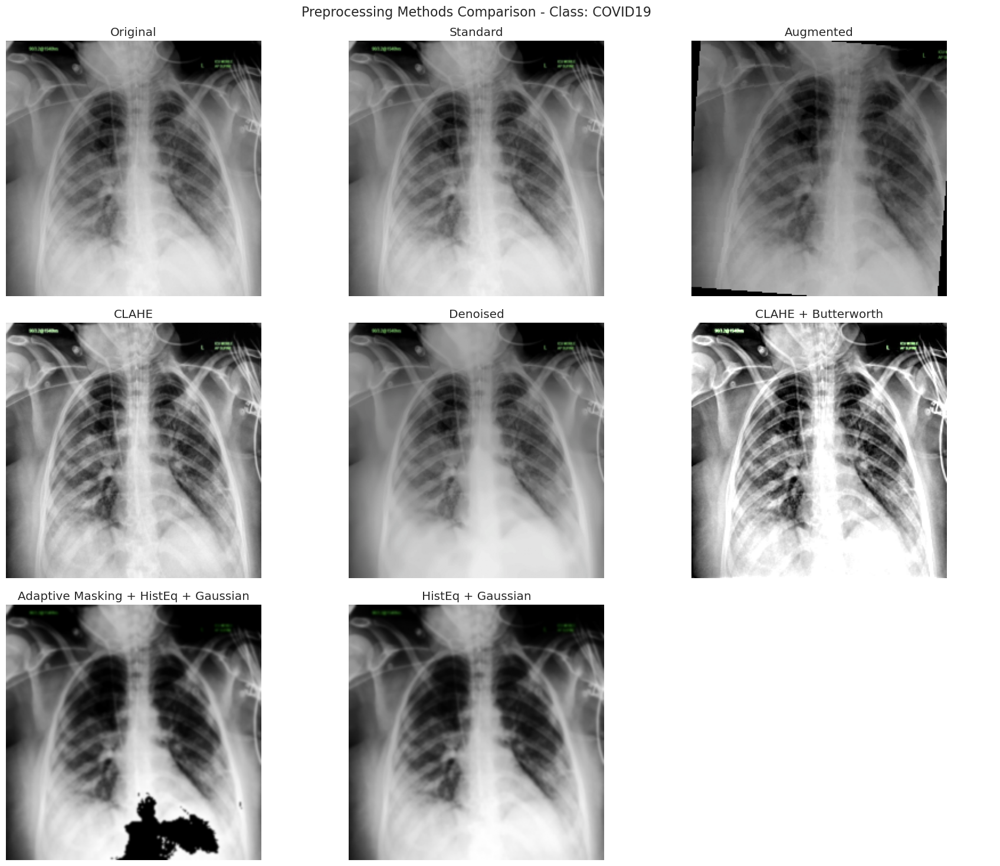

Saved visualization for COVID19
Processing NORMAL image...


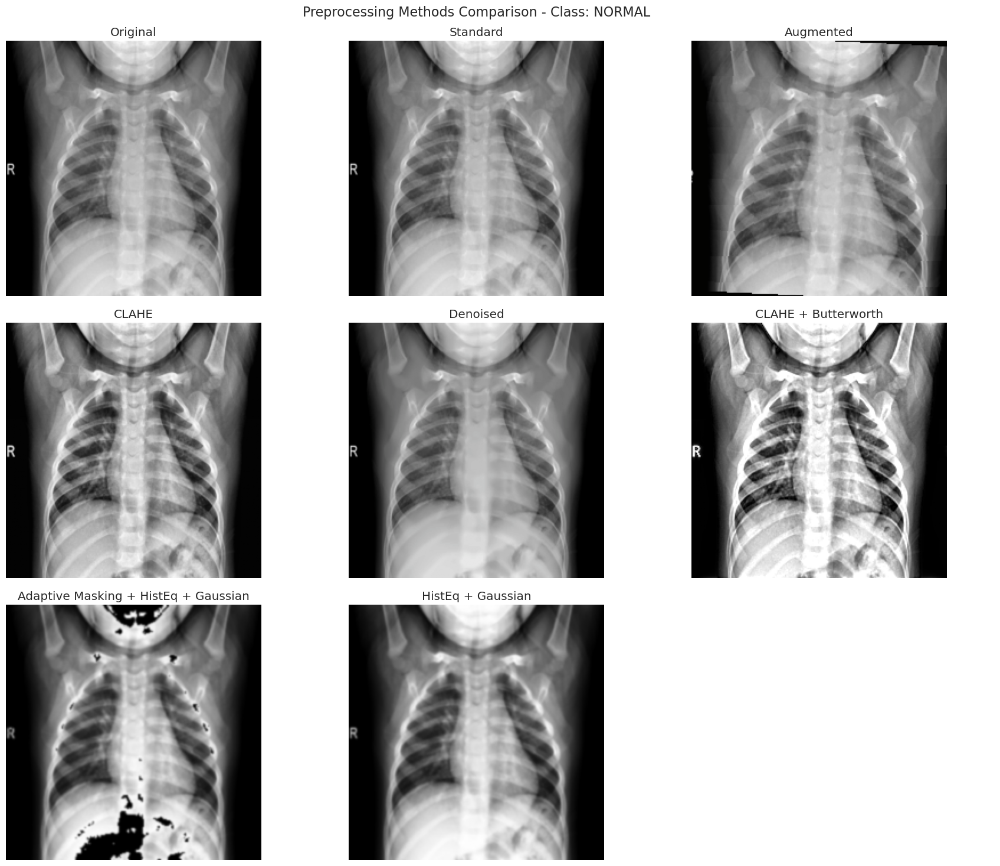

Saved visualization for NORMAL
Processing PNEUMONIA image...


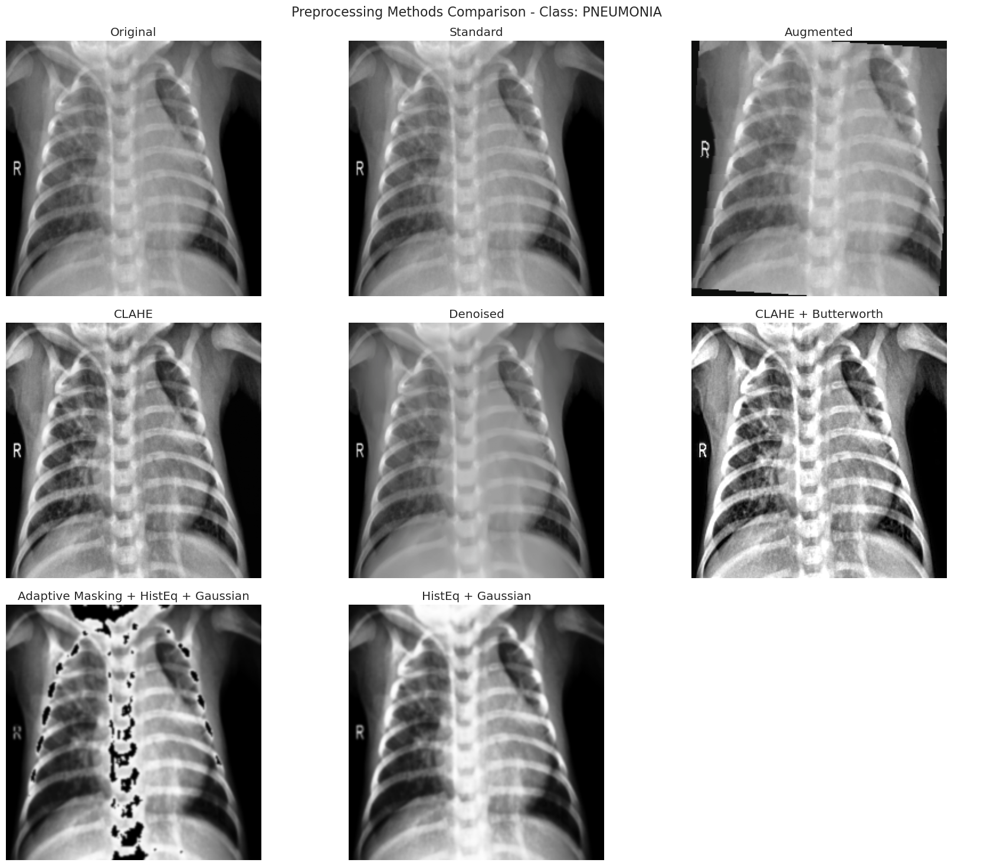

Saved visualization for PNEUMONIA


In [ ]:
visualize_preprocessing_methods(data_dir='./chest_xray_data/', 
                              classes=['COVID19', 'NORMAL', 'PNEUMONIA', 'TUBERCULOSIS'])

# ### Cell 11.1: Preprocessing Method: Standard


In [ ]:
print("\n=== Preprocessing Methods Experiment - Standard ===\n")
preprocessing_method = 'standard'
# Load datasets with current preprocessing method
data = load_datasets(preprocessing_method=preprocessing_method)
# Initialize model (using EfficientNet for faster training)
model = initialize_model('efficientnet_b0', num_classes=num_classes, feature_extract=True, use_pretrained=True)
for stage in model.features[-3:]:  
    for param in stage.parameters():
        param.requires_grad = True
model = model.to(device)
# Setup loss function with class weights
criterion = nn.CrossEntropyLoss(weight=data['class_weights'])
# Setup optimizer (Adam for faster convergence)
optimizer = optim.Adam(model.parameters(), lr=0.0003, weight_decay=1e-4)
# Setup learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3,
)
# Train model with early stopping
model, history = train_model(
    model, data, criterion, optimizer, scheduler, num_epochs=25, early_stopping_patience=10,
    is_weighted=True
)
# Evaluate model
eval_results = evaluate_model(model, data['test_loader'], criterion)
# Plot results
plot_training_history(history, title=f'Training History - {preprocessing_method.capitalize()} Preprocessing')
plot_confusion_matrix(
    eval_results['confusion_matrix'], data['class_names'], title=f'Confusion Matrix - {preprocessing_method.capitalize()} Preprocessing'
)
plot_roc_curves(eval_results, title=f'ROC Curves - {preprocessing_method.upper()}')
plot_classification_report(eval_results['classification_report'], title=f'Classification Report - {preprocessing_method.upper()}')
results_standard = {'standard': {'history': history, 'evaluation': eval_results, 'model': model}}



=== Preprocessing Methods Experiment - Standard ===

Loading datasets with standard preprocessing...


KeyboardInterrupt: 

# ### Cell 11.2: Preprocessing Method: Augmented


=== Preprocessing Methods Experiment - Augmented ===

Loading datasets with augmented preprocessing...


/tmp/ipykernel_19572/1996001161.py:38: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)



Class distribution:
COVID19: Train=414, Val=56, Test=106
NORMAL: Train=1207, Val=142, Test=234
PNEUMONIA: Train=3488, Val=395, Test=390
TURBERCULOSIS: Train=585, Val=76, Test=41
Converted efficientnet_b0 to channels-last format for improved GPU performance
Applied torch.compile() to efficientnet_b0 for accelerated execution
Model efficientnet_b0 initialized with 4,012,672 total parameters
Trainable parameters: 5,124 (0.13% of total)

Training for up to 25 epochs with early stopping patience 10...
Epoch 1/25
----------


train: 100%|██████████| 22/22 [00:27<00:00,  1.26s/it]


train Loss: 0.4778 Acc: 0.7525


val: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


val Loss: 0.6621 Acc: 0.7235

Epoch 2/25
----------


train: 100%|██████████| 22/22 [00:29<00:00,  1.34s/it]


train Loss: 0.0804 Acc: 0.9375


val: 100%|██████████| 3/3 [00:07<00:00,  2.47s/it]


val Loss: 0.4030 Acc: 0.8460

Epoch 3/25
----------


train: 100%|██████████| 22/22 [00:27<00:00,  1.24s/it]


train Loss: 0.0451 Acc: 0.9579


val: 100%|██████████| 3/3 [00:08<00:00,  2.76s/it]


val Loss: 0.3460 Acc: 0.8834

Epoch 4/25
----------


train: 100%|██████████| 22/22 [00:41<00:00,  1.90s/it]


train Loss: 0.0294 Acc: 0.9687


val: 100%|██████████| 3/3 [00:07<00:00,  2.42s/it]


val Loss: 0.3181 Acc: 0.8834

Epoch 5/25
----------


train: 100%|██████████| 22/22 [00:28<00:00,  1.28s/it]


train Loss: 0.0251 Acc: 0.9710


val: 100%|██████████| 3/3 [00:05<00:00,  1.77s/it]


val Loss: 0.3140 Acc: 0.8924

Epoch 6/25
----------


train: 100%|██████████| 22/22 [00:26<00:00,  1.22s/it]


train Loss: 0.0264 Acc: 0.9705


val: 100%|██████████| 3/3 [00:05<00:00,  1.76s/it]


val Loss: 0.2908 Acc: 0.8804

Epoch 7/25
----------


train: 100%|██████████| 22/22 [00:27<00:00,  1.24s/it]


train Loss: 0.0236 Acc: 0.9708


val: 100%|██████████| 3/3 [00:05<00:00,  1.76s/it]


val Loss: 1.6851 Acc: 0.8744

Epoch 8/25
----------


train: 100%|██████████| 22/22 [00:28<00:00,  1.31s/it]


train Loss: 0.0226 Acc: 0.9723


val: 100%|██████████| 3/3 [00:05<00:00,  1.76s/it]


val Loss: 0.4509 Acc: 0.8371

Epoch 9/25
----------


train: 100%|██████████| 22/22 [00:27<00:00,  1.27s/it]


train Loss: 0.0149 Acc: 0.9763


val: 100%|██████████| 3/3 [00:05<00:00,  1.76s/it]


val Loss: 0.3338 Acc: 0.9193

Epoch 10/25
----------


train: 100%|██████████| 22/22 [00:26<00:00,  1.22s/it]


train Loss: 0.0134 Acc: 0.9784


val: 100%|██████████| 3/3 [00:05<00:00,  1.76s/it]


val Loss: 0.6385 Acc: 0.9043
Learning rate adjusted from 0.000300 to 0.000150

Epoch 11/25
----------


train: 100%|██████████| 22/22 [00:27<00:00,  1.23s/it]


train Loss: 0.0124 Acc: 0.9793


val: 100%|██████████| 3/3 [00:05<00:00,  1.76s/it]


val Loss: 0.2141 Acc: 0.9193

Epoch 12/25
----------


train: 100%|██████████| 22/22 [00:28<00:00,  1.30s/it]


train Loss: 0.0132 Acc: 0.9775


val: 100%|██████████| 3/3 [00:05<00:00,  1.76s/it]


val Loss: 0.2503 Acc: 0.9208

Epoch 13/25
----------


train: 100%|██████████| 22/22 [00:27<00:00,  1.23s/it]


train Loss: 0.0102 Acc: 0.9798


val: 100%|██████████| 3/3 [00:05<00:00,  1.78s/it]


val Loss: 0.1993 Acc: 0.9268

Epoch 14/25
----------


train: 100%|██████████| 22/22 [00:26<00:00,  1.20s/it]


train Loss: 0.0099 Acc: 0.9796


val: 100%|██████████| 3/3 [00:05<00:00,  1.78s/it]


val Loss: 0.2311 Acc: 0.9133

Epoch 15/25
----------


train: 100%|██████████| 22/22 [00:28<00:00,  1.28s/it]


train Loss: 0.0088 Acc: 0.9830


val: 100%|██████████| 3/3 [00:05<00:00,  1.79s/it]


val Loss: 0.3616 Acc: 0.9238

Epoch 16/25
----------


train: 100%|██████████| 22/22 [00:27<00:00,  1.25s/it]


train Loss: 0.0100 Acc: 0.9800


val: 100%|██████████| 3/3 [00:05<00:00,  1.76s/it]


val Loss: 0.9235 Acc: 0.9283

Epoch 17/25
----------


train: 100%|██████████| 22/22 [00:28<00:00,  1.29s/it]


train Loss: 0.0090 Acc: 0.9803


val: 100%|██████████| 3/3 [00:05<00:00,  1.76s/it]


val Loss: 0.2691 Acc: 0.9402
Learning rate adjusted from 0.000150 to 0.000075

Epoch 18/25
----------


train: 100%|██████████| 22/22 [00:27<00:00,  1.25s/it]


train Loss: 0.0072 Acc: 0.9828


val: 100%|██████████| 3/3 [00:05<00:00,  1.76s/it]


val Loss: 0.2345 Acc: 0.9193

Epoch 19/25
----------


train: 100%|██████████| 22/22 [00:27<00:00,  1.24s/it]


train Loss: 0.0062 Acc: 0.9840


val: 100%|██████████| 3/3 [00:05<00:00,  1.80s/it]


val Loss: 0.2053 Acc: 0.9283

Epoch 20/25
----------


train: 100%|██████████| 22/22 [00:28<00:00,  1.29s/it]


train Loss: 0.0078 Acc: 0.9817


val: 100%|██████████| 3/3 [00:05<00:00,  1.76s/it]


val Loss: 0.2022 Acc: 0.9327

Epoch 21/25
----------


train: 100%|██████████| 22/22 [00:26<00:00,  1.20s/it]


train Loss: 0.0067 Acc: 0.9838


val: 100%|██████████| 3/3 [00:05<00:00,  1.76s/it]


val Loss: 0.1926 Acc: 0.9283

Epoch 22/25
----------


train: 100%|██████████| 22/22 [00:28<00:00,  1.31s/it]


train Loss: 0.0067 Acc: 0.9838


val: 100%|██████████| 3/3 [00:05<00:00,  1.76s/it]


val Loss: 0.2079 Acc: 0.9253

Epoch 23/25
----------


train: 100%|██████████| 22/22 [00:30<00:00,  1.37s/it]


train Loss: 0.0066 Acc: 0.9837


val: 100%|██████████| 3/3 [00:05<00:00,  1.77s/it]


val Loss: 0.1897 Acc: 0.9357

Epoch 24/25
----------


train: 100%|██████████| 22/22 [00:27<00:00,  1.23s/it]


train Loss: 0.0073 Acc: 0.9830


val: 100%|██████████| 3/3 [00:05<00:00,  1.76s/it]


val Loss: 0.2267 Acc: 0.9283

Epoch 25/25
----------


train: 100%|██████████| 22/22 [00:28<00:00,  1.28s/it]


train Loss: 0.0081 Acc: 0.9823


val: 100%|██████████| 3/3 [00:05<00:00,  1.76s/it]


val Loss: 0.3537 Acc: 0.9283

Training complete in 14m 11s
Best val Acc: 0.9402 at epoch 17


Evaluating: 100%|██████████| 4/4 [00:06<00:00,  1.62s/it]


Test Loss: 0.1151, Test Acc: 0.9481
Macro ROC AUC: 0.9930


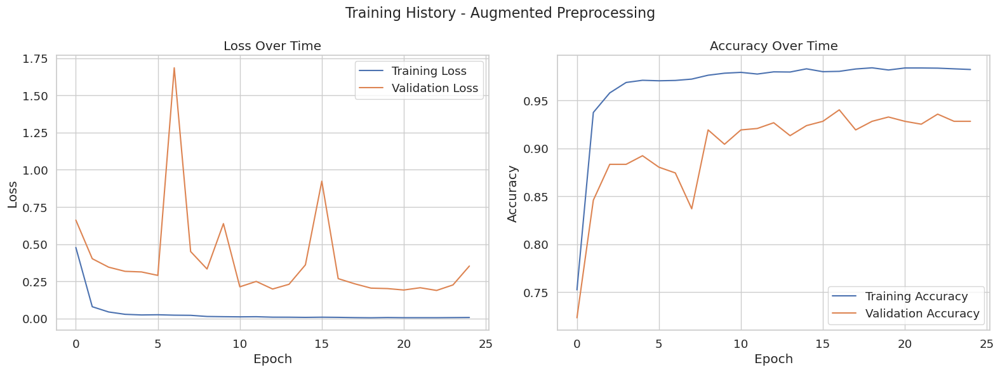

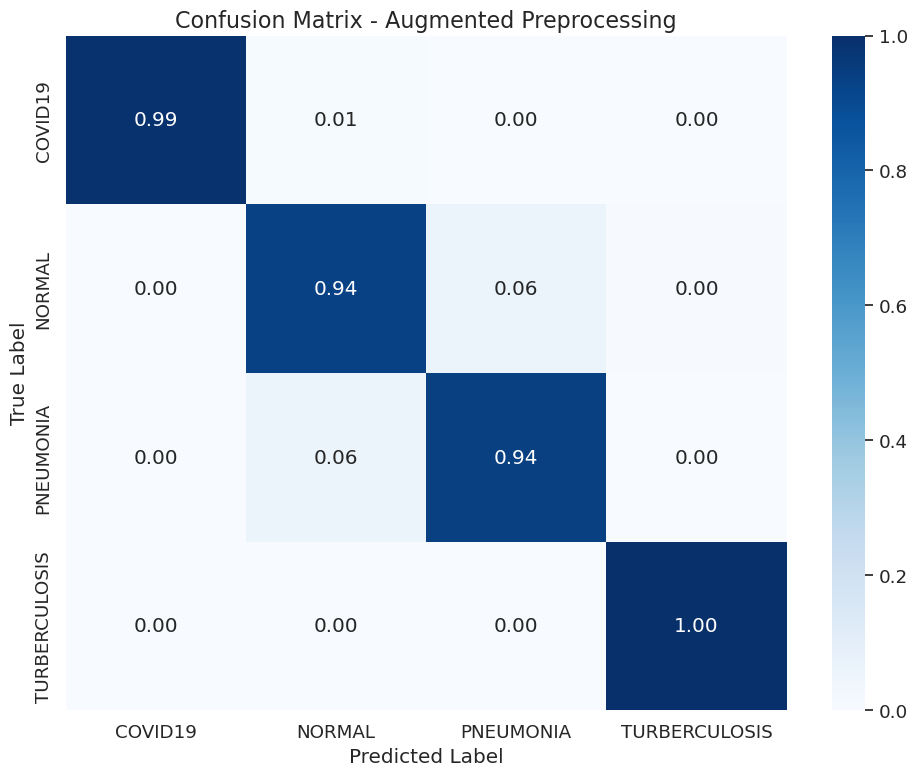

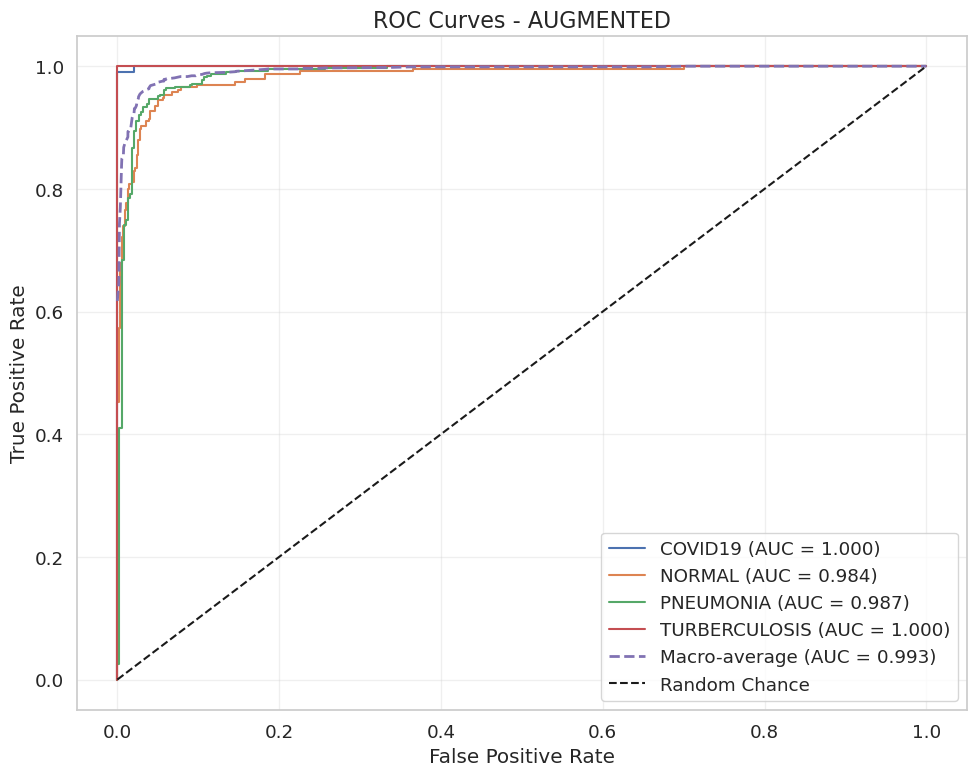

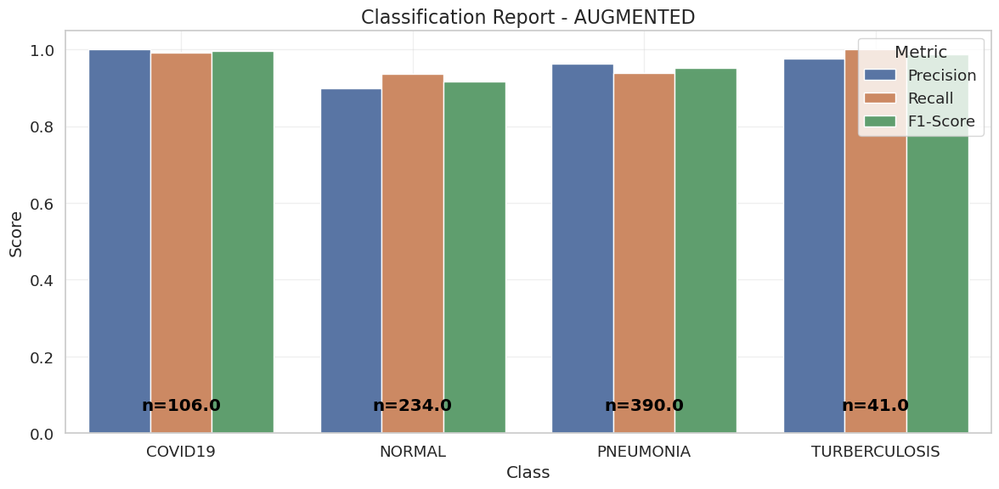

In [ ]:
print("\n=== Preprocessing Methods Experiment - Augmented ===\n")
preprocessing_method = 'augmented'
# Load datasets with current preprocessing method
data = load_datasets(preprocessing_method=preprocessing_method)
# Initialize model (using EfficientNet for faster training)
model = initialize_model('efficientnet_b0', num_classes=num_classes, feature_extract=True, use_pretrained=True)
for stage in model.features[-3:]:  
    for param in stage.parameters():
        param.requires_grad = True
model = model.to(device)
# Setup loss function with class weights
criterion = nn.CrossEntropyLoss(weight=data['class_weights'])
# Setup optimizer (Adam for faster convergence)
optimizer = optim.Adam(model.parameters(), lr=0.0003, weight_decay=1e-4)
# Setup learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3,
)
# Train model with early stopping
model, history = train_model(
    model, data, criterion, optimizer, scheduler, num_epochs=25, early_stopping_patience=10,
    is_weighted=True
)
# Evaluate model
eval_results = evaluate_model(model, data['test_loader'], criterion)
# Plot results
plot_training_history(history, title=f'Training History - {preprocessing_method.capitalize()} Preprocessing')
plot_confusion_matrix(
    eval_results['confusion_matrix'], data['class_names'], title=f'Confusion Matrix - {preprocessing_method.capitalize()} Preprocessing'
)
plot_roc_curves(eval_results, title=f'ROC Curves - {preprocessing_method.upper()}')
plot_classification_report(eval_results['classification_report'], title=f'Classification Report - {preprocessing_method.upper()}')
results_augmented = {'augmented': {'history': history, 'evaluation': eval_results, 'model': model}}


# ### Cell 11.3: Preprocessing Method: CLAHE


=== Preprocessing Methods Experiment - CLAHE ===

Loading datasets with clahe preprocessing...

Class distribution:
COVID19: Train=414, Val=56, Test=106
NORMAL: Train=1207, Val=142, Test=234
PNEUMONIA: Train=3488, Val=395, Test=390
TURBERCULOSIS: Train=585, Val=76, Test=41


/tmp/ipykernel_19572/1996001161.py:38: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)


Converted efficientnet_b0 to channels-last format for improved GPU performance
Applied torch.compile() to efficientnet_b0 for accelerated execution
Model efficientnet_b0 initialized with 4,012,672 total parameters
Trainable parameters: 5,124 (0.13% of total)

Training for up to 25 epochs with early stopping patience 7...
Epoch 1/25
----------


train: 100%|██████████| 22/22 [01:51<00:00,  5.07s/it]


train Loss: 0.4223 Acc: 0.7726


val: 100%|██████████| 3/3 [00:10<00:00,  3.57s/it]


val Loss: 0.4383 Acc: 0.8505

Epoch 2/25
----------


train: 100%|██████████| 22/22 [01:48<00:00,  4.95s/it]


train Loss: 0.0514 Acc: 0.9554


val: 100%|██████████| 3/3 [00:12<00:00,  4.05s/it]


val Loss: 0.2165 Acc: 0.9073

Epoch 3/25
----------


train: 100%|██████████| 22/22 [01:48<00:00,  4.95s/it]


train Loss: 0.0245 Acc: 0.9726


val: 100%|██████████| 3/3 [00:12<00:00,  4.19s/it]


val Loss: 0.1271 Acc: 0.9552

Epoch 4/25
----------


train: 100%|██████████| 22/22 [01:51<00:00,  5.06s/it]


train Loss: 0.0167 Acc: 0.9726


val: 100%|██████████| 3/3 [00:11<00:00,  3.88s/it]


val Loss: 0.5865 Acc: 0.9596

Epoch 5/25
----------


train: 100%|██████████| 22/22 [01:47<00:00,  4.88s/it]


train Loss: 0.0111 Acc: 0.9798


val: 100%|██████████| 3/3 [00:12<00:00,  4.06s/it]


val Loss: 0.0646 Acc: 0.9761

Epoch 6/25
----------


train: 100%|██████████| 22/22 [01:49<00:00,  4.99s/it]


train Loss: 0.0109 Acc: 0.9802


val: 100%|██████████| 3/3 [00:13<00:00,  4.38s/it]


val Loss: 0.4423 Acc: 0.9806

Epoch 7/25
----------


train: 100%|██████████| 22/22 [01:49<00:00,  4.99s/it]


train Loss: 0.0092 Acc: 0.9817


val: 100%|██████████| 3/3 [00:13<00:00,  4.52s/it]


val Loss: 0.2683 Acc: 0.9791

Epoch 8/25
----------


train: 100%|██████████| 22/22 [01:53<00:00,  5.17s/it]


train Loss: 0.0089 Acc: 0.9826


val: 100%|██████████| 3/3 [00:12<00:00,  4.18s/it]


val Loss: 0.6349 Acc: 0.9776

Epoch 9/25
----------


train: 100%|██████████| 22/22 [01:53<00:00,  5.16s/it]


train Loss: 0.0064 Acc: 0.9838


val: 100%|██████████| 3/3 [00:11<00:00,  3.85s/it]


val Loss: 0.0798 Acc: 0.9716
Learning rate adjusted from 0.000300 to 0.000150

Epoch 10/25
----------


train: 100%|██████████| 22/22 [01:50<00:00,  5.00s/it]


train Loss: 0.0047 Acc: 0.9840


val: 100%|██████████| 3/3 [00:11<00:00,  3.93s/it]


val Loss: 0.0610 Acc: 0.9776

Epoch 11/25
----------


train: 100%|██████████| 22/22 [01:49<00:00,  4.99s/it]


train Loss: 0.0038 Acc: 0.9852


val: 100%|██████████| 3/3 [00:10<00:00,  3.48s/it]


val Loss: 0.0729 Acc: 0.9746

Epoch 12/25
----------


train: 100%|██████████| 22/22 [02:02<00:00,  5.59s/it]


train Loss: 0.0041 Acc: 0.9847


val: 100%|██████████| 3/3 [00:17<00:00,  5.98s/it]


val Loss: 0.6274 Acc: 0.9746

Epoch 13/25
----------


train: 100%|██████████| 22/22 [02:10<00:00,  5.95s/it]


train Loss: 0.0037 Acc: 0.9865


val: 100%|██████████| 3/3 [00:17<00:00,  5.91s/it]


val Loss: 0.2375 Acc: 0.9716

Early stopping triggered after 13 epochs
Training complete in 27m 17s
Best val Acc: 0.9806 at epoch 6


Evaluating: 100%|██████████| 4/4 [00:15<00:00,  3.98s/it]


Test Loss: 0.4691, Test Acc: 0.8936
Macro ROC AUC: 0.9881


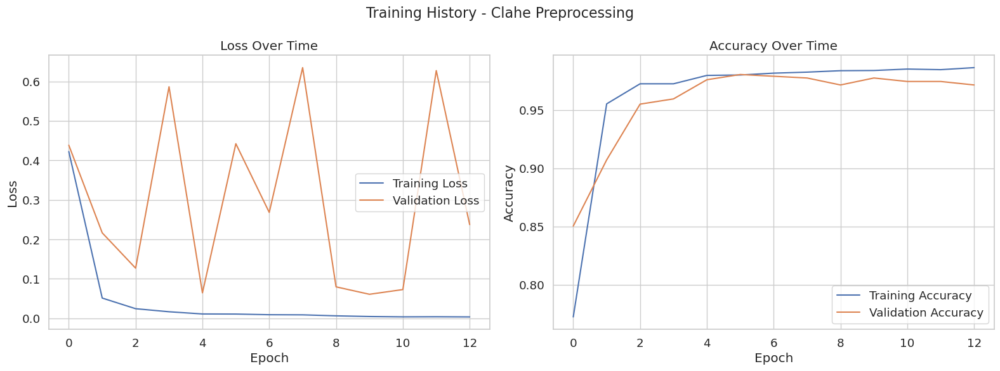

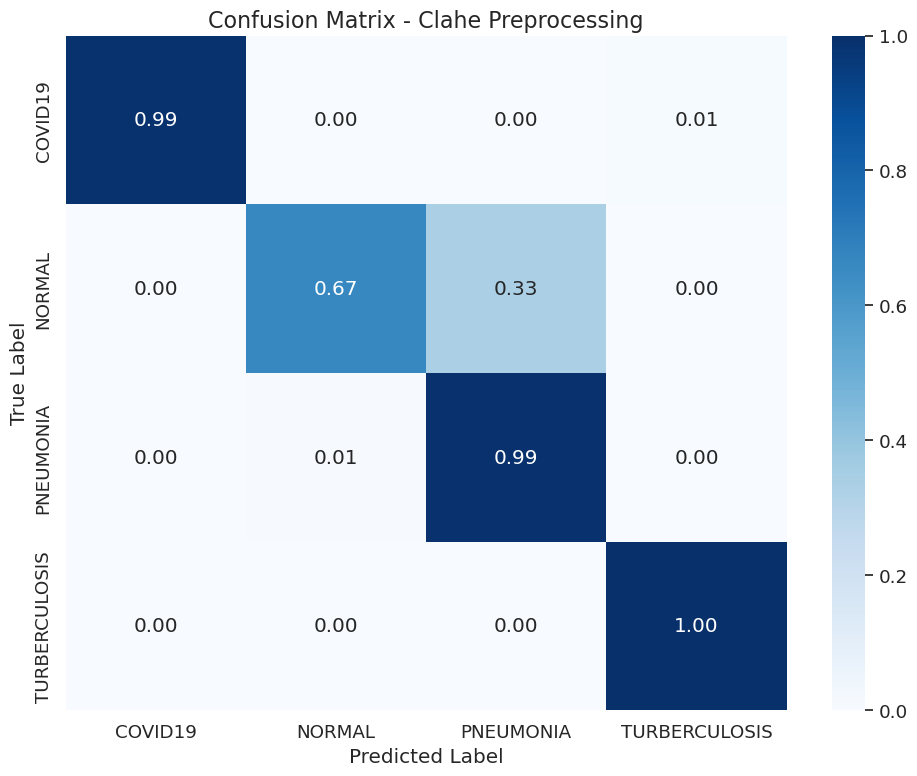

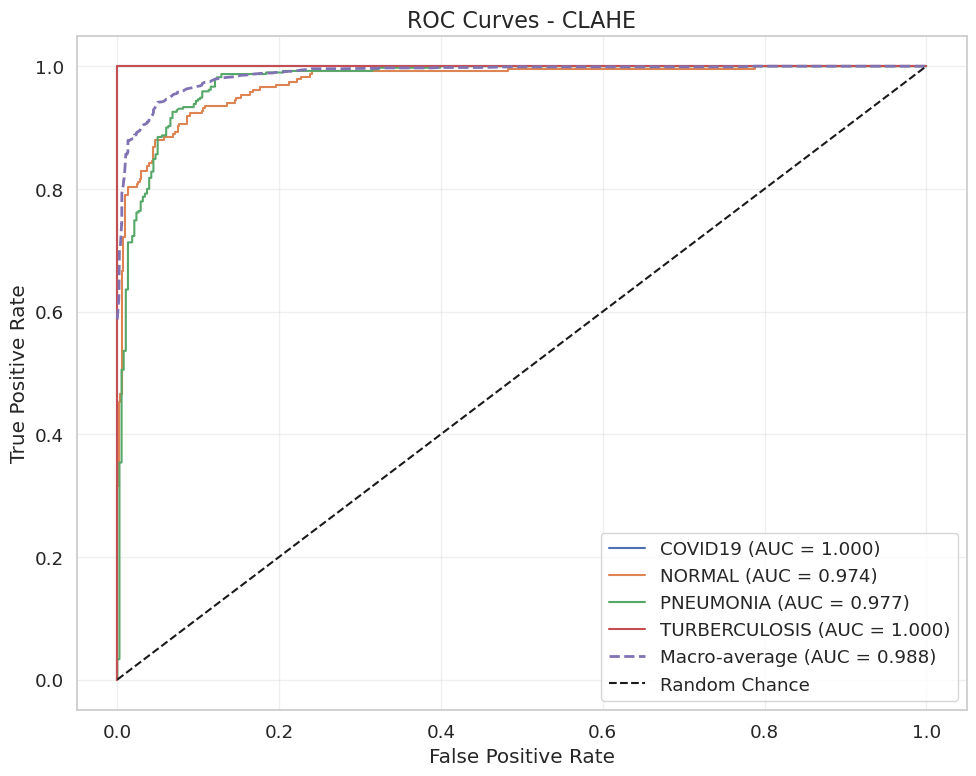

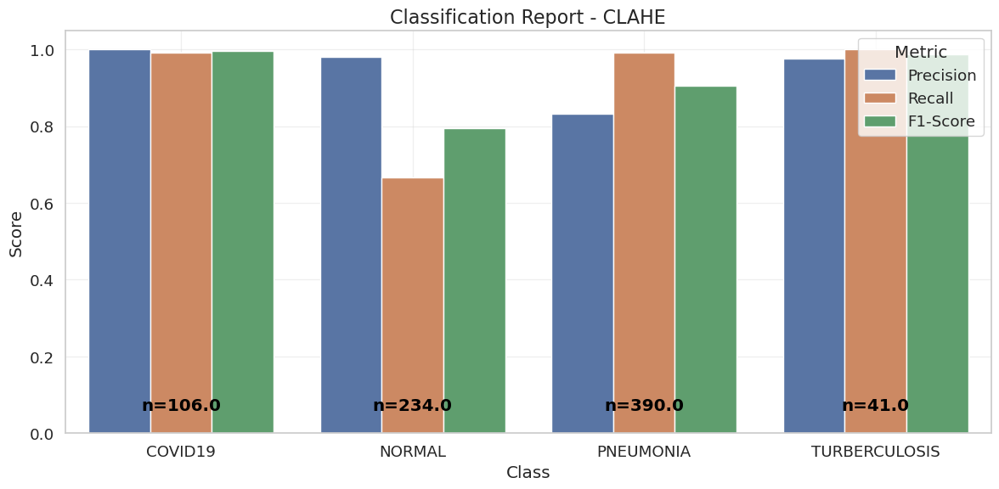

In [ ]:
print("\n=== Preprocessing Methods Experiment - CLAHE ===\n")
preprocessing_method = 'clahe'
# Load datasets with current preprocessing method
data = load_datasets(preprocessing_method=preprocessing_method)
# Initialize model (using EfficientNet for faster training)
model = initialize_model('efficientnet_b0', num_classes=num_classes, feature_extract=True, use_pretrained=True)
for stage in model.features[-3:]:  
    for param in stage.parameters():
        param.requires_grad = True
model = model.to(device)
# Setup loss function with class weights
criterion = nn.CrossEntropyLoss(weight=data['class_weights'])
# Setup optimizer (Adam for faster convergence)
optimizer = optim.Adam(model.parameters(), lr=0.0003, weight_decay=1e-4)
# Setup learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3,
)
# Train model with early stopping
model, history = train_model(
    model, data, criterion, optimizer, scheduler, num_epochs=25, # Fewer epochs for faster experiments
    is_weighted=True
)
# Evaluate model
eval_results = evaluate_model(model, data['test_loader'], criterion)
# Plot results
plot_training_history(history, title=f'Training History - {preprocessing_method.capitalize()} Preprocessing')
plot_confusion_matrix(
    eval_results['confusion_matrix'], data['class_names'], title=f'Confusion Matrix - {preprocessing_method.capitalize()} Preprocessing'
)
plot_roc_curves(eval_results, title=f'ROC Curves - {preprocessing_method.upper()}')
plot_classification_report(eval_results['classification_report'], title=f'Classification Report - {preprocessing_method.upper()}')
results_clahe = {'clahe': {'history': history, 'evaluation': eval_results, 'model': model}}


# ### Cell 11.4: Preprocessing Method: Denoise


=== Preprocessing Methods Experiment - Denoise ===

Loading datasets with denoise preprocessing...

Class distribution:
COVID19: Train=414, Val=56, Test=106
NORMAL: Train=1207, Val=142, Test=234
PNEUMONIA: Train=3488, Val=395, Test=390
TURBERCULOSIS: Train=585, Val=76, Test=41


/tmp/ipykernel_19572/1996001161.py:38: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)


Converted efficientnet_b0 to channels-last format for improved GPU performance
Applied torch.compile() to efficientnet_b0 for accelerated execution
Model efficientnet_b0 initialized with 4,012,672 total parameters
Trainable parameters: 4,012,672 (100.00% of total)

Training for up to 25 epochs with early stopping patience 7...
Epoch 1/25
----------


train: 100%|██████████| 22/22 [02:08<00:00,  5.83s/it]


train Loss: 0.3660 Acc: 0.8109


val: 100%|██████████| 3/3 [00:22<00:00,  7.49s/it]


val Loss: 0.4718 Acc: 0.8700

Epoch 2/25
----------


train: 100%|██████████| 22/22 [02:10<00:00,  5.94s/it]


train Loss: 0.0370 Acc: 0.9603


val: 100%|██████████| 3/3 [00:22<00:00,  7.47s/it]


val Loss: 0.1657 Acc: 0.9492

Epoch 3/25
----------


train: 100%|██████████| 22/22 [02:08<00:00,  5.83s/it]


train Loss: 0.0140 Acc: 0.9779


val: 100%|██████████| 3/3 [00:22<00:00,  7.51s/it]


val Loss: 0.1742 Acc: 0.9507

Epoch 4/25
----------


train: 100%|██████████| 22/22 [02:20<00:00,  6.38s/it]


train Loss: 0.0166 Acc: 0.9782


val: 100%|██████████| 3/3 [00:26<00:00,  8.71s/it]


val Loss: 0.1137 Acc: 0.9626

Epoch 5/25
----------


train: 100%|██████████| 22/22 [02:15<00:00,  6.14s/it]


train Loss: 0.0103 Acc: 0.9809


val: 100%|██████████| 3/3 [00:23<00:00,  7.74s/it]


val Loss: 0.2483 Acc: 0.9836

Epoch 6/25
----------


train: 100%|██████████| 22/22 [02:09<00:00,  5.88s/it]


train Loss: 0.0092 Acc: 0.9816


val: 100%|██████████| 3/3 [00:22<00:00,  7.44s/it]


val Loss: 0.0845 Acc: 0.9821

Epoch 7/25
----------


train: 100%|██████████| 22/22 [02:09<00:00,  5.89s/it]


train Loss: 0.0065 Acc: 0.9854


val: 100%|██████████| 3/3 [00:22<00:00,  7.44s/it]


val Loss: 0.1274 Acc: 0.9671

Epoch 8/25
----------


train: 100%|██████████| 22/22 [02:07<00:00,  5.81s/it]


train Loss: 0.0093 Acc: 0.9835


val: 100%|██████████| 3/3 [00:22<00:00,  7.46s/it]


val Loss: 0.5659 Acc: 0.9821

Epoch 9/25
----------


train: 100%|██████████| 22/22 [02:08<00:00,  5.83s/it]


train Loss: 0.0052 Acc: 0.9858


val: 100%|██████████| 3/3 [00:22<00:00,  7.49s/it]


val Loss: 0.1273 Acc: 0.9821

Epoch 10/25
----------


train: 100%|██████████| 22/22 [02:08<00:00,  5.82s/it]


train Loss: 0.0044 Acc: 0.9856


val: 100%|██████████| 3/3 [00:22<00:00,  7.66s/it]


val Loss: 0.0516 Acc: 0.9851

Epoch 11/25
----------


train: 100%|██████████| 22/22 [02:10<00:00,  5.93s/it]


train Loss: 0.0031 Acc: 0.9865


val: 100%|██████████| 3/3 [00:22<00:00,  7.51s/it]


val Loss: 0.0588 Acc: 0.9836

Epoch 12/25
----------


train: 100%|██████████| 22/22 [02:07<00:00,  5.79s/it]


train Loss: 0.0020 Acc: 0.9874


val: 100%|██████████| 3/3 [00:22<00:00,  7.47s/it]


val Loss: 0.0527 Acc: 0.9865

Epoch 13/25
----------


train: 100%|██████████| 22/22 [02:09<00:00,  5.89s/it]


train Loss: 0.0034 Acc: 0.9861


val: 100%|██████████| 3/3 [00:22<00:00,  7.44s/it]


val Loss: 0.0510 Acc: 0.9880

Epoch 14/25
----------


train: 100%|██████████| 22/22 [02:07<00:00,  5.82s/it]


train Loss: 0.0021 Acc: 0.9867


val: 100%|██████████| 3/3 [00:22<00:00,  7.48s/it]


val Loss: 0.0697 Acc: 0.9776

Epoch 15/25
----------


train: 100%|██████████| 22/22 [02:08<00:00,  5.83s/it]


train Loss: 0.0025 Acc: 0.9865


val: 100%|██████████| 3/3 [00:22<00:00,  7.47s/it]


val Loss: 0.0502 Acc: 0.9821

Epoch 16/25
----------


train: 100%|██████████| 22/22 [02:08<00:00,  5.84s/it]


train Loss: 0.0040 Acc: 0.9867


val: 100%|██████████| 3/3 [00:22<00:00,  7.43s/it]


val Loss: 0.0617 Acc: 0.9776

Epoch 17/25
----------


train: 100%|██████████| 22/22 [02:08<00:00,  5.82s/it]


train Loss: 0.0025 Acc: 0.9868


val: 100%|██████████| 3/3 [00:22<00:00,  7.54s/it]


val Loss: 0.0741 Acc: 0.9746

Epoch 18/25
----------


train: 100%|██████████| 22/22 [02:11<00:00,  5.97s/it]


train Loss: 0.0046 Acc: 0.9854


val: 100%|██████████| 3/3 [00:23<00:00,  7.84s/it]


val Loss: 0.0668 Acc: 0.9806

Epoch 19/25
----------


train: 100%|██████████| 22/22 [02:10<00:00,  5.95s/it]


train Loss: 0.0032 Acc: 0.9860


val: 100%|██████████| 3/3 [00:22<00:00,  7.50s/it]


val Loss: 0.0660 Acc: 0.9880
Learning rate adjusted from 0.000300 to 0.000150

Epoch 20/25
----------


train: 100%|██████████| 22/22 [02:11<00:00,  5.99s/it]


train Loss: 0.0021 Acc: 0.9865


val: 100%|██████████| 3/3 [00:22<00:00,  7.45s/it]


val Loss: 0.0590 Acc: 0.9940

Epoch 21/25
----------


train: 100%|██████████| 22/22 [02:08<00:00,  5.83s/it]


train Loss: 0.0018 Acc: 0.9881


val: 100%|██████████| 3/3 [00:22<00:00,  7.51s/it]


val Loss: 0.0658 Acc: 0.9851

Epoch 22/25
----------


train: 100%|██████████| 22/22 [02:10<00:00,  5.94s/it]


train Loss: 0.0014 Acc: 0.9877


val: 100%|██████████| 3/3 [00:22<00:00,  7.45s/it]


val Loss: 0.1972 Acc: 0.9865

Epoch 23/25
----------


train: 100%|██████████| 22/22 [02:10<00:00,  5.91s/it]


train Loss: 0.0013 Acc: 0.9879


val: 100%|██████████| 3/3 [00:22<00:00,  7.46s/it]


val Loss: 0.0978 Acc: 0.9821
Learning rate adjusted from 0.000150 to 0.000075

Epoch 24/25
----------


train: 100%|██████████| 22/22 [02:07<00:00,  5.80s/it]


train Loss: 0.0006 Acc: 0.9888


val: 100%|██████████| 3/3 [00:22<00:00,  7.42s/it]


val Loss: 0.1062 Acc: 0.9851

Epoch 25/25
----------


train: 100%|██████████| 22/22 [02:09<00:00,  5.91s/it]


train Loss: 0.0008 Acc: 0.9881


val: 100%|██████████| 3/3 [00:22<00:00,  7.43s/it]


val Loss: 0.0844 Acc: 0.9895

Training complete in 63m 33s
Best val Acc: 0.9940 at epoch 20


Evaluating: 100%|██████████| 4/4 [00:23<00:00,  5.88s/it]


Test Loss: 0.9177, Test Acc: 0.8547
Macro ROC AUC: 0.9880


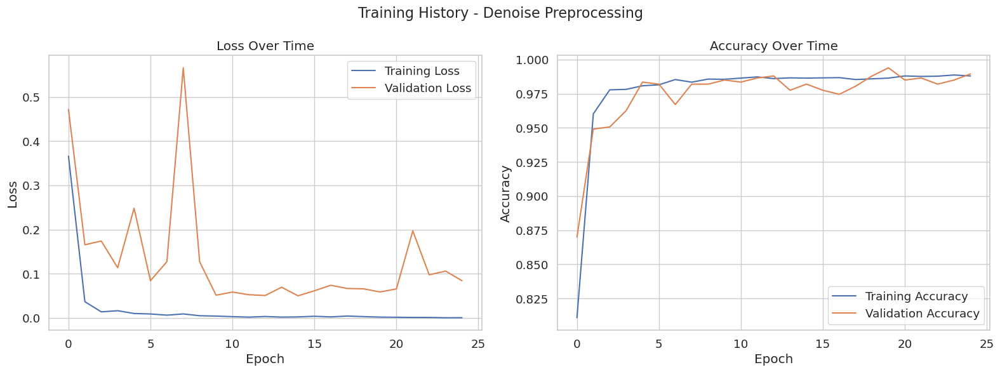

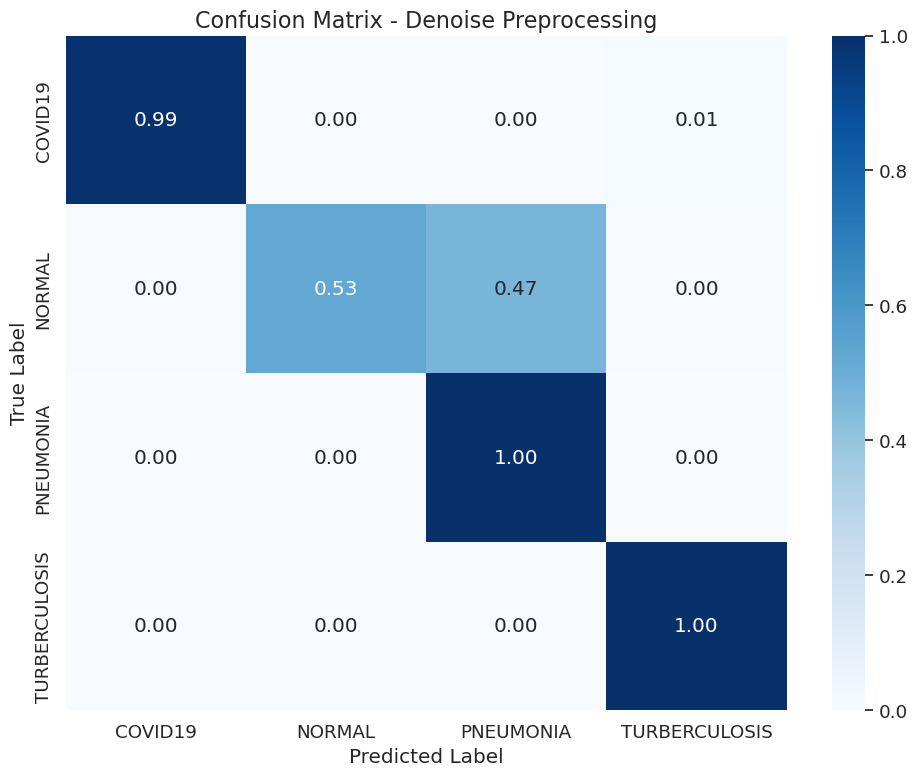

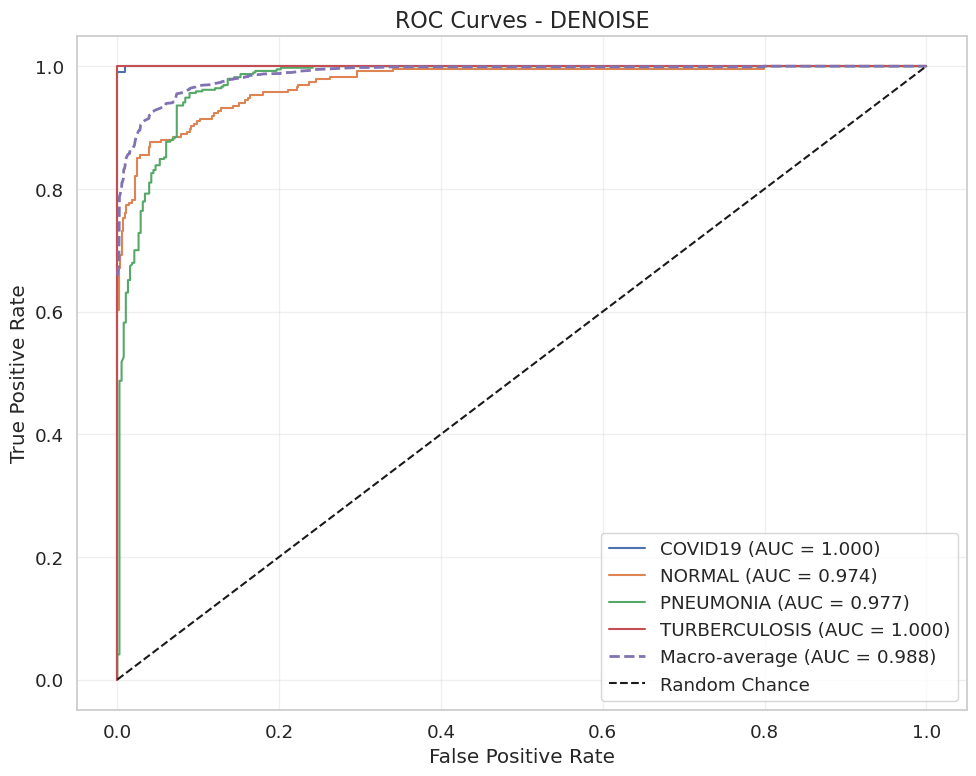

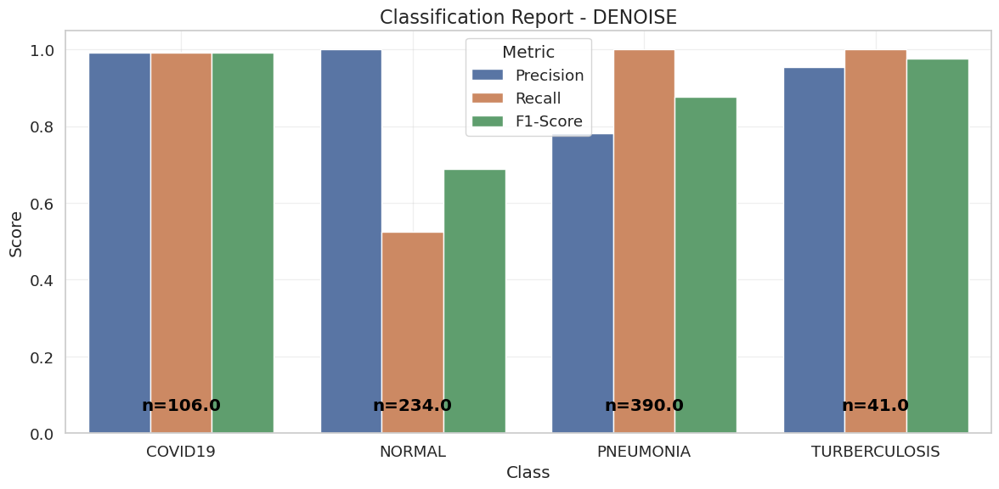

In [ ]:
print("\n=== Preprocessing Methods Experiment - Denoise ===\n")
preprocessing_method = 'denoise'
# Load datasets with current preprocessing method
data = load_datasets(preprocessing_method=preprocessing_method)
# Initialize model (using EfficientNet for faster training)
model = initialize_model('efficientnet_b0', num_classes=num_classes, feature_extract=False, use_pretrained=True)
for stage in model.features[-3:]:  
    for param in stage.parameters():
        param.requires_grad = True
model = model.to(device)
# Setup loss function with class weights
criterion = nn.CrossEntropyLoss(weight=data['class_weights'])
# Setup optimizer (Adam for faster convergence)
optimizer = optim.Adam(model.parameters(), lr=0.0003, weight_decay=1e-4)
# Setup learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3,
)
# Train model with early stopping
model, history = train_model(
    model, data, criterion, optimizer, scheduler, num_epochs=25, early_stopping_patience=7,# Fewer epochs for faster experiments
    is_weighted=True
)
# Evaluate model
eval_results = evaluate_model(model, data['test_loader'], criterion)
# Plot results
plot_training_history(history, title=f'Training History - {preprocessing_method.capitalize()} Preprocessing')
plot_confusion_matrix(
    eval_results['confusion_matrix'], data['class_names'], title=f'Confusion Matrix - {preprocessing_method.capitalize()} Preprocessing'
)
plot_roc_curves(eval_results, title=f'ROC Curves - {preprocessing_method.upper()}')
plot_classification_report(eval_results['classification_report'], title=f'Classification Report - {preprocessing_method.upper()}')
results_denoise = {'denoise': {'history': history, 'evaluation': eval_results, 'model': model}}


# ### Cell 11.5: Preprocessing Method: CLAHE_Butterworth


=== Preprocessing Methods Experiment - CLAHE + Butterworth ===

Loading datasets with clahe_butterworth preprocessing...

Class distribution:
COVID19: Train=414, Val=56, Test=106
NORMAL: Train=1207, Val=142, Test=234
PNEUMONIA: Train=3488, Val=395, Test=390
TURBERCULOSIS: Train=585, Val=76, Test=41


/tmp/ipykernel_19572/1996001161.py:38: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)


Converted efficientnet_b0 to channels-last format for improved GPU performance
Applied torch.compile() to efficientnet_b0 for accelerated execution
Model efficientnet_b0 initialized with 4,012,672 total parameters
Trainable parameters: 4,012,672 (100.00% of total)

Training for up to 25 epochs with early stopping patience 7...
Epoch 1/25
----------


train: 100%|██████████| 22/22 [02:30<00:00,  6.82s/it]


train Loss: 0.3498 Acc: 0.8103


val: 100%|██████████| 3/3 [00:15<00:00,  5.20s/it]


val Loss: 0.2854 Acc: 0.9223

Epoch 2/25
----------


train: 100%|██████████| 22/22 [02:37<00:00,  7.17s/it]


train Loss: 0.0349 Acc: 0.9593


val: 100%|██████████| 3/3 [00:16<00:00,  5.45s/it]


val Loss: 0.1468 Acc: 0.9462

Epoch 3/25
----------


train: 100%|██████████| 22/22 [02:36<00:00,  7.09s/it]


train Loss: 0.0193 Acc: 0.9749


val: 100%|██████████| 3/3 [00:16<00:00,  5.42s/it]


val Loss: 0.0906 Acc: 0.9716

Epoch 4/25
----------


train: 100%|██████████| 22/22 [02:33<00:00,  7.00s/it]


train Loss: 0.0126 Acc: 0.9795


val: 100%|██████████| 3/3 [00:16<00:00,  5.41s/it]


val Loss: 0.0739 Acc: 0.9761

Epoch 5/25
----------


train: 100%|██████████| 22/22 [02:44<00:00,  7.46s/it]


train Loss: 0.0093 Acc: 0.9805


val: 100%|██████████| 3/3 [00:15<00:00,  5.26s/it]


val Loss: 0.0964 Acc: 0.9626

Epoch 6/25
----------


train: 100%|██████████| 22/22 [02:36<00:00,  7.13s/it]


train Loss: 0.0083 Acc: 0.9816


val: 100%|██████████| 3/3 [00:17<00:00,  5.71s/it]


val Loss: 0.0442 Acc: 0.9910

Epoch 7/25
----------


train: 100%|██████████| 22/22 [02:53<00:00,  7.88s/it]


train Loss: 0.0082 Acc: 0.9838


val: 100%|██████████| 3/3 [00:14<00:00,  4.98s/it]


val Loss: 0.1030 Acc: 0.9806

Epoch 8/25
----------


train: 100%|██████████| 22/22 [02:41<00:00,  7.32s/it]


train Loss: 0.0045 Acc: 0.9852


val: 100%|██████████| 3/3 [00:15<00:00,  5.18s/it]


val Loss: 0.0904 Acc: 0.9806

Epoch 9/25
----------


train: 100%|██████████| 22/22 [02:35<00:00,  7.08s/it]


train Loss: 0.0040 Acc: 0.9868


val: 100%|██████████| 3/3 [00:16<00:00,  5.37s/it]


val Loss: 0.1110 Acc: 0.9836

Epoch 10/25
----------


train: 100%|██████████| 22/22 [02:39<00:00,  7.24s/it]


train Loss: 0.0086 Acc: 0.9861


val: 100%|██████████| 3/3 [00:17<00:00,  5.77s/it]


val Loss: 0.0644 Acc: 0.9746
Learning rate adjusted from 0.000300 to 0.000150

Epoch 11/25
----------


train: 100%|██████████| 22/22 [02:36<00:00,  7.13s/it]


train Loss: 0.0028 Acc: 0.9870


val: 100%|██████████| 3/3 [00:16<00:00,  5.41s/it]


val Loss: 0.0562 Acc: 0.9851

Epoch 12/25
----------


train: 100%|██████████| 22/22 [02:39<00:00,  7.23s/it]


train Loss: 0.0024 Acc: 0.9874


val: 100%|██████████| 3/3 [00:16<00:00,  5.44s/it]


val Loss: 0.0630 Acc: 0.9836

Epoch 13/25
----------


train: 100%|██████████| 22/22 [02:39<00:00,  7.27s/it]


train Loss: 0.0015 Acc: 0.9879


val: 100%|██████████| 3/3 [00:21<00:00,  7.03s/it]


val Loss: 0.0713 Acc: 0.9731

Early stopping triggered after 13 epochs
Training complete in 37m 59s
Best val Acc: 0.9910 at epoch 6


Evaluating: 100%|██████████| 4/4 [00:27<00:00,  6.79s/it]


Test Loss: 0.6722, Test Acc: 0.8677
Macro ROC AUC: 0.9812


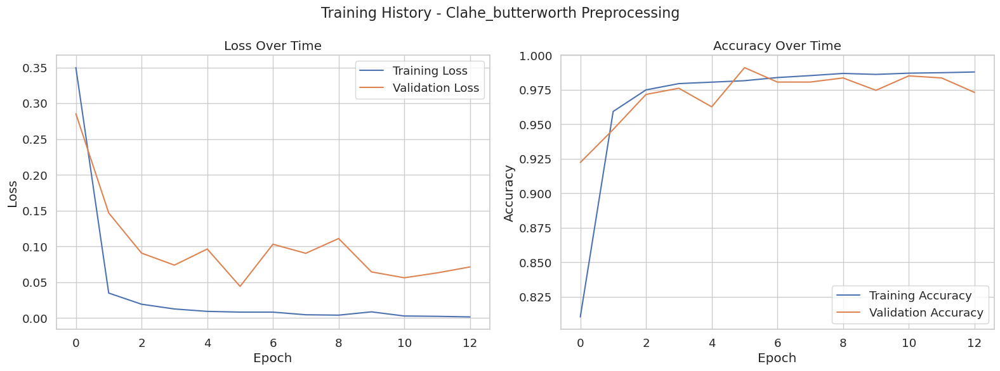

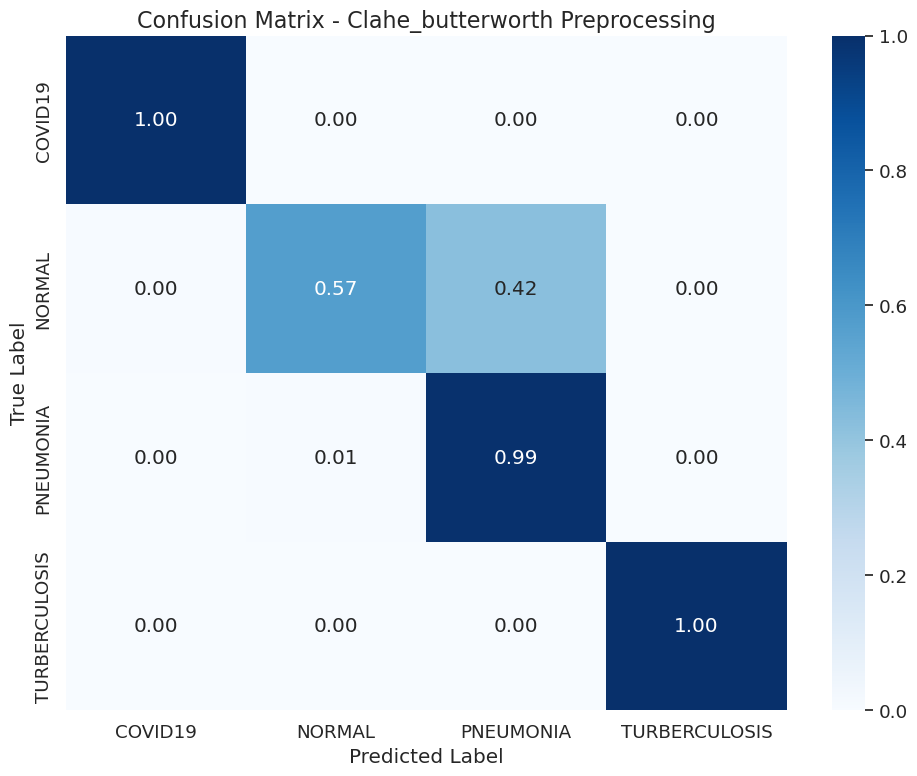

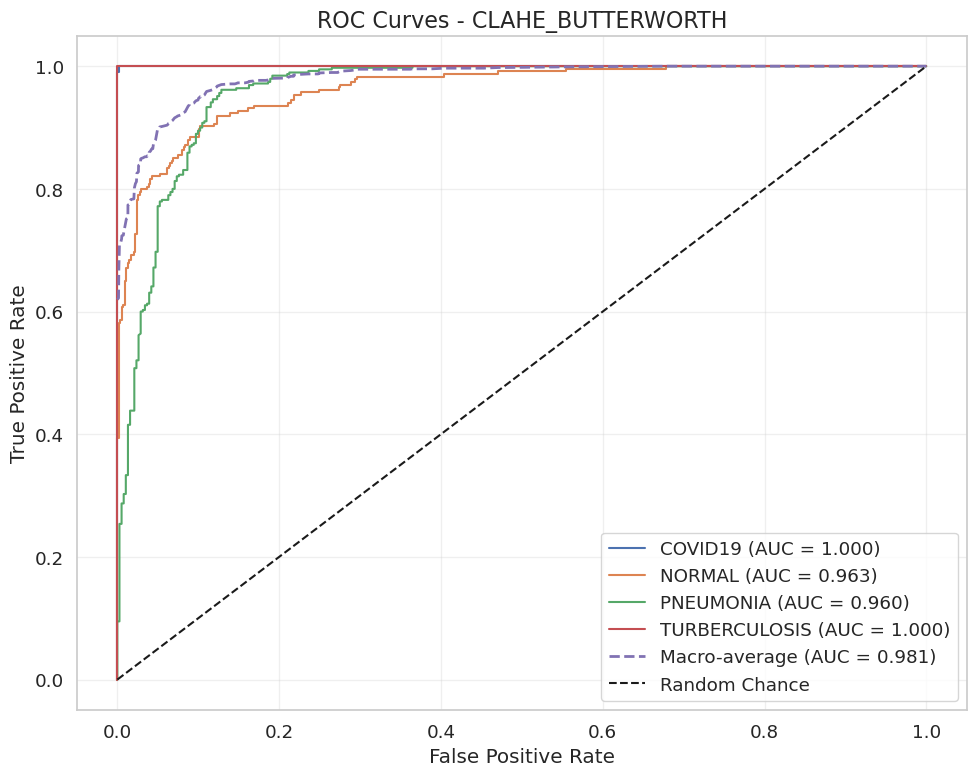

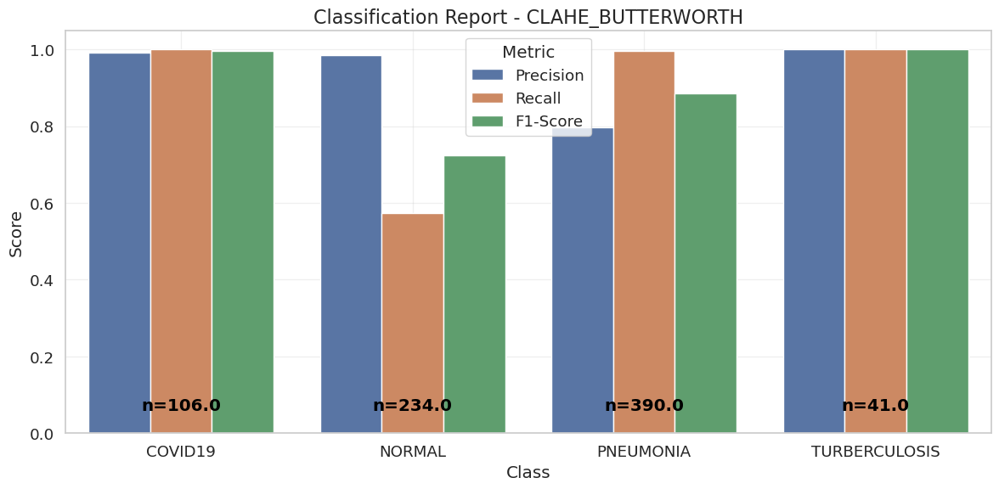

In [ ]:
print("\n=== Preprocessing Methods Experiment - CLAHE + Butterworth ===\n")
preprocessing_method = 'clahe_butterworth'
# Load datasets with current preprocessing method
data = load_datasets(preprocessing_method=preprocessing_method)
# Initialize model 
model = initialize_model('efficientnet_b0', num_classes=num_classes, feature_extract=False, use_pretrained=True)
for stage in model.features[-3:]:  
    for param in stage.parameters():
        param.requires_grad = True
model = model.to(device)
# Setup loss function with class weights
criterion = nn.CrossEntropyLoss(weight=data['class_weights'])
# Setup optimizer (Adam for faster convergence)
optimizer = optim.Adam(model.parameters(), lr=0.0003, weight_decay=1e-4)
# Setup learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3,
)
# Train model with early stopping
model, history = train_model(
    model, data, criterion, optimizer, scheduler, num_epochs=25, early_stopping_patience=7,
    is_weighted=True
)
# Evaluate model
eval_results = evaluate_model(model, data['test_loader'], criterion)
# Plot results
plot_training_history(history, title=f'Training History - {preprocessing_method.capitalize()} Preprocessing')
plot_confusion_matrix(
    eval_results['confusion_matrix'], data['class_names'], title=f'Confusion Matrix - {preprocessing_method.capitalize()} Preprocessing'
)
plot_roc_curves(eval_results, title=f'ROC Curves - {preprocessing_method.upper()}')
plot_classification_report(eval_results['classification_report'], title=f'Classification Report - {preprocessing_method.upper()}')
results_clahe_butterworth = {'clahe_butterworth': {'history': history, 'evaluation': eval_results, 'model': model}}

# ### Cell 11.6: Preprocessing Method: Adaptive Masking + HistEq + Gaussian


=== Preprocessing Methods Experiment - Adaptive Masking+HistEq+Gaussian ===

Loading datasets with adaptive_masking_histeq_gaussian preprocessing...

Class distribution:
COVID19: Train=414, Val=56, Test=106
NORMAL: Train=1207, Val=142, Test=234
PNEUMONIA: Train=3488, Val=395, Test=390
TURBERCULOSIS: Train=585, Val=76, Test=41


/tmp/ipykernel_19572/1996001161.py:38: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)


Converted efficientnet_b0 to channels-last format for improved GPU performance
Applied torch.compile() to efficientnet_b0 for accelerated execution
Model efficientnet_b0 initialized with 4,012,672 total parameters
Trainable parameters: 4,012,672 (100.00% of total)

Training for up to 25 epochs with early stopping patience 7...
Epoch 1/25
----------


train: 100%|██████████| 22/22 [00:30<00:00,  1.37s/it]


train Loss: 0.3769 Acc: 0.7924


val: 100%|██████████| 3/3 [00:06<00:00,  2.05s/it]


val Loss: 0.2157 Acc: 0.9297

Epoch 2/25
----------


train: 100%|██████████| 22/22 [00:31<00:00,  1.45s/it]


train Loss: 0.0469 Acc: 0.9552


val: 100%|██████████| 3/3 [00:06<00:00,  2.00s/it]


val Loss: 0.1110 Acc: 0.9626

Epoch 3/25
----------


train: 100%|██████████| 22/22 [00:28<00:00,  1.32s/it]


train Loss: 0.0301 Acc: 0.9684


val: 100%|██████████| 3/3 [00:06<00:00,  2.01s/it]


val Loss: 0.0762 Acc: 0.9776

Epoch 4/25
----------


train: 100%|██████████| 22/22 [00:30<00:00,  1.38s/it]


train Loss: 0.0178 Acc: 0.9714


val: 100%|██████████| 3/3 [00:07<00:00,  2.41s/it]


val Loss: 0.0753 Acc: 0.9746

Epoch 5/25
----------


train: 100%|██████████| 22/22 [00:43<00:00,  1.98s/it]


train Loss: 0.0091 Acc: 0.9810


val: 100%|██████████| 3/3 [00:07<00:00,  2.34s/it]


val Loss: 0.0771 Acc: 0.9701

Epoch 6/25
----------


train: 100%|██████████| 22/22 [01:00<00:00,  2.73s/it]


train Loss: 0.0076 Acc: 0.9807


val: 100%|██████████| 3/3 [00:09<00:00,  3.00s/it]


val Loss: 0.1051 Acc: 0.9641

Epoch 7/25
----------


train: 100%|██████████| 22/22 [00:44<00:00,  2.04s/it]


train Loss: 0.0048 Acc: 0.9835


val: 100%|██████████| 3/3 [00:07<00:00,  2.50s/it]


val Loss: 0.0825 Acc: 0.9686

Epoch 8/25
----------


train: 100%|██████████| 22/22 [00:32<00:00,  1.46s/it]


train Loss: 0.0045 Acc: 0.9845


val: 100%|██████████| 3/3 [00:06<00:00,  2.30s/it]


val Loss: 0.0666 Acc: 0.9761

Epoch 9/25
----------


train: 100%|██████████| 22/22 [00:31<00:00,  1.43s/it]


train Loss: 0.0047 Acc: 0.9851


val: 100%|██████████| 3/3 [00:05<00:00,  1.99s/it]


val Loss: 0.0341 Acc: 0.9895

Epoch 10/25
----------


train: 100%|██████████| 22/22 [00:30<00:00,  1.36s/it]


train Loss: 0.0047 Acc: 0.9838


val: 100%|██████████| 3/3 [00:05<00:00,  1.94s/it]


val Loss: 0.0494 Acc: 0.9836

Epoch 11/25
----------


train: 100%|██████████| 22/22 [00:30<00:00,  1.37s/it]


train Loss: 0.0035 Acc: 0.9852


val: 100%|██████████| 3/3 [00:05<00:00,  1.97s/it]


val Loss: 0.0483 Acc: 0.9851

Epoch 12/25
----------


train: 100%|██████████| 22/22 [00:29<00:00,  1.35s/it]


train Loss: 0.0042 Acc: 0.9863


val: 100%|██████████| 3/3 [00:05<00:00,  1.97s/it]


val Loss: 0.0563 Acc: 0.9851

Epoch 13/25
----------


train: 100%|██████████| 22/22 [00:35<00:00,  1.63s/it]


train Loss: 0.0042 Acc: 0.9874


val: 100%|██████████| 3/3 [00:05<00:00,  1.98s/it]


val Loss: 0.0768 Acc: 0.9776
Learning rate adjusted from 0.000300 to 0.000150

Epoch 14/25
----------


train: 100%|██████████| 22/22 [00:30<00:00,  1.41s/it]


train Loss: 0.0053 Acc: 0.9861


val: 100%|██████████| 3/3 [00:06<00:00,  2.01s/it]


val Loss: 0.0912 Acc: 0.9791

Epoch 15/25
----------


train: 100%|██████████| 22/22 [00:29<00:00,  1.33s/it]


train Loss: 0.0033 Acc: 0.9874


val: 100%|██████████| 3/3 [00:05<00:00,  1.95s/it]


val Loss: 0.0783 Acc: 0.9821

Epoch 16/25
----------


train: 100%|██████████| 22/22 [00:30<00:00,  1.38s/it]


train Loss: 0.0029 Acc: 0.9875


val: 100%|██████████| 3/3 [00:05<00:00,  1.98s/it]


val Loss: 0.0802 Acc: 0.9865

Early stopping triggered after 16 epochs
Training complete in 10m 53s
Best val Acc: 0.9895 at epoch 9


Evaluating: 100%|██████████| 4/4 [00:07<00:00,  1.78s/it]


Test Loss: 0.7233, Test Acc: 0.8405
Macro ROC AUC: 0.9772


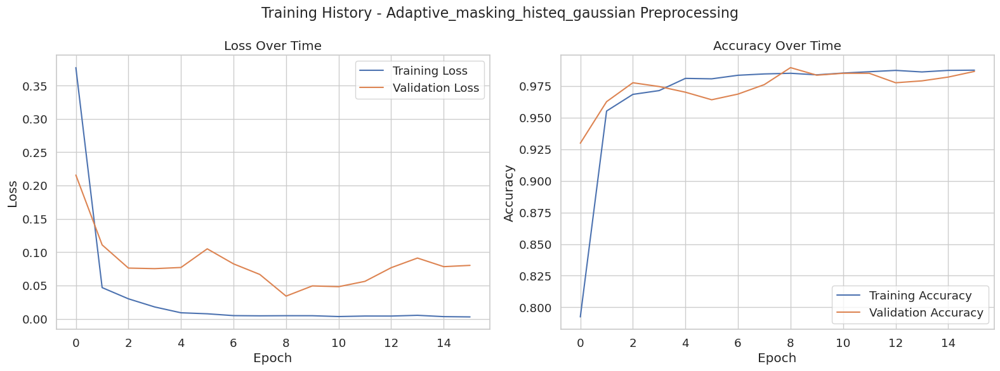

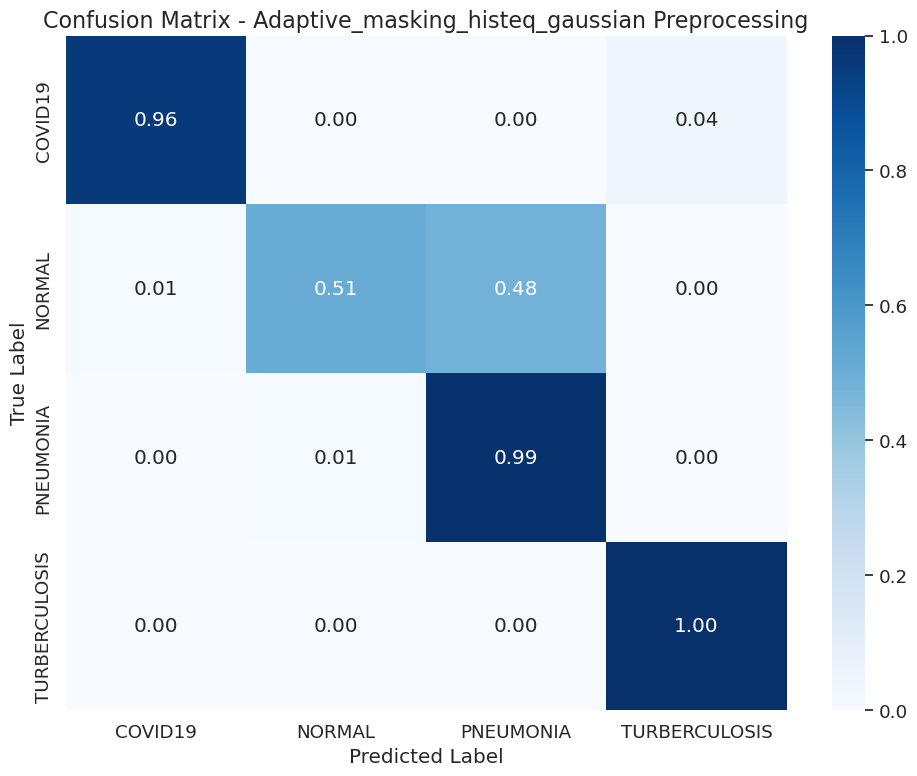

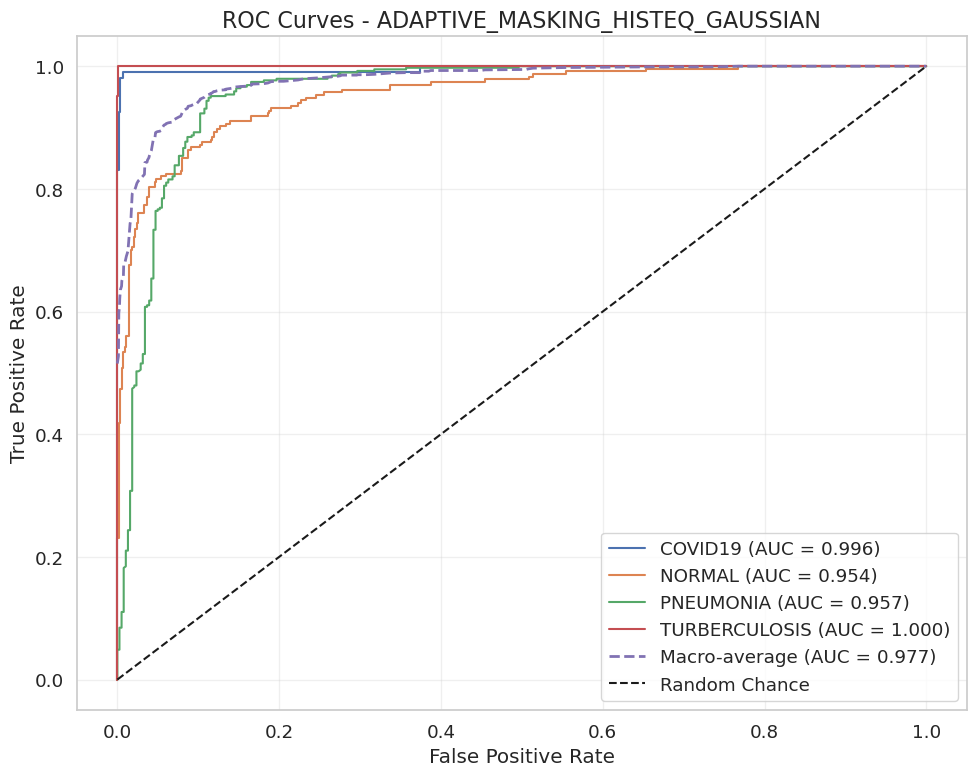

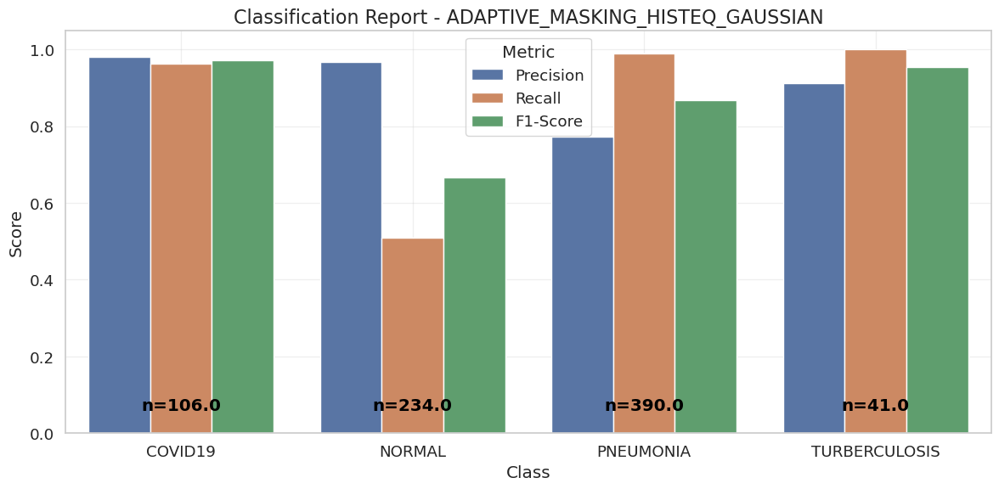

In [ ]:
print("\n=== Preprocessing Methods Experiment - Adaptive Masking+HistEq+Gaussian ===\n")
preprocessing_method = 'adaptive_masking_histeq_gaussian'
# Load datasets with current preprocessing method
data = load_datasets(preprocessing_method=preprocessing_method)
# Initialize model 
model = initialize_model('efficientnet_b0', num_classes=num_classes, feature_extract=False, use_pretrained=True)
for stage in model.features[-3:]:  
    for param in stage.parameters():
        param.requires_grad = True
model = model.to(device)
# Setup loss function with class weights
criterion = nn.CrossEntropyLoss(weight=data['class_weights'])
# Setup optimizer (Adam for faster convergence)
optimizer = optim.Adam(model.parameters(), lr=0.0003, weight_decay=1e-4)
# Setup learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3,
)
# Train model with early stopping
model, history = train_model(
    model, data, criterion, optimizer, scheduler, num_epochs=25, early_stopping_patience=7,
    is_weighted=True
)
# Evaluate model
eval_results = evaluate_model(model, data['test_loader'], criterion)
# Plot results
plot_training_history(history, title=f'Training History - {preprocessing_method.capitalize()} Preprocessing')
plot_confusion_matrix(
    eval_results['confusion_matrix'], data['class_names'], title=f'Confusion Matrix - {preprocessing_method.capitalize()} Preprocessing'
)
plot_roc_curves(eval_results, title=f'ROC Curves - {preprocessing_method.upper()}')
plot_classification_report(eval_results['classification_report'], title=f'Classification Report - {preprocessing_method.upper()}')
results_adaptive_masking = {'adaptive_masking': {'history': history, 'evaluation': eval_results, 'model': model}}

# ### Cell 11.7: Preprocessing Method: HistEq + Gaussian


=== Preprocessing Methods Experiment - HistEq + Gaussian ===

Loading datasets with histeq_gaussian preprocessing...

Class distribution:
COVID19: Train=414, Val=56, Test=106
NORMAL: Train=1207, Val=142, Test=234
PNEUMONIA: Train=3488, Val=395, Test=390
TURBERCULOSIS: Train=585, Val=76, Test=41


/tmp/ipykernel_19572/1996001161.py:38: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)


Converted efficientnet_b0 to channels-last format for improved GPU performance
Applied torch.compile() to efficientnet_b0 for accelerated execution
Model efficientnet_b0 initialized with 4,012,672 total parameters
Trainable parameters: 4,012,672 (100.00% of total)

Training for up to 25 epochs with early stopping patience 7...
Epoch 1/25
----------


train: 100%|██████████| 22/22 [00:29<00:00,  1.35s/it]


train Loss: 0.3791 Acc: 0.8117


val: 100%|██████████| 3/3 [00:05<00:00,  1.94s/it]


val Loss: 0.3837 Acc: 0.9312

Epoch 2/25
----------


train: 100%|██████████| 22/22 [00:34<00:00,  1.57s/it]


train Loss: 0.0446 Acc: 0.9610


val: 100%|██████████| 3/3 [00:05<00:00,  1.94s/it]


val Loss: 0.0851 Acc: 0.9716

Epoch 3/25
----------


train: 100%|██████████| 22/22 [00:31<00:00,  1.43s/it]


train Loss: 0.0180 Acc: 0.9747


val: 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]


val Loss: 0.1014 Acc: 0.9641

Epoch 4/25
----------


train: 100%|██████████| 22/22 [00:29<00:00,  1.34s/it]


train Loss: 0.0200 Acc: 0.9745


val: 100%|██████████| 3/3 [00:05<00:00,  1.95s/it]


val Loss: 0.5936 Acc: 0.9731

Epoch 5/25
----------


train: 100%|██████████| 22/22 [00:39<00:00,  1.78s/it]


train Loss: 0.0116 Acc: 0.9775


val: 100%|██████████| 3/3 [00:05<00:00,  1.94s/it]


val Loss: 0.0818 Acc: 0.9791

Epoch 6/25
----------


train: 100%|██████████| 22/22 [00:27<00:00,  1.27s/it]


train Loss: 0.0127 Acc: 0.9824


val: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


val Loss: 0.1371 Acc: 0.9716

Epoch 7/25
----------


train: 100%|██████████| 22/22 [00:48<00:00,  2.21s/it]


train Loss: 0.0075 Acc: 0.9845


val: 100%|██████████| 3/3 [00:09<00:00,  3.33s/it]


val Loss: 0.0725 Acc: 0.9716

Epoch 8/25
----------


train: 100%|██████████| 22/22 [00:29<00:00,  1.33s/it]


train Loss: 0.0079 Acc: 0.9824


val: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


val Loss: 0.0992 Acc: 0.9806

Epoch 9/25
----------


train: 100%|██████████| 22/22 [00:28<00:00,  1.27s/it]


train Loss: 0.0068 Acc: 0.9858


val: 100%|██████████| 3/3 [00:05<00:00,  1.93s/it]


val Loss: 0.0475 Acc: 0.9791

Epoch 10/25
----------


train: 100%|██████████| 22/22 [00:28<00:00,  1.28s/it]


train Loss: 0.0039 Acc: 0.9852


val: 100%|██████████| 3/3 [00:05<00:00,  1.92s/it]


val Loss: 0.0465 Acc: 0.9836

Epoch 11/25
----------


train: 100%|██████████| 22/22 [00:30<00:00,  1.38s/it]


train Loss: 0.0045 Acc: 0.9847


val: 100%|██████████| 3/3 [00:05<00:00,  1.94s/it]


val Loss: 0.0382 Acc: 0.9895

Epoch 12/25
----------


train: 100%|██████████| 22/22 [00:28<00:00,  1.30s/it]


train Loss: 0.0020 Acc: 0.9875


val: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


val Loss: 0.0699 Acc: 0.9731

Epoch 13/25
----------


train: 100%|██████████| 22/22 [00:28<00:00,  1.30s/it]


train Loss: 0.0018 Acc: 0.9874


val: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


val Loss: 0.0687 Acc: 0.9865

Epoch 14/25
----------


train: 100%|██████████| 22/22 [00:33<00:00,  1.50s/it]


train Loss: 0.0029 Acc: 0.9870


val: 100%|██████████| 3/3 [00:05<00:00,  1.94s/it]


val Loss: 0.1062 Acc: 0.9641

Epoch 15/25
----------


train: 100%|██████████| 22/22 [00:28<00:00,  1.30s/it]


train Loss: 0.0031 Acc: 0.9858


val: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


val Loss: 0.3130 Acc: 0.9836
Learning rate adjusted from 0.000300 to 0.000150

Epoch 16/25
----------


train: 100%|██████████| 22/22 [00:28<00:00,  1.28s/it]


train Loss: 0.0030 Acc: 0.9870


val: 100%|██████████| 3/3 [00:05<00:00,  1.94s/it]


val Loss: 0.0298 Acc: 0.9910

Epoch 17/25
----------


train: 100%|██████████| 22/22 [00:29<00:00,  1.33s/it]


train Loss: 0.0026 Acc: 0.9868


val: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


val Loss: 0.0373 Acc: 0.9851

Epoch 18/25
----------


train: 100%|██████████| 22/22 [00:29<00:00,  1.33s/it]


train Loss: 0.0018 Acc: 0.9877


val: 100%|██████████| 3/3 [00:05<00:00,  1.93s/it]


val Loss: 0.0514 Acc: 0.9851

Epoch 19/25
----------


train: 100%|██████████| 22/22 [00:28<00:00,  1.29s/it]


train Loss: 0.0013 Acc: 0.9884


val: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


val Loss: 0.0593 Acc: 0.9851

Epoch 20/25
----------


train: 100%|██████████| 22/22 [00:28<00:00,  1.30s/it]


train Loss: 0.0009 Acc: 0.9882


val: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


val Loss: 0.0625 Acc: 0.9880
Learning rate adjusted from 0.000150 to 0.000075

Epoch 21/25
----------


train: 100%|██████████| 22/22 [00:29<00:00,  1.32s/it]


train Loss: 0.0009 Acc: 0.9882


val: 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]


val Loss: 0.0537 Acc: 0.9895

Epoch 22/25
----------


train: 100%|██████████| 22/22 [00:29<00:00,  1.33s/it]


train Loss: 0.0019 Acc: 0.9881


val: 100%|██████████| 3/3 [00:06<00:00,  2.02s/it]


val Loss: 0.0452 Acc: 0.9910

Epoch 23/25
----------


train: 100%|██████████| 22/22 [00:37<00:00,  1.69s/it]


train Loss: 0.0024 Acc: 0.9882


val: 100%|██████████| 3/3 [00:09<00:00,  3.09s/it]


val Loss: 0.0679 Acc: 0.9895

Early stopping triggered after 23 epochs
Training complete in 14m 15s
Best val Acc: 0.9910 at epoch 16


Evaluating: 100%|██████████| 4/4 [00:09<00:00,  2.27s/it]


Test Loss: 1.0547, Test Acc: 0.8223
Macro ROC AUC: 0.9747


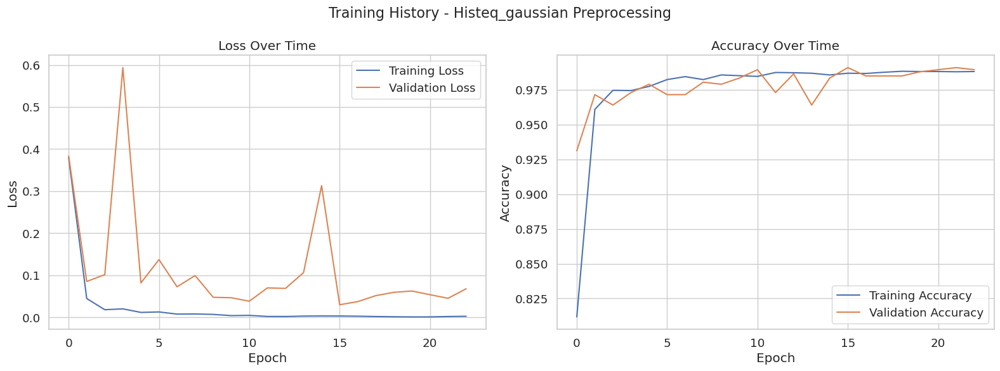

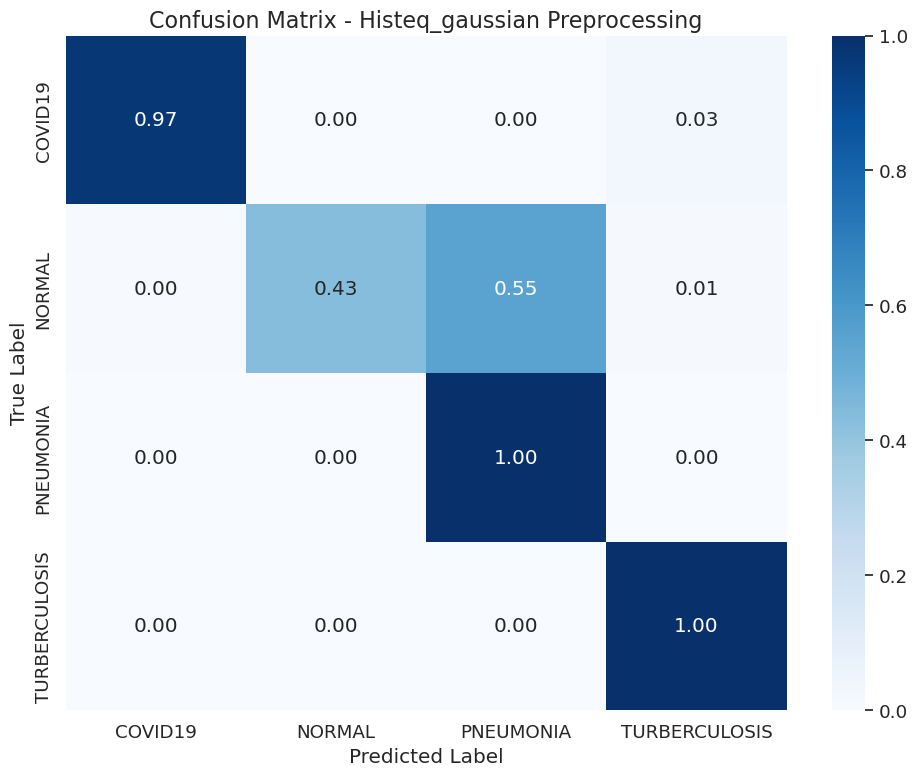

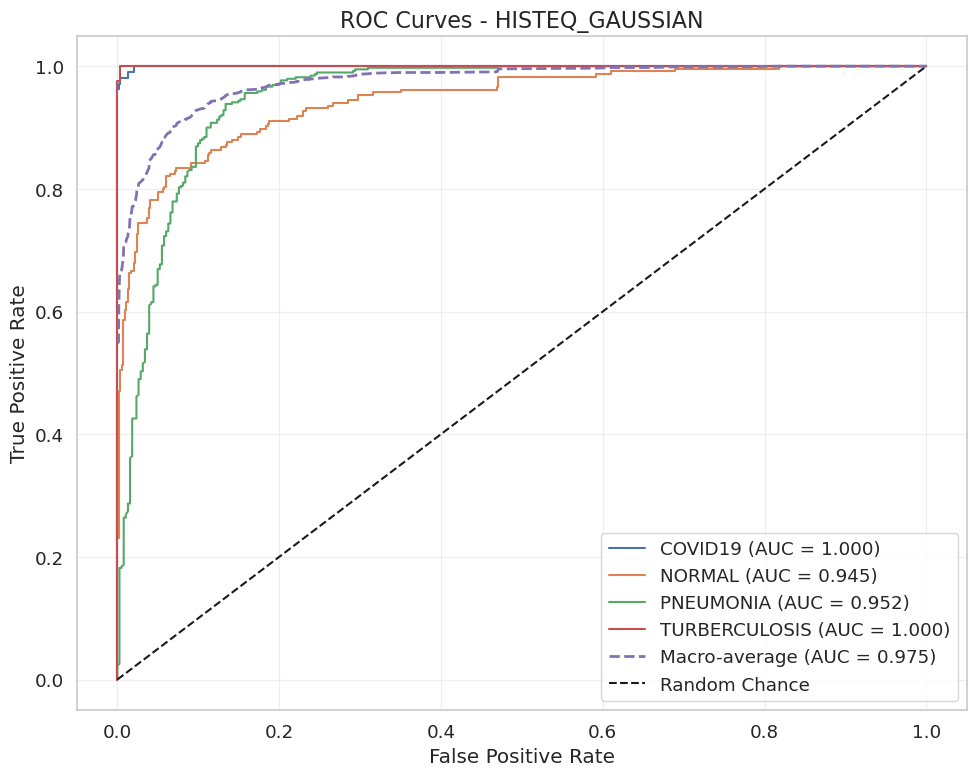

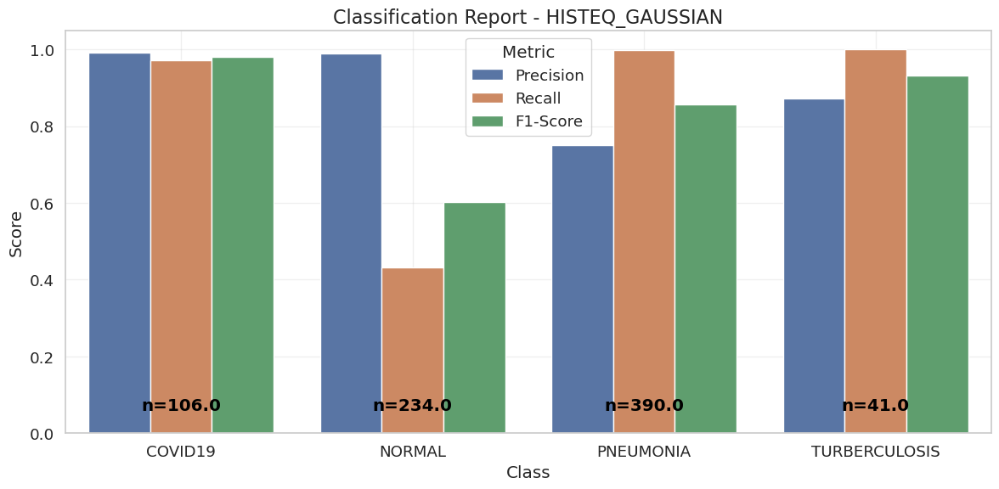

In [ ]:
print("\n=== Preprocessing Methods Experiment - HistEq + Gaussian ===\n")
preprocessing_method = 'histeq_gaussian'
# Load datasets with current preprocessing method
data = load_datasets(preprocessing_method=preprocessing_method)
# Initialize model 
model = initialize_model('efficientnet_b0', num_classes=num_classes, feature_extract=False, use_pretrained=True)
for stage in model.features[-3:]:  
    for param in stage.parameters():
        param.requires_grad = True
model = model.to(device)
# Setup loss function with class weights
criterion = nn.CrossEntropyLoss(weight=data['class_weights'])
# Setup optimizer (Adam for faster convergence)
optimizer = optim.Adam(model.parameters(), lr=0.0003, weight_decay=1e-4)
# Setup learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3,
)
# Train model with early stopping
model, history = train_model(
    model, data, criterion, optimizer, scheduler, num_epochs=25, early_stopping_patience=7,
    is_weighted=True
)
# Evaluate model
eval_results = evaluate_model(model, data['test_loader'], criterion)
# Plot results
plot_training_history(history, title=f'Training History - {preprocessing_method.capitalize()} Preprocessing')
plot_confusion_matrix(
    eval_results['confusion_matrix'], data['class_names'], title=f'Confusion Matrix - {preprocessing_method.capitalize()} Preprocessing'
)
plot_roc_curves(eval_results, title=f'ROC Curves - {preprocessing_method.upper()}')
plot_classification_report(eval_results['classification_report'], title=f'Classification Report - {preprocessing_method.upper()}')
results_histeq_gaussian = {'histeq_gaussian': {'history': history, 'evaluation': eval_results, 'model': model}}

# ### Cell 11.8: Preprocessing Method: Argument + HistEq + Gaussian


=== Preprocessing Methods Experiment - Argument + HistEq + Gaussian ===

Loading datasets with combined preprocessing...

Class distribution:
COVID19: Train=414, Val=56, Test=106
NORMAL: Train=1207, Val=142, Test=234
PNEUMONIA: Train=3488, Val=395, Test=390
TURBERCULOSIS: Train=585, Val=76, Test=41


/tmp/ipykernel_19572/1996001161.py:38: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)


Converted efficientnet_b0 to channels-last format for improved GPU performance
Applied torch.compile() to efficientnet_b0 for accelerated execution
Model efficientnet_b0 initialized with 4,012,672 total parameters
Trainable parameters: 4,012,672 (100.00% of total)

Training for up to 25 epochs with early stopping patience 7...
Epoch 1/25
----------


train: 100%|██████████| 22/22 [00:32<00:00,  1.46s/it]


train Loss: 0.4882 Acc: 0.7652


val: 100%|██████████| 3/3 [00:05<00:00,  1.96s/it]


val Loss: 0.5424 Acc: 0.8326

Epoch 2/25
----------


train: 100%|██████████| 22/22 [00:33<00:00,  1.51s/it]


train Loss: 0.0809 Acc: 0.9468


val: 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]


val Loss: 0.4413 Acc: 0.8700

Epoch 3/25
----------


train: 100%|██████████| 22/22 [00:31<00:00,  1.41s/it]


train Loss: 0.0503 Acc: 0.9587


val: 100%|██████████| 3/3 [00:05<00:00,  1.92s/it]


val Loss: 0.3854 Acc: 0.8744

Epoch 4/25
----------


train: 100%|██████████| 22/22 [00:30<00:00,  1.37s/it]


train Loss: 0.0266 Acc: 0.9712


val: 100%|██████████| 3/3 [00:06<00:00,  2.08s/it]


val Loss: 0.2581 Acc: 0.9208

Epoch 5/25
----------


train: 100%|██████████| 22/22 [00:30<00:00,  1.40s/it]


train Loss: 0.0184 Acc: 0.9754


val: 100%|██████████| 3/3 [00:05<00:00,  1.92s/it]


val Loss: 0.1721 Acc: 0.9342

Epoch 6/25
----------


train: 100%|██████████| 22/22 [00:30<00:00,  1.41s/it]


train Loss: 0.0198 Acc: 0.9756


val: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


val Loss: 0.0997 Acc: 0.9686

Epoch 7/25
----------


train: 100%|██████████| 22/22 [00:30<00:00,  1.40s/it]


train Loss: 0.0138 Acc: 0.9777


val: 100%|██████████| 3/3 [00:05<00:00,  1.93s/it]


val Loss: 0.0976 Acc: 0.9701

Epoch 8/25
----------


train: 100%|██████████| 22/22 [00:32<00:00,  1.47s/it]


train Loss: 0.0136 Acc: 0.9773


val: 100%|██████████| 3/3 [00:05<00:00,  1.95s/it]


val Loss: 0.1988 Acc: 0.9357

Epoch 9/25
----------


train: 100%|██████████| 22/22 [00:31<00:00,  1.44s/it]


train Loss: 0.0131 Acc: 0.9796


val: 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]


val Loss: 0.1785 Acc: 0.9462

Epoch 10/25
----------


train: 100%|██████████| 22/22 [00:29<00:00,  1.35s/it]


train Loss: 0.0135 Acc: 0.9796


val: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


val Loss: 0.1942 Acc: 0.9387

Epoch 11/25
----------


train: 100%|██████████| 22/22 [00:31<00:00,  1.44s/it]


train Loss: 0.0115 Acc: 0.9810


val: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


val Loss: 0.3099 Acc: 0.9238
Learning rate adjusted from 0.000300 to 0.000150

Epoch 12/25
----------


train: 100%|██████████| 22/22 [00:30<00:00,  1.37s/it]


train Loss: 0.0082 Acc: 0.9803


val: 100%|██████████| 3/3 [00:05<00:00,  1.94s/it]


val Loss: 0.1879 Acc: 0.9567

Epoch 13/25
----------


train: 100%|██████████| 22/22 [00:29<00:00,  1.35s/it]


train Loss: 0.0081 Acc: 0.9798


val: 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]


val Loss: 0.1714 Acc: 0.9522

Epoch 14/25
----------


train: 100%|██████████| 22/22 [00:31<00:00,  1.43s/it]


train Loss: 0.0079 Acc: 0.9821


val: 100%|██████████| 3/3 [00:05<00:00,  1.94s/it]


val Loss: 0.1696 Acc: 0.9522

Early stopping triggered after 14 epochs
Training complete in 8m 37s
Best val Acc: 0.9701 at epoch 7


Evaluating: 100%|██████████| 4/4 [00:06<00:00,  1.73s/it]


Test Loss: 0.1728, Test Acc: 0.9364
Macro ROC AUC: 0.9921


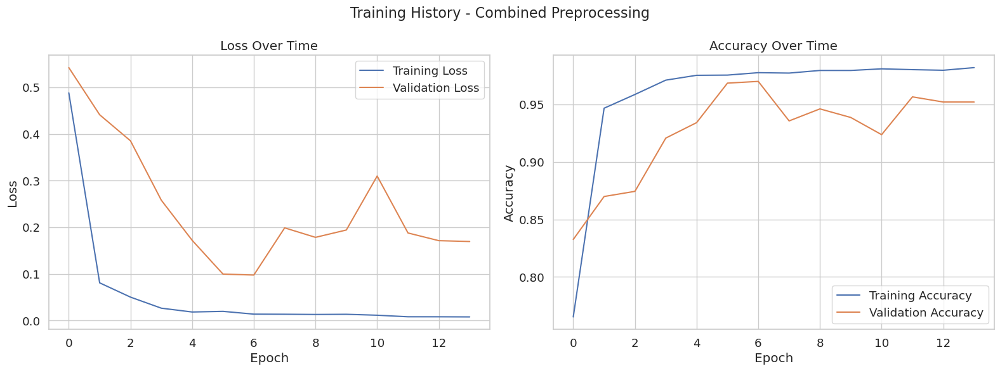

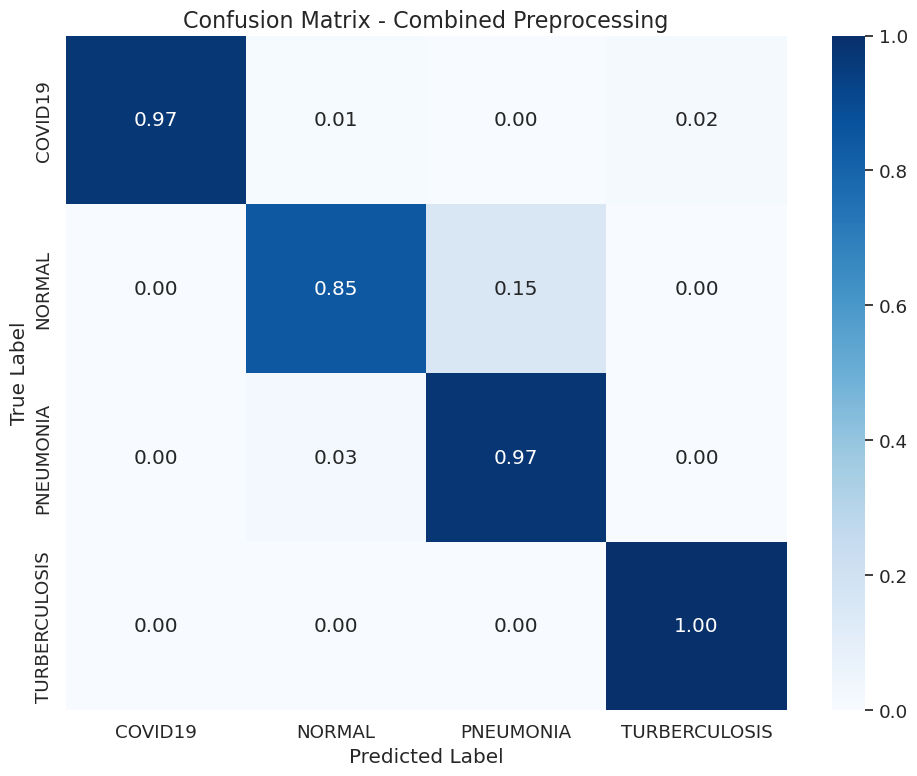

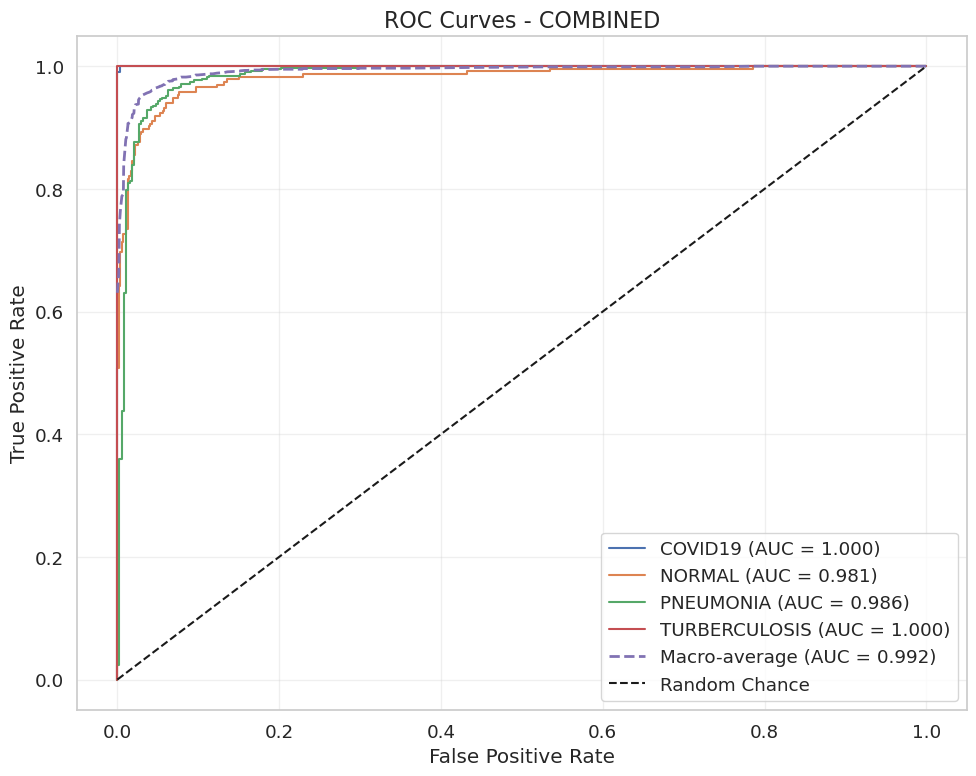

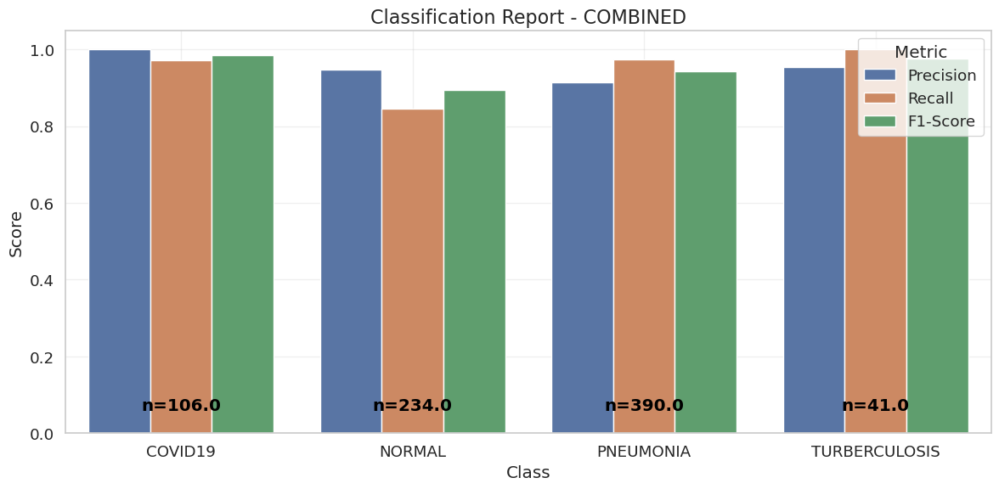

In [ ]:
print("\n=== Preprocessing Methods Experiment - Argument + HistEq + Gaussian ===\n")
preprocessing_method = 'combined'
# Load datasets with current preprocessing method
data = load_datasets(preprocessing_method=preprocessing_method)
# Initialize model 
model = initialize_model('efficientnet_b0', num_classes=num_classes, feature_extract=False, use_pretrained=True)
for stage in model.features[-3:]:  
    for param in stage.parameters():
        param.requires_grad = True
model = model.to(device)
# Setup loss function with class weights
criterion = nn.CrossEntropyLoss(weight=data['class_weights'])
# Setup optimizer (Adam for faster convergence)
optimizer = optim.Adam(model.parameters(), lr=0.0003, weight_decay=1e-4)
# Setup learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3,
)
# Train model with early stopping
model, history = train_model(
    model, data, criterion, optimizer, scheduler, num_epochs=25, early_stopping_patience=7,
    is_weighted=True
)
# Evaluate model
eval_results = evaluate_model(model, data['test_loader'], criterion)
# Plot results
plot_training_history(history, title=f'Training History - {preprocessing_method.capitalize()} Preprocessing')
plot_confusion_matrix(
    eval_results['confusion_matrix'], data['class_names'], title=f'Confusion Matrix - {preprocessing_method.capitalize()} Preprocessing'
)
plot_roc_curves(eval_results, title=f'ROC Curves - {preprocessing_method.upper()}')
plot_classification_report(eval_results['classification_report'], title=f'Classification Report - {preprocessing_method.upper()}')
results_combined = {'combined': {'history': history, 'evaluation': eval_results, 'model': model}}

# ### Cell 11.9: Preprocessing Method: Argument + Clahe


=== Preprocessing Methods Experiment - Argument + Clahe ===

Loading datasets with clahe_augmented preprocessing...

Class distribution:
COVID19: Train=414, Val=56, Test=106
NORMAL: Train=1207, Val=142, Test=234
PNEUMONIA: Train=3488, Val=395, Test=390
TURBERCULOSIS: Train=585, Val=76, Test=41


/tmp/ipykernel_19572/1996001161.py:38: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)


Converted efficientnet_b0 to channels-last format for improved GPU performance
Applied torch.compile() to efficientnet_b0 for accelerated execution
Model efficientnet_b0 initialized with 4,012,672 total parameters
Trainable parameters: 4,012,672 (100.00% of total)

Training for up to 25 epochs with early stopping patience 7...
Epoch 1/25
----------


train: 100%|██████████| 22/22 [01:55<00:00,  5.25s/it]


train Loss: 0.4178 Acc: 0.7843


val: 100%|██████████| 3/3 [00:11<00:00,  3.82s/it]


val Loss: 0.7434 Acc: 0.7040

Epoch 2/25
----------


train: 100%|██████████| 22/22 [01:56<00:00,  5.27s/it]


train Loss: 0.0560 Acc: 0.9536


val: 100%|██████████| 3/3 [00:10<00:00,  3.54s/it]


val Loss: 0.5731 Acc: 0.8146

Epoch 3/25
----------


train: 100%|██████████| 22/22 [01:57<00:00,  5.36s/it]


train Loss: 0.0302 Acc: 0.9615


val: 100%|██████████| 3/3 [00:10<00:00,  3.34s/it]


val Loss: 0.2284 Acc: 0.9118

Epoch 4/25
----------


train: 100%|██████████| 22/22 [01:56<00:00,  5.31s/it]


train Loss: 0.0210 Acc: 0.9682


val: 100%|██████████| 3/3 [00:11<00:00,  3.67s/it]


val Loss: 0.2321 Acc: 0.9118

Epoch 5/25
----------


train: 100%|██████████| 22/22 [02:03<00:00,  5.61s/it]


train Loss: 0.0144 Acc: 0.9795


val: 100%|██████████| 3/3 [00:12<00:00,  4.17s/it]


val Loss: 0.2570 Acc: 0.9163

Epoch 6/25
----------


train: 100%|██████████| 22/22 [01:58<00:00,  5.39s/it]


train Loss: 0.0134 Acc: 0.9766


val: 100%|██████████| 3/3 [00:11<00:00,  3.93s/it]


val Loss: 0.3064 Acc: 0.8924

Epoch 7/25
----------


train: 100%|██████████| 22/22 [01:56<00:00,  5.31s/it]


train Loss: 0.0158 Acc: 0.9766


val: 100%|██████████| 3/3 [00:10<00:00,  3.66s/it]


val Loss: 0.1888 Acc: 0.9297

Epoch 8/25
----------


train: 100%|██████████| 22/22 [01:54<00:00,  5.19s/it]


train Loss: 0.0153 Acc: 0.9782


val: 100%|██████████| 3/3 [00:10<00:00,  3.58s/it]


val Loss: 0.2985 Acc: 0.9163

Epoch 9/25
----------


train: 100%|██████████| 22/22 [01:55<00:00,  5.23s/it]


train Loss: 0.0095 Acc: 0.9819


val: 100%|██████████| 3/3 [00:11<00:00,  3.98s/it]


val Loss: 0.2481 Acc: 0.9253

Epoch 10/25
----------


train: 100%|██████████| 22/22 [01:55<00:00,  5.24s/it]


train Loss: 0.0071 Acc: 0.9823


val: 100%|██████████| 3/3 [00:11<00:00,  3.67s/it]


val Loss: 0.2646 Acc: 0.9402

Epoch 11/25
----------


train: 100%|██████████| 22/22 [01:54<00:00,  5.18s/it]


train Loss: 0.0086 Acc: 0.9819


val: 100%|██████████| 3/3 [00:10<00:00,  3.63s/it]


val Loss: 0.2665 Acc: 0.9297
Learning rate adjusted from 0.000300 to 0.000150

Epoch 12/25
----------


train: 100%|██████████| 22/22 [01:52<00:00,  5.12s/it]


train Loss: 0.0062 Acc: 0.9824


val: 100%|██████████| 3/3 [00:10<00:00,  3.67s/it]


val Loss: 0.1673 Acc: 0.9417

Epoch 13/25
----------


train: 100%|██████████| 22/22 [01:58<00:00,  5.39s/it]


train Loss: 0.0053 Acc: 0.9849


val: 100%|██████████| 3/3 [00:11<00:00,  3.72s/it]


val Loss: 0.2584 Acc: 0.9223

Epoch 14/25
----------


train: 100%|██████████| 22/22 [01:56<00:00,  5.29s/it]


train Loss: 0.0041 Acc: 0.9847


val: 100%|██████████| 3/3 [00:11<00:00,  3.73s/it]


val Loss: 0.1643 Acc: 0.9507

Epoch 15/25
----------


train: 100%|██████████| 22/22 [01:55<00:00,  5.24s/it]


train Loss: 0.0045 Acc: 0.9844


val: 100%|██████████| 3/3 [00:11<00:00,  3.83s/it]


val Loss: 0.1475 Acc: 0.9477

Epoch 16/25
----------


train: 100%|██████████| 22/22 [02:03<00:00,  5.61s/it]


train Loss: 0.0033 Acc: 0.9854


val: 100%|██████████| 3/3 [00:10<00:00,  3.57s/it]


val Loss: 0.1843 Acc: 0.9402

Epoch 17/25
----------


train: 100%|██████████| 22/22 [01:57<00:00,  5.34s/it]


train Loss: 0.0042 Acc: 0.9849


val: 100%|██████████| 3/3 [00:10<00:00,  3.35s/it]


val Loss: 0.2245 Acc: 0.9342

Epoch 18/25
----------


train: 100%|██████████| 22/22 [01:53<00:00,  5.16s/it]


train Loss: 0.0044 Acc: 0.9835


val: 100%|██████████| 3/3 [00:11<00:00,  3.74s/it]


val Loss: 0.3007 Acc: 0.9148

Epoch 19/25
----------


train: 100%|██████████| 22/22 [01:58<00:00,  5.39s/it]


train Loss: 0.0052 Acc: 0.9828


val: 100%|██████████| 3/3 [00:10<00:00,  3.55s/it]


val Loss: 0.1693 Acc: 0.9567
Learning rate adjusted from 0.000150 to 0.000075

Epoch 20/25
----------


train: 100%|██████████| 22/22 [01:56<00:00,  5.27s/it]


train Loss: 0.0028 Acc: 0.9870


val: 100%|██████████| 3/3 [00:11<00:00,  3.68s/it]


val Loss: 0.2321 Acc: 0.9552

Epoch 21/25
----------


train: 100%|██████████| 22/22 [01:51<00:00,  5.07s/it]


train Loss: 0.0039 Acc: 0.9849


val: 100%|██████████| 3/3 [00:11<00:00,  3.69s/it]


val Loss: 0.1543 Acc: 0.9552

Epoch 22/25
----------


train: 100%|██████████| 22/22 [02:12<00:00,  6.03s/it]


train Loss: 0.0030 Acc: 0.9860


val: 100%|██████████| 3/3 [00:11<00:00,  3.91s/it]


val Loss: 0.1851 Acc: 0.9507

Epoch 23/25
----------


train: 100%|██████████| 22/22 [01:57<00:00,  5.35s/it]


train Loss: 0.0025 Acc: 0.9865


val: 100%|██████████| 3/3 [00:10<00:00,  3.62s/it]


val Loss: 0.1457 Acc: 0.9626

Epoch 24/25
----------


train: 100%|██████████| 22/22 [01:58<00:00,  5.37s/it]


train Loss: 0.0040 Acc: 0.9858


val: 100%|██████████| 3/3 [00:10<00:00,  3.54s/it]


val Loss: 0.1916 Acc: 0.9417

Epoch 25/25
----------


train: 100%|██████████| 22/22 [01:55<00:00,  5.27s/it]


train Loss: 0.0034 Acc: 0.9867


val: 100%|██████████| 3/3 [00:11<00:00,  3.81s/it]


val Loss: 0.1371 Acc: 0.9671

Training complete in 53m 29s
Best val Acc: 0.9671 at epoch 25


Evaluating: 100%|██████████| 4/4 [00:14<00:00,  3.57s/it]


Test Loss: 0.1685, Test Acc: 0.9416
Macro ROC AUC: 0.9925


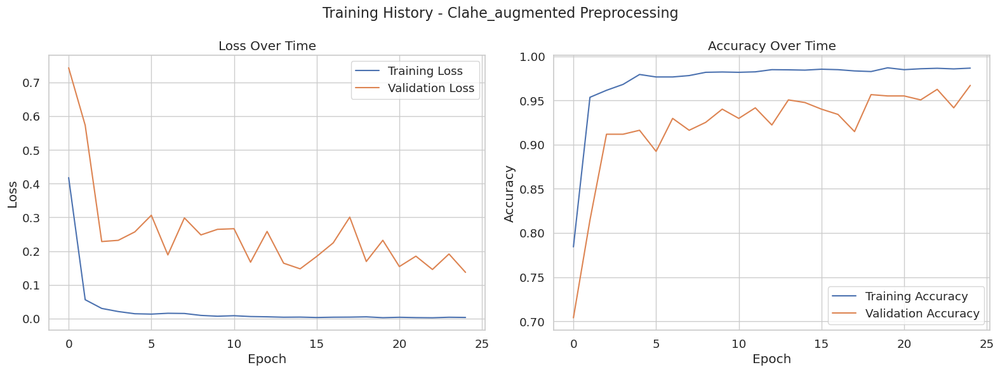

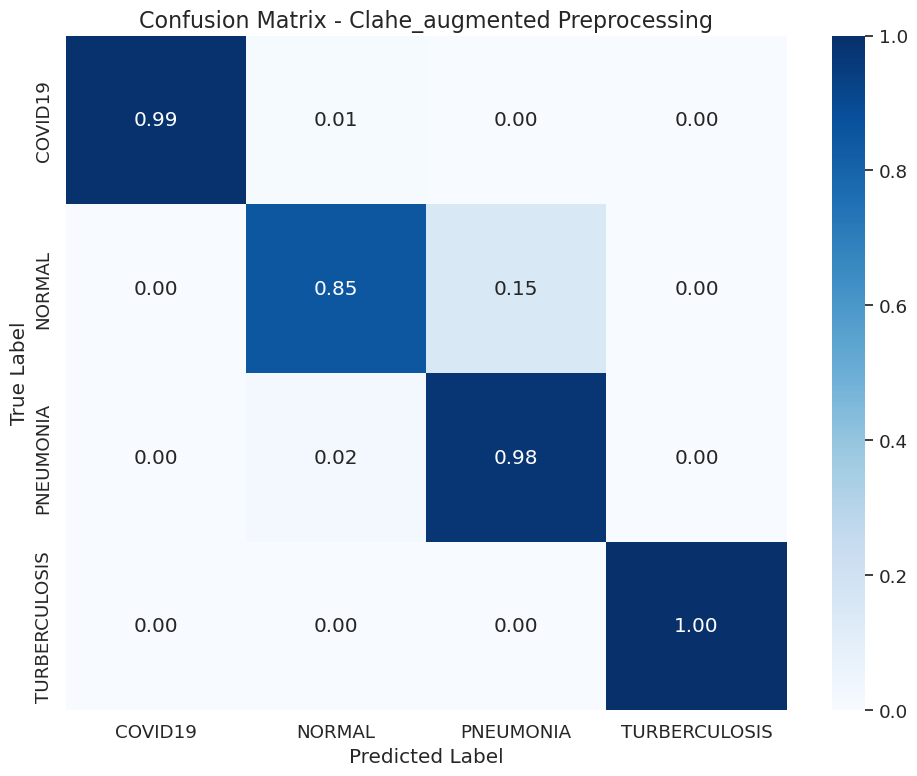

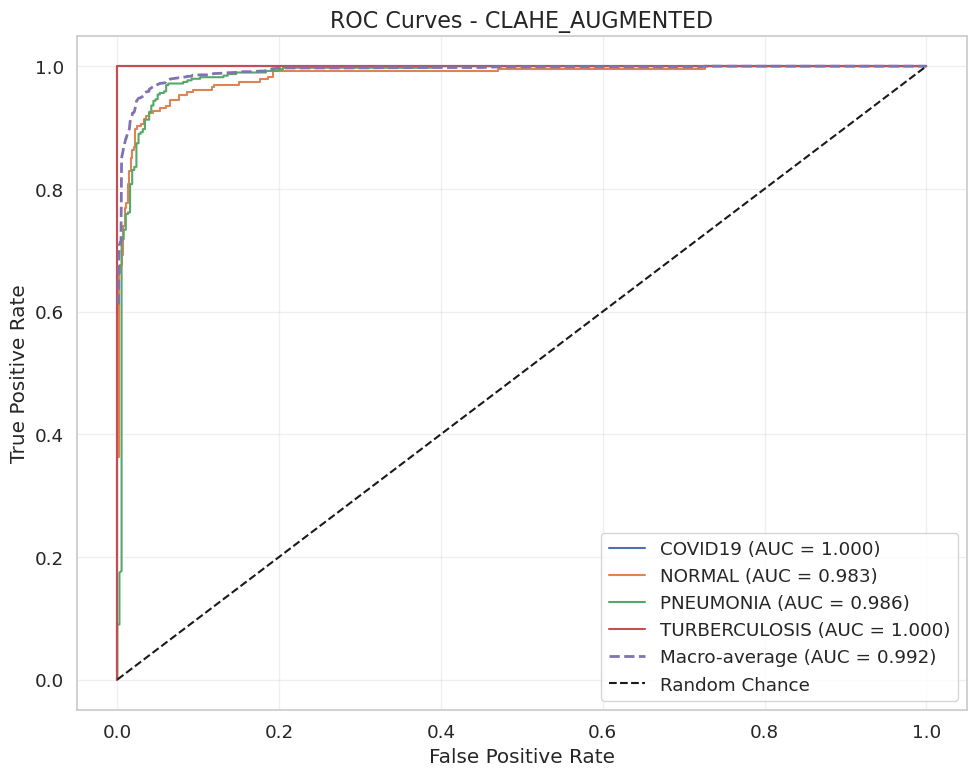

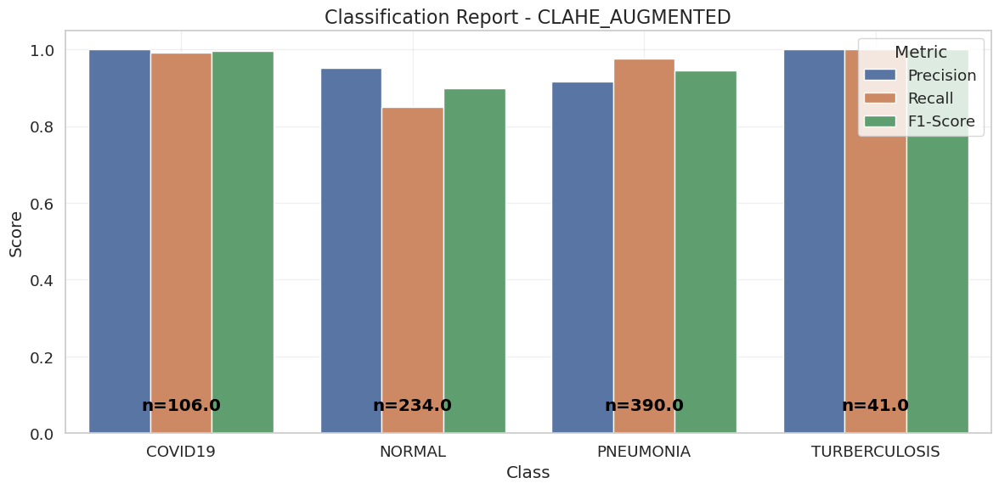

In [ ]:

print("\n=== Preprocessing Methods Experiment - Argument + Clahe ===\n")
preprocessing_method = 'clahe_augmented'
# Load datasets with current preprocessing method
data = load_datasets(preprocessing_method=preprocessing_method)
# Initialize model 
model = initialize_model('efficientnet_b0', num_classes=num_classes, feature_extract=False, use_pretrained=True)
for stage in model.features[-3:]:  
    for param in stage.parameters():
        param.requires_grad = True
model = model.to(device)
# Setup loss function with class weights
criterion = nn.CrossEntropyLoss(weight=data['class_weights'])
# Setup optimizer (Adam for faster convergence)
optimizer = optim.Adam(model.parameters(), lr=0.0003, weight_decay=1e-4)
# Setup learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3,
)
# Train model with early stopping
model, history = train_model(
    model, data, criterion, optimizer, scheduler, num_epochs=25, early_stopping_patience=7,
    is_weighted=True
)
# Evaluate model
eval_results = evaluate_model(model, data['test_loader'], criterion)
# Plot results
plot_training_history(history, title=f'Training History - {preprocessing_method.capitalize()} Preprocessing')
plot_confusion_matrix(
    eval_results['confusion_matrix'], data['class_names'], title=f'Confusion Matrix - {preprocessing_method.capitalize()} Preprocessing'
)
plot_roc_curves(eval_results, title=f'ROC Curves - {preprocessing_method.upper()}')
plot_classification_report(eval_results['classification_report'], title=f'Classification Report - {preprocessing_method.upper()}')
results_clahe_augmented = {'clahe_augmented': {'history': history, 'evaluation': eval_results, 'model': model}}

# ### Cell 11.10: Compare Preprocessing Methods

In [ ]:
def compare_experiment_results(results, experiment_name):
    """
    Compare the results of different experiments

    Args:
        results (dict): Dictionary of results from different runs
        experiment_name (str): Name of the experiment
    """
    print(f"\n=== Comparison of {experiment_name} ===\n")
    comparison_data = []
    for name, result in results.items():
        comparison_data.append({
            'Experiment': name,
            'Validation Accuracy': np.max(result['history']['val_acc']),
            'Test Accuracy': result['evaluation']['test_acc'],
            'Macro AUC': result['evaluation']['roc']['auc']['macro']
        })
    comparison_df = pd.DataFrame(comparison_data)
    print(comparison_df)

    # Plotting Test Accuracy Comparison
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Experiment', y='Test Accuracy', data=comparison_df)
    plt.title(f'Test Accuracy Comparison - {experiment_name}')
    plt.ylabel('Test Accuracy')
    plt.xlabel('Experiment')
    plt.ylim(0, 1)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig(f'test_accuracy_comparison_{experiment_name.replace(" ", "_").lower()}.png')
    plt.show()



In [18]:
all_preprocessing_results = {
    **results_standard, 
    **results_augmented, 
    **results_clahe, 
    **results_denoise,
    **results_clahe_butterworth,
    **results_adaptive_masking,
    **results_histeq_gaussian,
    **results_combined,
    **results_clahe_augmented
}

compare_experiment_results(all_preprocessing_results, 'Preprocessing Methods')

NameError: name 'results_standard' is not defined

# ## Cell 12: Experiment - Model Architectures Comparison


In [ ]:
print("\n=== Model Architectures Experiment ===\n")
# Best preprocessing method from previous experiment
best_preprocessing = 'standard' # Typically works best
# Load datasets with best preprocessing
data = load_datasets(preprocessing_method=best_preprocessing)
# Model architectures to test
architectures = ['custom_cnn', 'resnet50', 'mobilenet_v2', 'densenet121', 'efficientnet_b0']
all_architecture_results = {}



=== Model Architectures Experiment ===

Loading datasets with standard preprocessing...

Class distribution:
COVID19: Train=460, Val=10, Test=106
NORMAL: Train=1341, Val=8, Test=234
PNEUMONIA: Train=3875, Val=8, Test=390
TURBERCULOSIS: Train=650, Val=12, Test=41


# ### Cell 12.1: Model Architecture: Custom CNN



--- Testing model architecture: custom_cnn ---



/tmp/ipykernel_53715/1996001161.py:38: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)


Applied torch.compile() to custom_cnn for accelerated execution
Model custom_cnn initialized with 26,082,052 total parameters
Trainable parameters: 26,082,052 (100.00% of total)

Training for up to 25 epochs with early stopping patience 7...
Epoch 1/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.78s/it]


train Loss: 2.7374 Acc: 0.6105


val: 100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


val Loss: 0.9918 Acc: 0.5263

Epoch 2/25
----------


train: 100%|██████████| 24/24 [00:38<00:00,  1.61s/it]


train Loss: 0.1680 Acc: 0.8818


val: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


val Loss: 0.0998 Acc: 0.9474

Epoch 3/25
----------


train: 100%|██████████| 24/24 [00:41<00:00,  1.72s/it]


train Loss: 0.0904 Acc: 0.9243


val: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


val Loss: 0.2554 Acc: 0.8158

Epoch 4/25
----------


train: 100%|██████████| 24/24 [00:40<00:00,  1.71s/it]


train Loss: 0.0541 Acc: 0.9376


val: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


val Loss: 0.2749 Acc: 0.9211

Epoch 5/25
----------


train: 100%|██████████| 24/24 [00:38<00:00,  1.62s/it]


train Loss: 0.0458 Acc: 0.9467


val: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]


val Loss: 0.1865 Acc: 0.9211

Epoch 6/25
----------


train: 100%|██████████| 24/24 [00:39<00:00,  1.65s/it]


train Loss: 0.0455 Acc: 0.9344


val: 100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


val Loss: 0.1266 Acc: 0.9211
Learning rate adjusted from 0.000300 to 0.000150

Epoch 7/25
----------


train: 100%|██████████| 24/24 [00:40<00:00,  1.67s/it]


train Loss: 0.0340 Acc: 0.9538


val: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


val Loss: 0.5048 Acc: 0.8947

Epoch 8/25
----------


train: 100%|██████████| 24/24 [00:38<00:00,  1.61s/it]


train Loss: 0.0175 Acc: 0.9606


val: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]


val Loss: 0.1605 Acc: 0.9474

Epoch 9/25
----------


train: 100%|██████████| 24/24 [00:41<00:00,  1.71s/it]


train Loss: 0.0097 Acc: 0.9608


val: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]


val Loss: 0.3005 Acc: 0.9211

Early stopping triggered after 9 epochs
Training complete in 6m 8s
Best val Acc: 0.9474 at epoch 2


Evaluating: 100%|██████████| 4/4 [00:07<00:00,  1.99s/it]


Test Loss: 0.7847, Test Acc: 0.8236
Macro ROC AUC: 0.9760


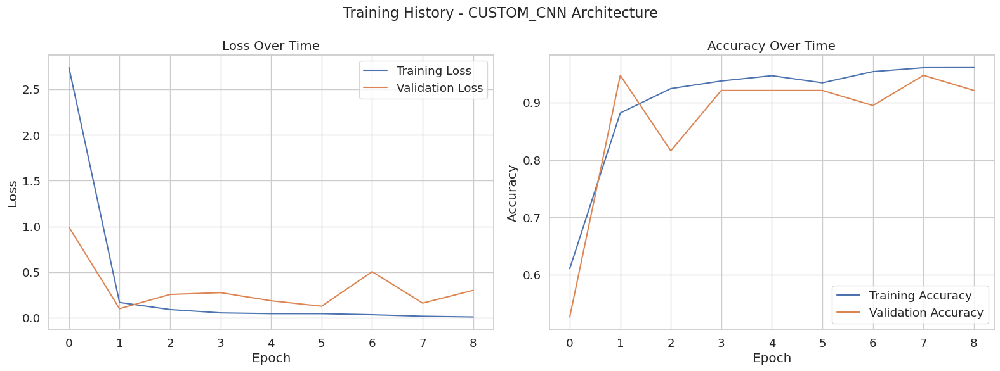

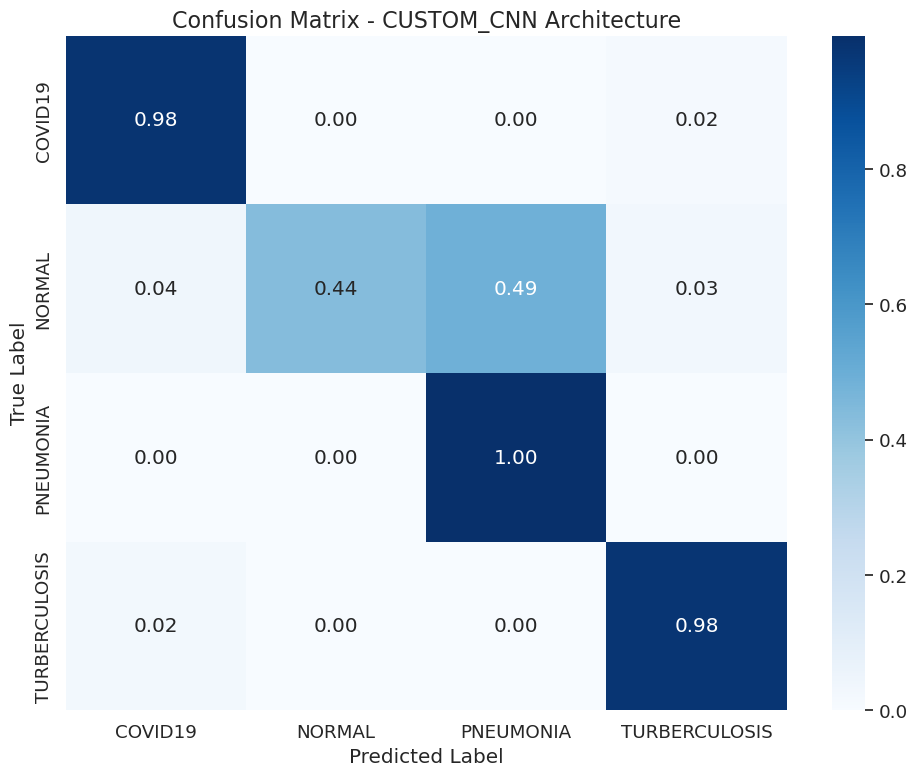

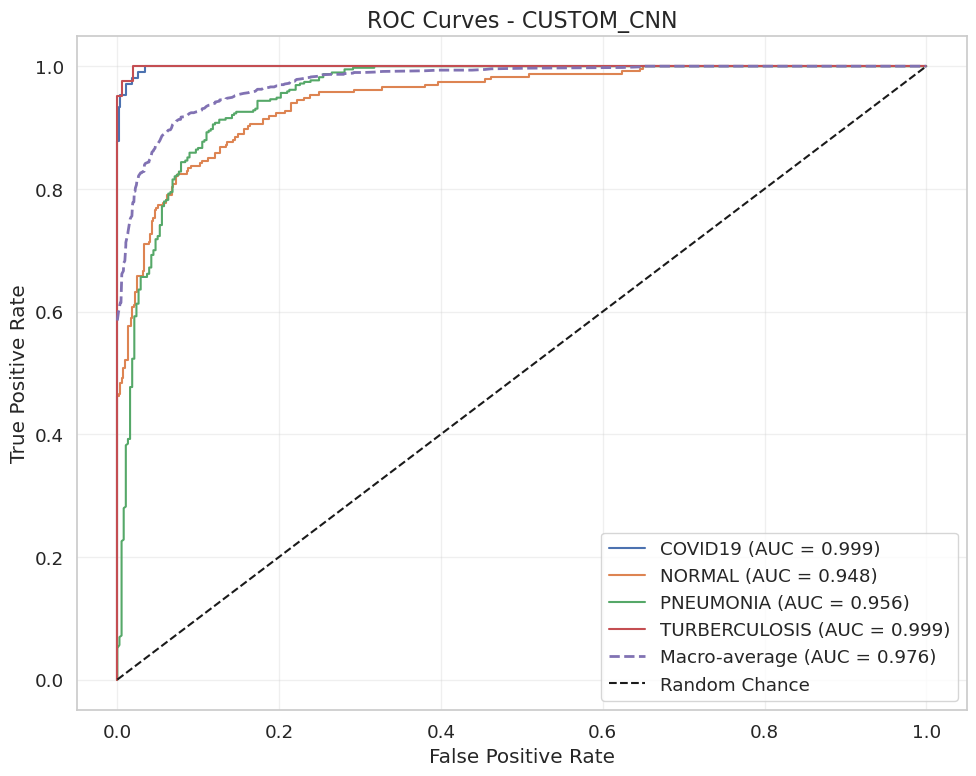

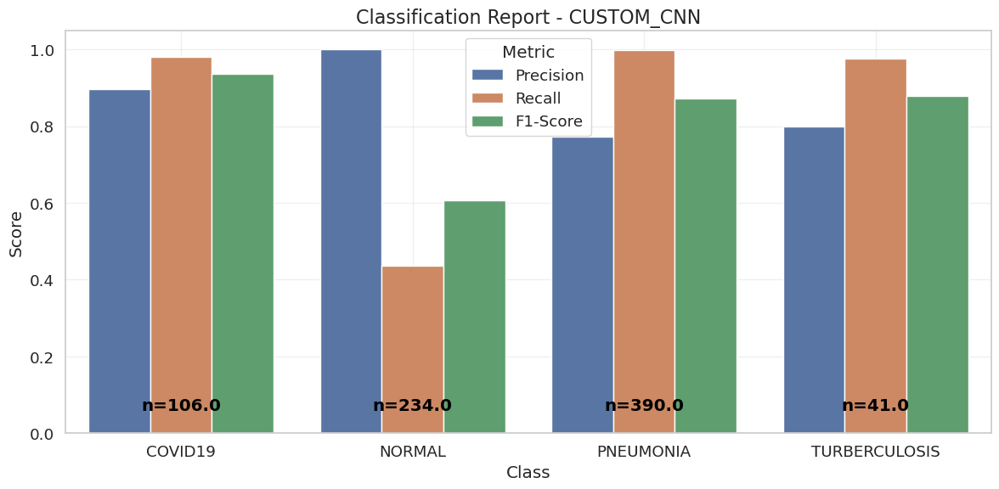

In [ ]:
print(f"\n--- Testing model architecture: custom_cnn ---\n")
arch = 'custom_cnn'
# Initialize model
model = initialize_model(arch, num_classes=num_classes, feature_extract=True)
model = model.to(device)
# Setup loss function with class weights
criterion = nn.CrossEntropyLoss(weight=data['class_weights'])
# Setup optimizer
optimizer = optim.Adam(model.parameters(), lr=0.0003)
# Setup learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3,
)
# Train model
model, history = train_model(
    model, data, criterion, optimizer, scheduler, num_epochs=25,
    is_weighted=True
)
# Evaluate model
eval_results = evaluate_model(model, data['test_loader'], criterion)
# Plot results
plot_training_history(history, title=f'Training History - {arch.upper()} Architecture')
plot_confusion_matrix(
    eval_results['confusion_matrix'], data['class_names'], title=f'Confusion Matrix - {arch.upper()} Architecture'
)
plot_roc_curves(eval_results, title=f'ROC Curves - {arch.upper()}')
plot_classification_report(eval_results['classification_report'], title=f'Classification Report - {arch.upper()}')
all_architecture_results[arch] = {'history': history, 'evaluation': eval_results, 'model': model}


# ### Cell 12.2: Model Architecture: ResNet50


--- Testing model architecture: resnet50 ---



Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /home/grad13/jzhang/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:02<00:00, 46.9MB/s]
/tmp/ipykernel_53715/1996001161.py:38: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)


Converted resnet50 to channels-last format for improved GPU performance
Applied torch.compile() to resnet50 for accelerated execution
Model resnet50 initialized with 23,516,228 total parameters
Trainable parameters: 8,196 (0.03% of total)

Training for up to 25 epochs with early stopping patience 7...
Epoch 1/25
----------


train: 100%|██████████| 24/24 [00:40<00:00,  1.68s/it]


train Loss: 0.9790 Acc: 0.4124


val: 100%|██████████| 1/1 [00:05<00:00,  5.22s/it]


val Loss: 0.8950 Acc: 0.6316

Epoch 2/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.81s/it]


train Loss: 0.5623 Acc: 0.6685


val: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


val Loss: 0.6549 Acc: 0.6842

Epoch 3/25
----------


train: 100%|██████████| 24/24 [00:39<00:00,  1.66s/it]


train Loss: 0.4009 Acc: 0.7223


val: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


val Loss: 0.5865 Acc: 0.7895

Epoch 4/25
----------


train: 100%|██████████| 24/24 [00:40<00:00,  1.67s/it]


train Loss: 0.3168 Acc: 0.7997


val: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


val Loss: 0.5433 Acc: 0.8421

Epoch 5/25
----------


train: 100%|██████████| 24/24 [00:38<00:00,  1.62s/it]


train Loss: 0.2887 Acc: 0.8315


val: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


val Loss: 0.4886 Acc: 0.7895

Epoch 6/25
----------


train: 100%|██████████| 24/24 [00:40<00:00,  1.69s/it]


train Loss: 0.2356 Acc: 0.8645


val: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


val Loss: 0.4215 Acc: 0.7895

Epoch 7/25
----------


train: 100%|██████████| 24/24 [00:39<00:00,  1.66s/it]


train Loss: 0.2183 Acc: 0.8702


val: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]


val Loss: 0.4049 Acc: 0.8158

Epoch 8/25
----------


train: 100%|██████████| 24/24 [00:38<00:00,  1.61s/it]


train Loss: 0.2051 Acc: 0.8737


val: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]


val Loss: 0.3793 Acc: 0.8158

Epoch 9/25
----------


train: 100%|██████████| 24/24 [00:39<00:00,  1.63s/it]


train Loss: 0.1794 Acc: 0.8857


val: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


val Loss: 0.3529 Acc: 0.8158

Epoch 10/25
----------


train: 100%|██████████| 24/24 [00:39<00:00,  1.67s/it]


train Loss: 0.1715 Acc: 0.8873


val: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


val Loss: 0.3436 Acc: 0.8158

Epoch 11/25
----------


train: 100%|██████████| 24/24 [00:41<00:00,  1.74s/it]


train Loss: 0.1624 Acc: 0.8898


val: 100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


val Loss: 0.3320 Acc: 0.8158

Early stopping triggered after 11 epochs
Training complete in 7m 33s
Best val Acc: 0.8421 at epoch 4


Evaluating: 100%|██████████| 4/4 [00:07<00:00,  1.87s/it]


Test Loss: 0.3133, Test Acc: 0.8573
Macro ROC AUC: 0.9727


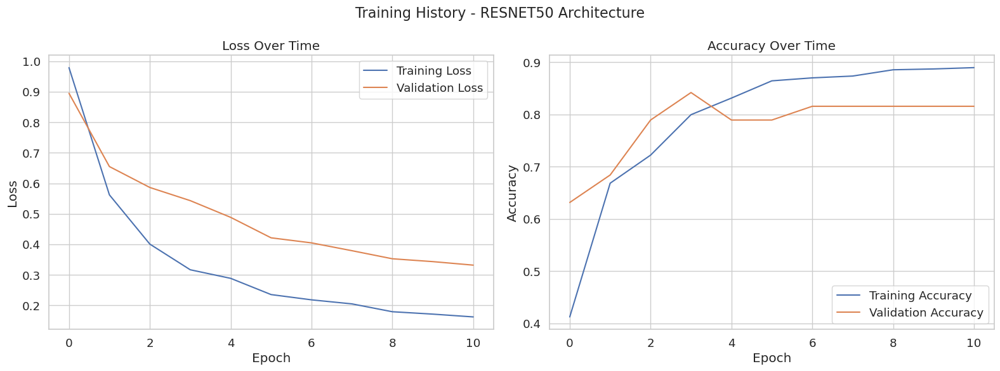

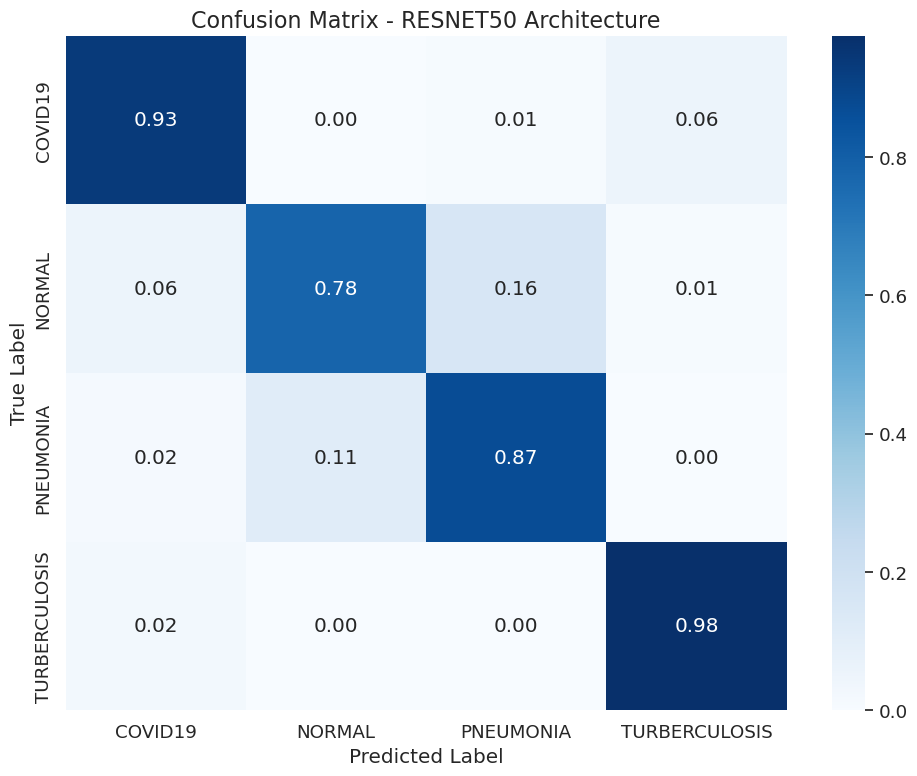

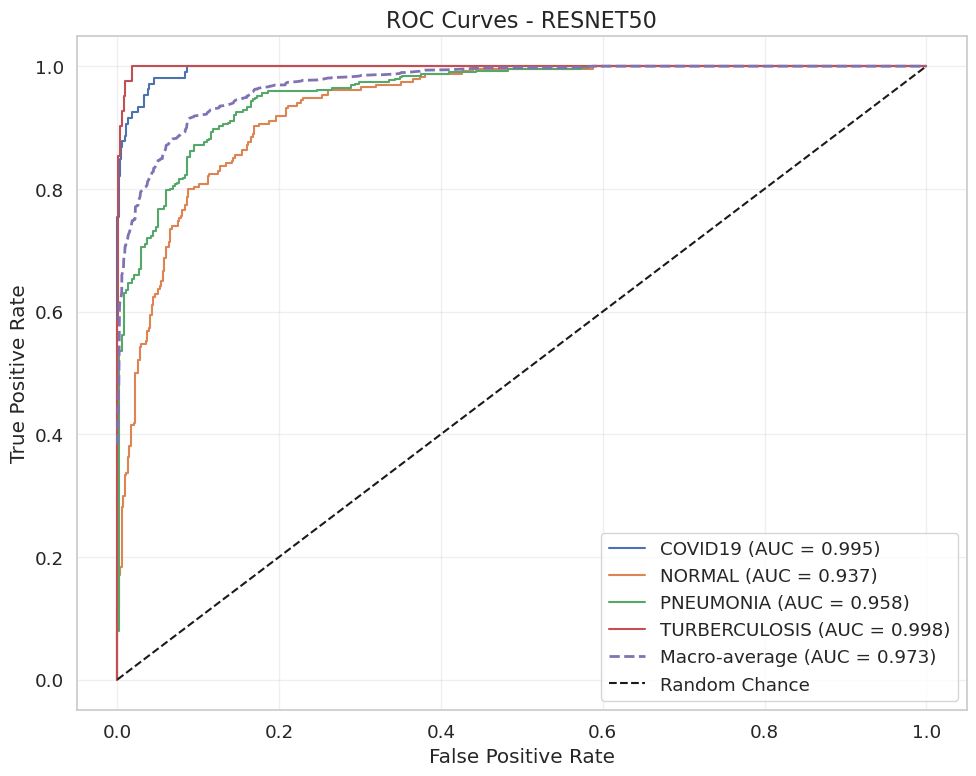

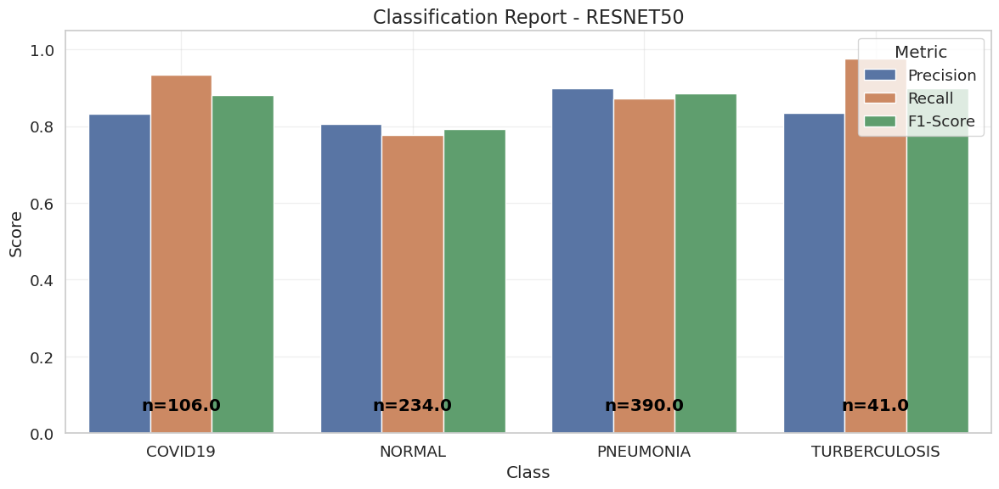

In [ ]:
print(f"\n--- Testing model architecture: resnet50 ---\n")
arch = 'resnet50'
# Initialize model
model = initialize_model(arch, num_classes=num_classes, feature_extract=True)
model = model.to(device)
# Setup loss function with class weights
criterion = nn.CrossEntropyLoss(weight=data['class_weights'])
# Setup optimizer
optimizer = optim.Adam(model.parameters(), lr=0.0005)
# Setup learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3,
)
# Train model
model, history = train_model(
    model, data, criterion, optimizer, scheduler, num_epochs=25,
    is_weighted=True
)
# Evaluate model
eval_results = evaluate_model(model, data['test_loader'], criterion)
# Plot results
plot_training_history(history, title=f'Training History - {arch.upper()} Architecture')
plot_confusion_matrix(
    eval_results['confusion_matrix'], data['class_names'], title=f'Confusion Matrix - {arch.upper()} Architecture'
)
plot_roc_curves(eval_results, title=f'ROC Curves - {arch.upper()}')
plot_classification_report(eval_results['classification_report'], title=f'Classification Report - {arch.upper()}')
all_architecture_results[arch] = {'history': history, 'evaluation': eval_results, 'model': model}


# ### Cell 12.3: Model Architecture: MobileNetV2


/tmp/ipykernel_53715/1996001161.py:38: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)



--- Testing model architecture: mobilenet_v2 ---

Converted mobilenet_v2 to channels-last format for improved GPU performance
Applied torch.compile() to mobilenet_v2 for accelerated execution
Model mobilenet_v2 initialized with 2,228,996 total parameters
Trainable parameters: 5,124 (0.23% of total)

Training for up to 25 epochs with early stopping patience 7...
Epoch 1/25
----------


train: 100%|██████████| 24/24 [00:38<00:00,  1.62s/it]


train Loss: 1.1045 Acc: 0.2844


val: 100%|██████████| 1/1 [00:06<00:00,  6.90s/it]


val Loss: 1.0203 Acc: 0.2895

Epoch 2/25
----------


train: 100%|██████████| 24/24 [00:39<00:00,  1.64s/it]


train Loss: 0.8181 Acc: 0.5367


val: 100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


val Loss: 0.8360 Acc: 0.6316

Epoch 3/25
----------


train: 100%|██████████| 24/24 [00:39<00:00,  1.66s/it]


train Loss: 0.6417 Acc: 0.6427


val: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


val Loss: 0.7159 Acc: 0.6842

Epoch 4/25
----------


train: 100%|██████████| 24/24 [00:40<00:00,  1.69s/it]


train Loss: 0.5326 Acc: 0.6747


val: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]


val Loss: 0.6365 Acc: 0.7105

Epoch 5/25
----------


train: 100%|██████████| 24/24 [00:41<00:00,  1.75s/it]


train Loss: 0.4554 Acc: 0.6913


val: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


val Loss: 0.5731 Acc: 0.7105

Epoch 6/25
----------


train: 100%|██████████| 24/24 [00:45<00:00,  1.88s/it]


train Loss: 0.4092 Acc: 0.7082


val: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]


val Loss: 0.5277 Acc: 0.7105

Epoch 7/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.79s/it]


train Loss: 0.3654 Acc: 0.7377


val: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


val Loss: 0.4920 Acc: 0.7105

Epoch 8/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.83s/it]


train Loss: 0.3319 Acc: 0.7754


val: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


val Loss: 0.4484 Acc: 0.7368

Epoch 9/25
----------


train: 100%|██████████| 24/24 [00:40<00:00,  1.67s/it]


train Loss: 0.3099 Acc: 0.7877


val: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]


val Loss: 0.4159 Acc: 0.7632

Epoch 10/25
----------


train: 100%|██████████| 24/24 [00:41<00:00,  1.75s/it]


train Loss: 0.2842 Acc: 0.8124


val: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]


val Loss: 0.4031 Acc: 0.7895

Epoch 11/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.77s/it]


train Loss: 0.2704 Acc: 0.8195


val: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]


val Loss: 0.3806 Acc: 0.8684

Epoch 12/25
----------


train: 100%|██████████| 24/24 [00:41<00:00,  1.75s/it]


train Loss: 0.2511 Acc: 0.8339


val: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


val Loss: 0.3496 Acc: 0.8421

Epoch 13/25
----------


train: 100%|██████████| 24/24 [00:41<00:00,  1.73s/it]


train Loss: 0.2410 Acc: 0.8449


val: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


val Loss: 0.3436 Acc: 0.8421

Epoch 14/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.80s/it]


train Loss: 0.2249 Acc: 0.8525


val: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


val Loss: 0.3325 Acc: 0.8684

Epoch 15/25
----------


train: 100%|██████████| 24/24 [00:44<00:00,  1.84s/it]


train Loss: 0.2128 Acc: 0.8675


val: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


val Loss: 0.3156 Acc: 0.8684

Epoch 16/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.83s/it]


train Loss: 0.2053 Acc: 0.8644


val: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


val Loss: 0.3039 Acc: 0.8684

Epoch 17/25
----------


train: 100%|██████████| 24/24 [00:44<00:00,  1.87s/it]


train Loss: 0.1955 Acc: 0.8739


val: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


val Loss: 0.2853 Acc: 0.8684

Epoch 18/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.79s/it]


train Loss: 0.1927 Acc: 0.8750


val: 100%|██████████| 1/1 [00:00<00:00,  2.25it/s]


val Loss: 0.2783 Acc: 0.8947

Epoch 19/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.81s/it]


train Loss: 0.1856 Acc: 0.8762


val: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


val Loss: 0.2771 Acc: 0.8947

Epoch 20/25
----------


train: 100%|██████████| 24/24 [00:44<00:00,  1.84s/it]


train Loss: 0.1773 Acc: 0.8825


val: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


val Loss: 0.2501 Acc: 0.9211

Epoch 21/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.79s/it]


train Loss: 0.1786 Acc: 0.8825


val: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]


val Loss: 0.2507 Acc: 0.8947

Epoch 22/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.82s/it]


train Loss: 0.1681 Acc: 0.8876


val: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


val Loss: 0.2430 Acc: 0.8947

Epoch 23/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.79s/it]


train Loss: 0.1604 Acc: 0.8881


val: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


val Loss: 0.2427 Acc: 0.8947

Epoch 24/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.83s/it]


train Loss: 0.1551 Acc: 0.8912


val: 100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


val Loss: 0.2369 Acc: 0.9211

Epoch 25/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.83s/it]


train Loss: 0.1603 Acc: 0.8874


val: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


val Loss: 0.2265 Acc: 0.9211

Training complete in 18m 3s
Best val Acc: 0.9211 at epoch 20


Evaluating: 100%|██████████| 4/4 [00:09<00:00,  2.39s/it]


Test Loss: 0.3193, Test Acc: 0.8612
Macro ROC AUC: 0.9743


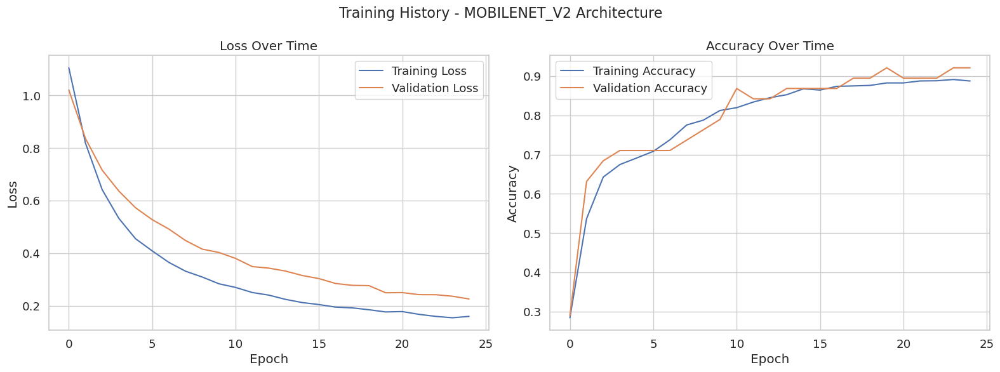

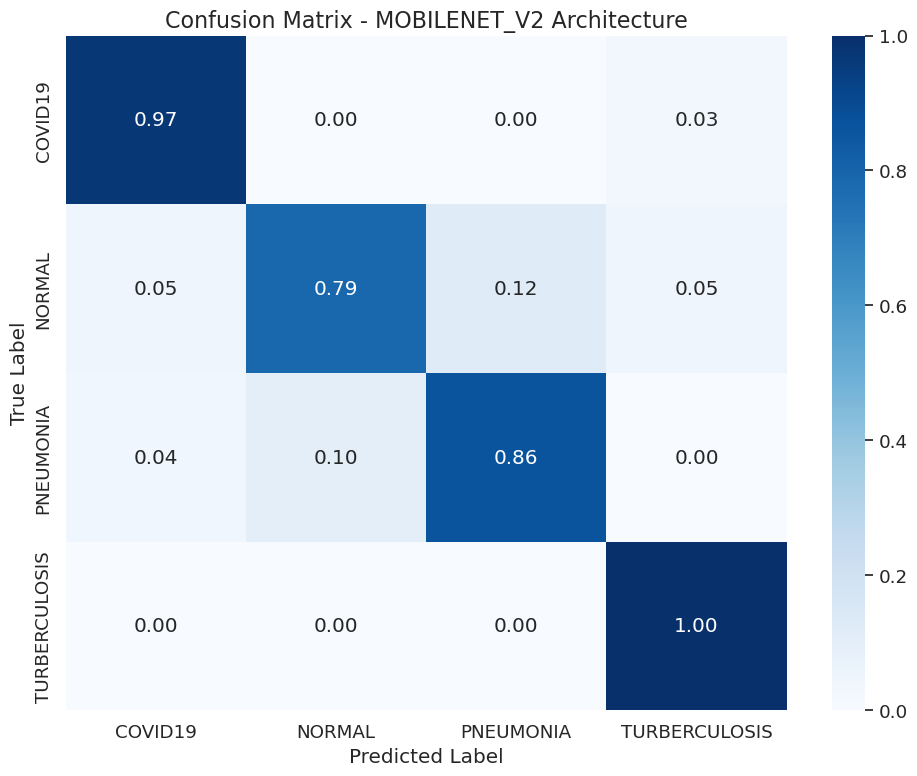

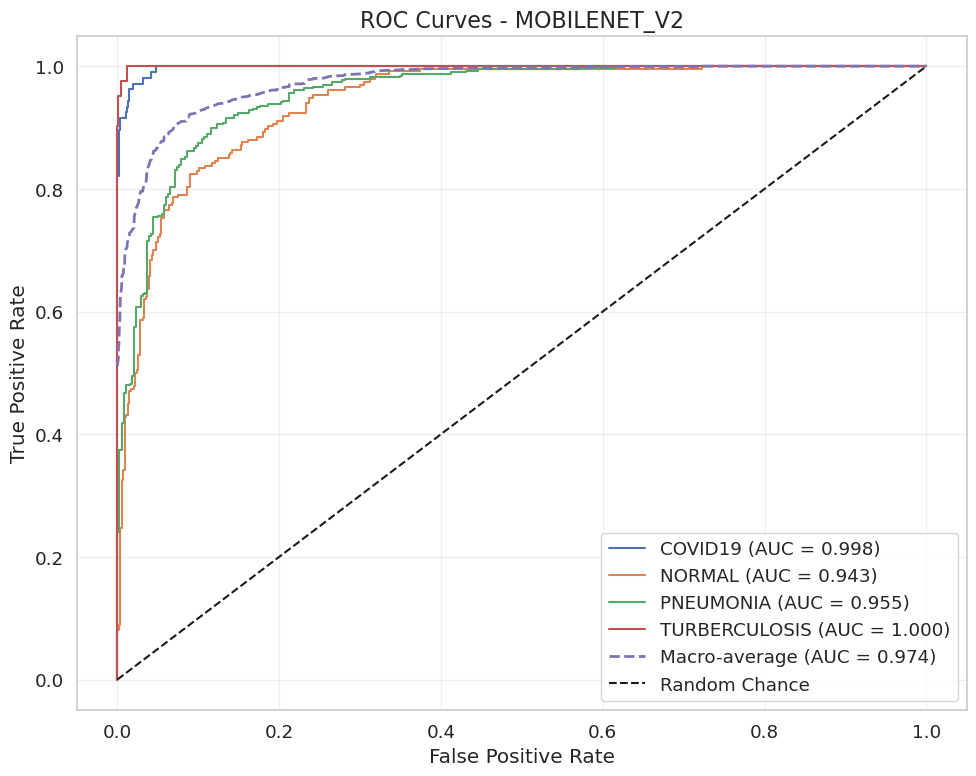

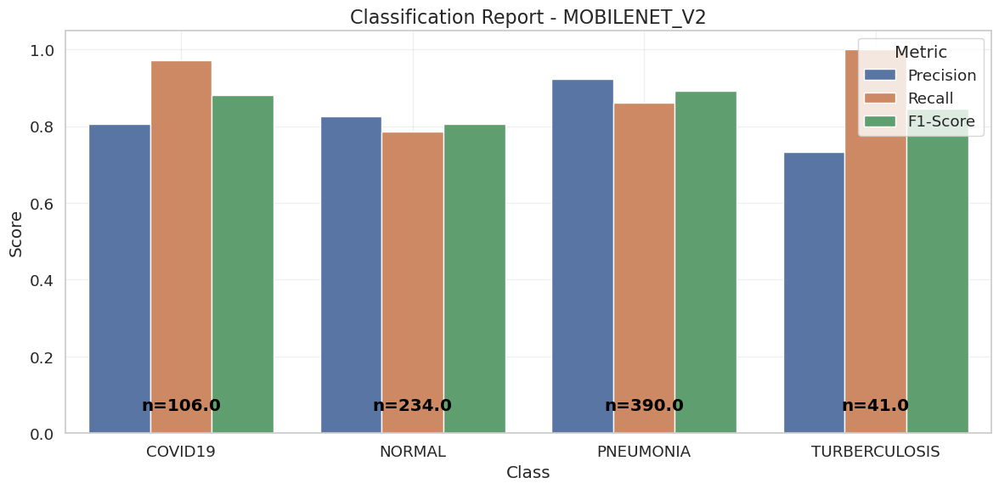

In [ ]:
print(f"\n--- Testing model architecture: mobilenet_v2 ---\n")
arch = 'mobilenet_v2'
# Initialize model
model = initialize_model(arch, num_classes=num_classes, feature_extract=True)
model = model.to(device)
# Setup loss function with class weights
criterion = nn.CrossEntropyLoss(weight=data['class_weights'])
# Setup optimizer
optimizer = optim.Adam(model.parameters(), lr=0.0003)
# Setup learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3,
)
# Train model
model, history = train_model(
    model, data, criterion, optimizer, scheduler, num_epochs=25,
    is_weighted=True
)
# Evaluate model
eval_results = evaluate_model(model, data['test_loader'], criterion)
# Plot results
plot_training_history(history, title=f'Training History - {arch.upper()} Architecture')
plot_confusion_matrix(
    eval_results['confusion_matrix'], data['class_names'], title=f'Confusion Matrix - {arch.upper()} Architecture'
)
plot_roc_curves(eval_results, title=f'ROC Curves - {arch.upper()}')
plot_classification_report(eval_results['classification_report'], title=f'Classification Report - {arch.upper()}')
all_architecture_results[arch] = {'history': history, 'evaluation': eval_results, 'model': model}


# ### Cell 12.4: Model Architecture: DenseNet121


--- Testing model architecture: densenet121 ---



/tmp/ipykernel_53715/1996001161.py:38: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)


Converted densenet121 to channels-last format for improved GPU performance
Applied torch.compile() to densenet121 for accelerated execution
Model densenet121 initialized with 6,957,956 total parameters
Trainable parameters: 4,100 (0.06% of total)

Training for up to 25 epochs with early stopping patience 7...
Epoch 1/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.75s/it]


train Loss: 0.9017 Acc: 0.4534


val: 100%|██████████| 1/1 [00:14<00:00, 14.85s/it]


val Loss: 0.7857 Acc: 0.6316

Epoch 2/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.78s/it]


train Loss: 0.5268 Acc: 0.6603


val: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


val Loss: 0.7379 Acc: 0.7105

Epoch 3/25
----------


train: 100%|██████████| 24/24 [00:44<00:00,  1.85s/it]


train Loss: 0.3579 Acc: 0.7098


val: 100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


val Loss: 0.7009 Acc: 0.7368

Epoch 4/25
----------


train: 100%|██████████| 24/24 [00:45<00:00,  1.89s/it]


train Loss: 0.2775 Acc: 0.7931


val: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


val Loss: 0.6322 Acc: 0.7895

Epoch 5/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.80s/it]


train Loss: 0.2369 Acc: 0.8305


val: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


val Loss: 0.5732 Acc: 0.8158

Epoch 6/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.75s/it]


train Loss: 0.1970 Acc: 0.8672


val: 100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


val Loss: 0.5379 Acc: 0.8421

Epoch 7/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.79s/it]


train Loss: 0.1748 Acc: 0.8778


val: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


val Loss: 0.5419 Acc: 0.8684

Epoch 8/25
----------


train: 100%|██████████| 24/24 [00:41<00:00,  1.72s/it]


train Loss: 0.1654 Acc: 0.8863


val: 100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


val Loss: 0.4753 Acc: 0.8684

Epoch 9/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.77s/it]


train Loss: 0.1498 Acc: 0.8911


val: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


val Loss: 0.4624 Acc: 0.8684

Epoch 10/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.81s/it]


train Loss: 0.1415 Acc: 0.9004


val: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


val Loss: 0.3935 Acc: 0.8421

Epoch 11/25
----------


train: 100%|██████████| 24/24 [00:41<00:00,  1.71s/it]


train Loss: 0.1332 Acc: 0.8993


val: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


val Loss: 0.4321 Acc: 0.8947

Epoch 12/25
----------


train: 100%|██████████| 24/24 [00:41<00:00,  1.75s/it]


train Loss: 0.1258 Acc: 0.9052


val: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


val Loss: 0.4474 Acc: 0.8947

Epoch 13/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.77s/it]


train Loss: 0.1179 Acc: 0.9129


val: 100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


val Loss: 0.4472 Acc: 0.8947

Epoch 14/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.79s/it]


train Loss: 0.1080 Acc: 0.9150


val: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


val Loss: 0.4357 Acc: 0.8947
Learning rate adjusted from 0.000500 to 0.000250

Epoch 15/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.79s/it]


train Loss: 0.1066 Acc: 0.9194


val: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


val Loss: 0.4146 Acc: 0.8947

Epoch 16/25
----------


train: 100%|██████████| 24/24 [00:40<00:00,  1.69s/it]


train Loss: 0.1038 Acc: 0.9187


val: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


val Loss: 0.4502 Acc: 0.8947

Epoch 17/25
----------


train: 100%|██████████| 24/24 [00:41<00:00,  1.72s/it]


train Loss: 0.1036 Acc: 0.9164


val: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]


val Loss: 0.4339 Acc: 0.8947

Epoch 18/25
----------


train: 100%|██████████| 24/24 [00:41<00:00,  1.72s/it]


train Loss: 0.1023 Acc: 0.9186


val: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


val Loss: 0.4489 Acc: 0.8947
Learning rate adjusted from 0.000250 to 0.000125

Early stopping triggered after 18 epochs
Training complete in 13m 9s
Best val Acc: 0.8947 at epoch 11


Evaluating: 100%|██████████| 4/4 [00:09<00:00,  2.26s/it]


Test Loss: 0.2332, Test Acc: 0.9027
Macro ROC AUC: 0.9820


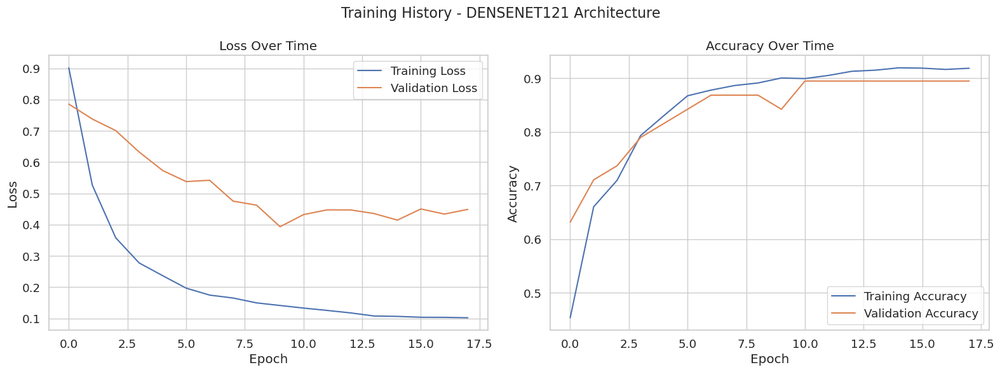

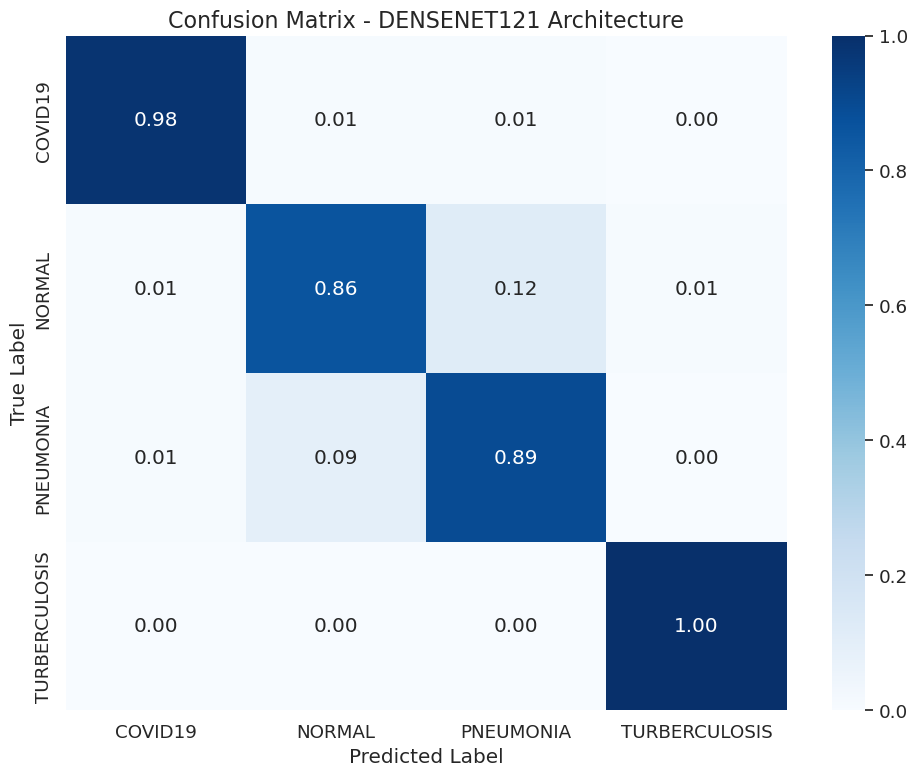

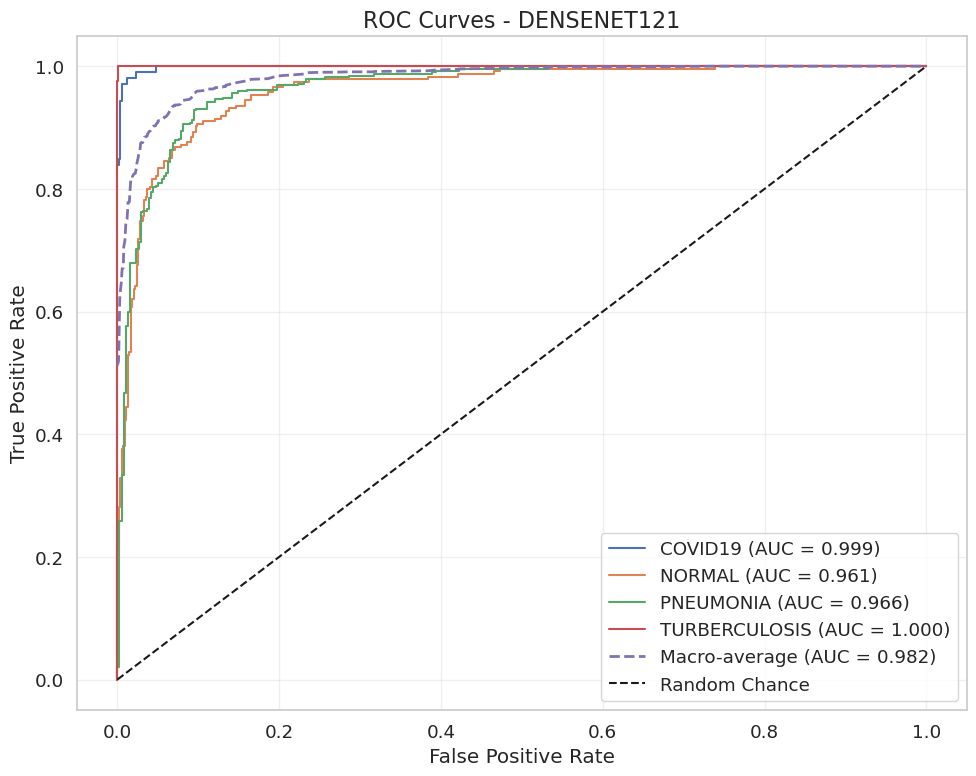

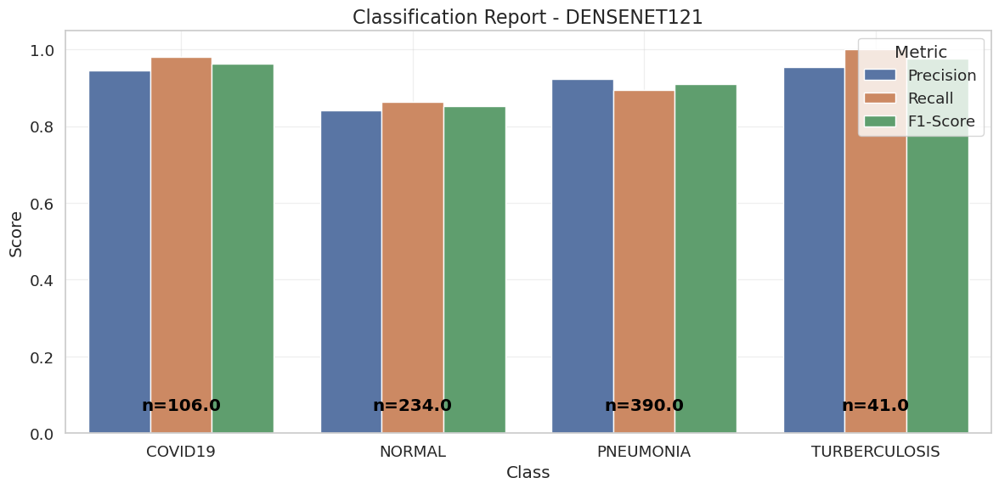

In [ ]:
print(f"\n--- Testing model architecture: densenet121 ---\n")
arch = 'densenet121'
# Initialize model
model = initialize_model(arch, num_classes=num_classes, feature_extract=True)
model = model.to(device)
# Setup loss function with class weights
criterion = nn.CrossEntropyLoss(weight=data['class_weights'])
# Setup optimizer
optimizer = optim.Adam(model.parameters(), lr=0.0005)
# Setup learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3,
)
# Train model
model, history = train_model(
    model, data, criterion, optimizer, scheduler, num_epochs=25,
    is_weighted=True
)
# Evaluate model
eval_results = evaluate_model(model, data['test_loader'], criterion)
# Plot results
plot_training_history(history, title=f'Training History - {arch.upper()} Architecture')
plot_confusion_matrix(
    eval_results['confusion_matrix'], data['class_names'], title=f'Confusion Matrix - {arch.upper()} Architecture'
)
plot_roc_curves(eval_results, title=f'ROC Curves - {arch.upper()}')
plot_classification_report(eval_results['classification_report'], title=f'Classification Report - {arch.upper()}')
all_architecture_results[arch] = {'history': history, 'evaluation': eval_results, 'model': model}


# ### Cell 12.5: Model Architecture: EfficientNetB0


--- Testing model architecture: efficientnet_b0 ---



/tmp/ipykernel_53715/1996001161.py:38: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)


Converted efficientnet_b0 to channels-last format for improved GPU performance
Applied torch.compile() to efficientnet_b0 for accelerated execution
Model efficientnet_b0 initialized with 4,012,672 total parameters
Trainable parameters: 5,124 (0.13% of total)

Training for up to 25 epochs with early stopping patience 7...
Epoch 1/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.78s/it]


train Loss: 1.0608 Acc: 0.3546


val: 100%|██████████| 1/1 [00:08<00:00,  8.88s/it]


val Loss: 1.0883 Acc: 0.3947

Epoch 2/25
----------


train: 100%|██████████| 24/24 [00:41<00:00,  1.73s/it]


train Loss: 0.7298 Acc: 0.5854


val: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


val Loss: 0.7075 Acc: 0.6053

Epoch 3/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.82s/it]


train Loss: 0.5485 Acc: 0.6633


val: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


val Loss: 0.6125 Acc: 0.6842

Epoch 4/25
----------


train: 100%|██████████| 24/24 [00:44<00:00,  1.87s/it]


train Loss: 0.4498 Acc: 0.7110


val: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


val Loss: 0.5548 Acc: 0.7105

Epoch 5/25
----------


train: 100%|██████████| 24/24 [00:44<00:00,  1.84s/it]


train Loss: 0.3959 Acc: 0.7469


val: 100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


val Loss: 0.5088 Acc: 0.8421

Epoch 6/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.82s/it]


train Loss: 0.3528 Acc: 0.7815


val: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


val Loss: 0.4708 Acc: 0.8684

Epoch 7/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.82s/it]


train Loss: 0.3130 Acc: 0.8103


val: 100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


val Loss: 0.4513 Acc: 0.8684

Epoch 8/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.76s/it]


train Loss: 0.2905 Acc: 0.8365


val: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


val Loss: 0.4216 Acc: 0.8684

Epoch 9/25
----------


train: 100%|██████████| 24/24 [00:45<00:00,  1.90s/it]


train Loss: 0.2793 Acc: 0.8356


val: 100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


val Loss: 0.3958 Acc: 0.8947

Epoch 10/25
----------


train: 100%|██████████| 24/24 [00:41<00:00,  1.73s/it]


train Loss: 0.2527 Acc: 0.8482


val: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


val Loss: 0.5550 Acc: 0.8947

Epoch 11/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.78s/it]


train Loss: 0.2473 Acc: 0.8538


val: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


val Loss: 0.3779 Acc: 0.8947

Epoch 12/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.81s/it]


train Loss: 0.2387 Acc: 0.8604


val: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


val Loss: 10.3272 Acc: 0.8684

Epoch 13/25
----------


train: 100%|██████████| 24/24 [00:44<00:00,  1.83s/it]


train Loss: 0.2244 Acc: 0.8644


val: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


val Loss: 0.9131 Acc: 0.8684

Epoch 14/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.78s/it]


train Loss: 0.2142 Acc: 0.8731


val: 100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


val Loss: 22.9029 Acc: 0.8684

Epoch 15/25
----------


train: 100%|██████████| 24/24 [00:44<00:00,  1.83s/it]


train Loss: 0.2087 Acc: 0.8811


val: 100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


val Loss: 0.3365 Acc: 0.8947

Epoch 16/25
----------


train: 100%|██████████| 24/24 [00:43<00:00,  1.83s/it]


train Loss: 0.1973 Acc: 0.8764


val: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


val Loss: 60.5557 Acc: 0.8684

Early stopping triggered after 16 epochs
Training complete in 11m 52s
Best val Acc: 0.8947 at epoch 9


Evaluating: 100%|██████████| 4/4 [00:09<00:00,  2.50s/it]


Test Loss: 0.3018, Test Acc: 0.8716
Macro ROC AUC: 0.9767


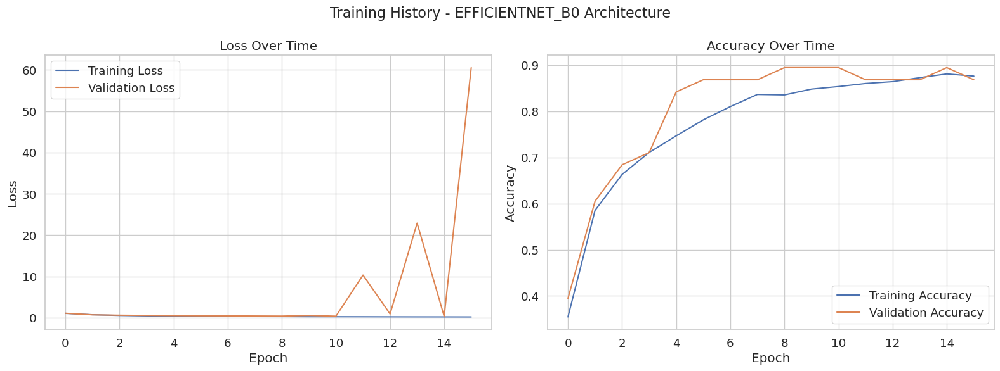

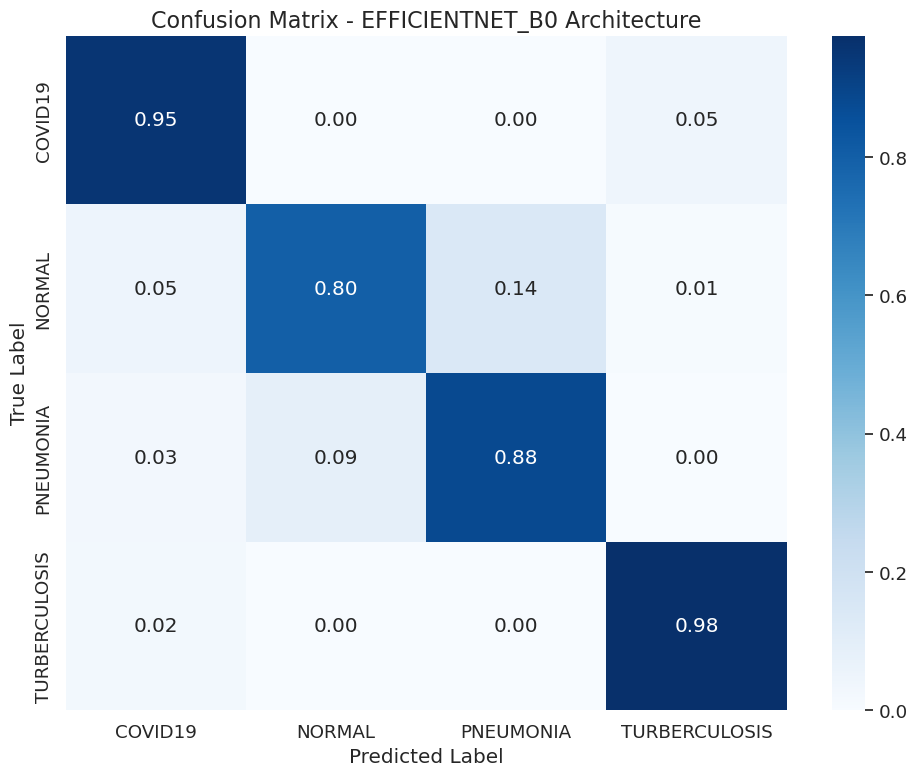

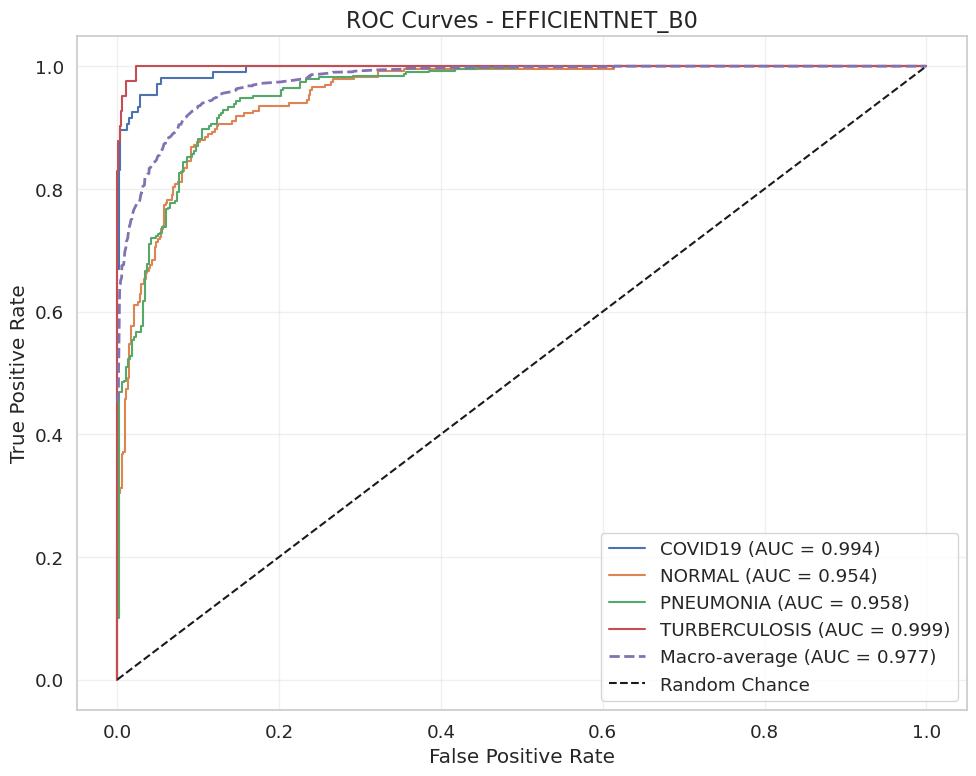

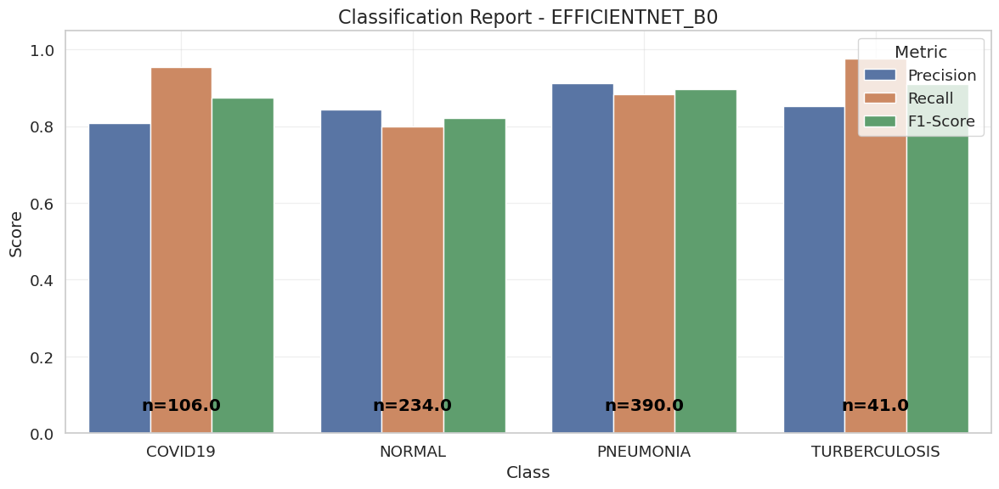

In [ ]:
print(f"\n--- Testing model architecture: efficientnet_b0 ---\n")
arch = 'efficientnet_b0'
# Initialize model
model = initialize_model(arch, num_classes=num_classes, feature_extract=True)
model = model.to(device)
# Setup loss function with class weights
criterion = nn.CrossEntropyLoss(weight=data['class_weights'])
# Setup optimizer
optimizer = optim.Adam(model.parameters(), lr=0.0003)
# Setup learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3,
)
# Train model
model, history = train_model(
    model, data, criterion, optimizer, scheduler, num_epochs=25,
    is_weighted=True
)
# Evaluate model
eval_results = evaluate_model(model, data['test_loader'], criterion)
# Plot results
plot_training_history(history, title=f'Training History - {arch.upper()} Architecture')
plot_confusion_matrix(
    eval_results['confusion_matrix'], data['class_names'], title=f'Confusion Matrix - {arch.upper()} Architecture'
)
plot_roc_curves(eval_results, title=f'ROC Curves - {arch.upper()}')
plot_classification_report(eval_results['classification_report'], title=f'Classification Report - {arch.upper()}')
all_architecture_results[arch] = {'history': history, 'evaluation': eval_results, 'model': model}


# ### Cell 12.6: Compare Model Architectures


=== Comparison of Model Architectures ===

        Experiment  Validation Accuracy  Test Accuracy  Macro AUC
0       custom_cnn             0.947368       0.823606   0.975994
1         resnet50             0.842105       0.857328   0.972655
2     mobilenet_v2             0.921053       0.861219   0.974268
3      densenet121             0.894737       0.902724   0.982015
4  efficientnet_b0             0.894737       0.871595   0.976654


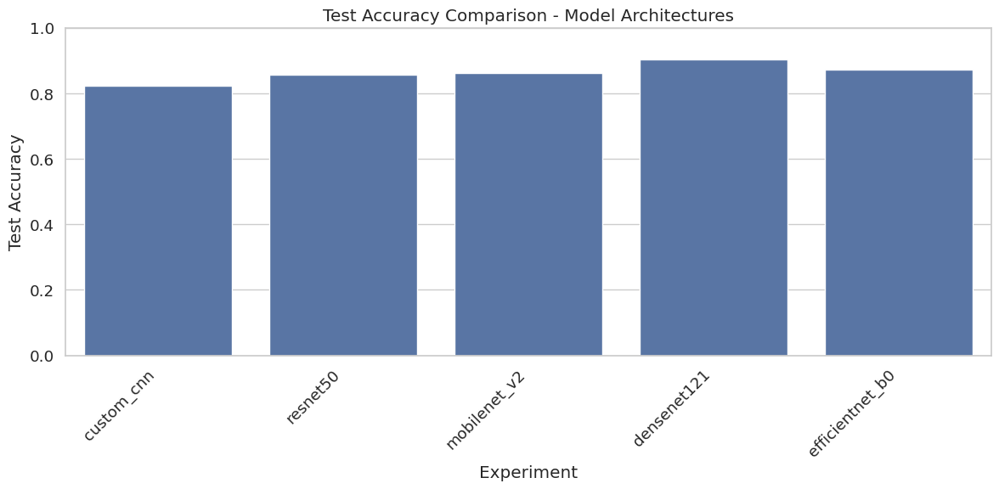

In [ ]:
compare_experiment_results(all_architecture_results, 'Model Architectures')

# ## Cell 13: Experiment - Class Balancing Techniques


In [ ]:
print("\n=== Class Balancing Techniques Experiment ===\n")
# Best preprocessing and architecture from previous experiments
best_preprocessing = 'standard'
best_architecture = 'densenet121'
# Load datasets with best preprocessing
data = load_datasets(preprocessing_method=best_preprocessing)
# Balancing techniques to test
balancing_techniques = {'No Balancing': None, 'Weighted Sampler': 'weighted_sampler', 'Class Weights': 'class_weights'}
all_balancing_results = {}



=== Class Balancing Techniques Experiment ===

Loading datasets with standard preprocessing...

Class distribution:
COVID19: Train=460, Val=10, Test=106
NORMAL: Train=1341, Val=8, Test=234
PNEUMONIA: Train=3875, Val=8, Test=390
TURBERCULOSIS: Train=650, Val=12, Test=41


# ### Cell 13.1: Class Balancing: No Balancing



--- Testing class balancing technique: No Balancing ---

Converted densenet121 to channels-last format for improved GPU performance
Applied torch.compile() to densenet121 for accelerated execution
Model densenet121 initialized with 6,957,956 total parameters
Trainable parameters: 4,100 (0.06% of total)


/tmp/ipykernel_53715/1996001161.py:38: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)



Training for up to 25 epochs with early stopping patience 7...
Epoch 1/25
----------


train: 100%|██████████| 24/24 [00:30<00:00,  1.27s/it]


train Loss: 0.9808 Acc: 0.6021


val: 100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


val Loss: 1.5020 Acc: 0.2895

Epoch 2/25
----------


train: 100%|██████████| 24/24 [00:32<00:00,  1.35s/it]


train Loss: 0.7190 Acc: 0.6932


val: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


val Loss: 1.1493 Acc: 0.4211

Epoch 3/25
----------


train: 100%|██████████| 24/24 [00:32<00:00,  1.34s/it]


train Loss: 0.5418 Acc: 0.7774


val: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


val Loss: 0.9568 Acc: 0.5263

Epoch 4/25
----------


train: 100%|██████████| 24/24 [00:31<00:00,  1.29s/it]


train Loss: 0.4344 Acc: 0.8271


val: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]


val Loss: 0.8656 Acc: 0.6053

Epoch 5/25
----------


train: 100%|██████████| 24/24 [00:31<00:00,  1.32s/it]


train Loss: 0.3649 Acc: 0.8604


val: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]


val Loss: 0.7830 Acc: 0.8158

Epoch 6/25
----------


train: 100%|██████████| 24/24 [00:31<00:00,  1.29s/it]


train Loss: 0.3185 Acc: 0.8724


val: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]


val Loss: 0.7677 Acc: 0.7895

Epoch 7/25
----------


train: 100%|██████████| 24/24 [00:31<00:00,  1.32s/it]


train Loss: 0.2860 Acc: 0.8908


val: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


val Loss: 0.7495 Acc: 0.8158

Epoch 8/25
----------


train: 100%|██████████| 24/24 [00:32<00:00,  1.35s/it]


train Loss: 0.2653 Acc: 0.8954


val: 100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


val Loss: 0.6864 Acc: 0.8158

Epoch 9/25
----------


train: 100%|██████████| 24/24 [00:30<00:00,  1.28s/it]


train Loss: 0.2452 Acc: 0.9007


val: 100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


val Loss: 0.6713 Acc: 0.8158

Epoch 10/25
----------


train: 100%|██████████| 24/24 [00:30<00:00,  1.29s/it]


train Loss: 0.2317 Acc: 0.9053


val: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


val Loss: 0.6782 Acc: 0.8158

Epoch 11/25
----------


train: 100%|██████████| 24/24 [00:31<00:00,  1.30s/it]


train Loss: 0.2205 Acc: 0.9093


val: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]


val Loss: 0.6729 Acc: 0.8158

Epoch 12/25
----------


train: 100%|██████████| 24/24 [00:31<00:00,  1.31s/it]


train Loss: 0.2068 Acc: 0.9145


val: 100%|██████████| 1/1 [00:00<00:00,  2.18it/s]


val Loss: 0.6713 Acc: 0.8158

Early stopping triggered after 12 epochs
Training complete in 6m 24s
Best val Acc: 0.8158 at epoch 5


Evaluating: 100%|██████████| 4/4 [00:08<00:00,  2.07s/it]


Test Loss: 0.4161, Test Acc: 0.8301
Macro ROC AUC: 0.9810


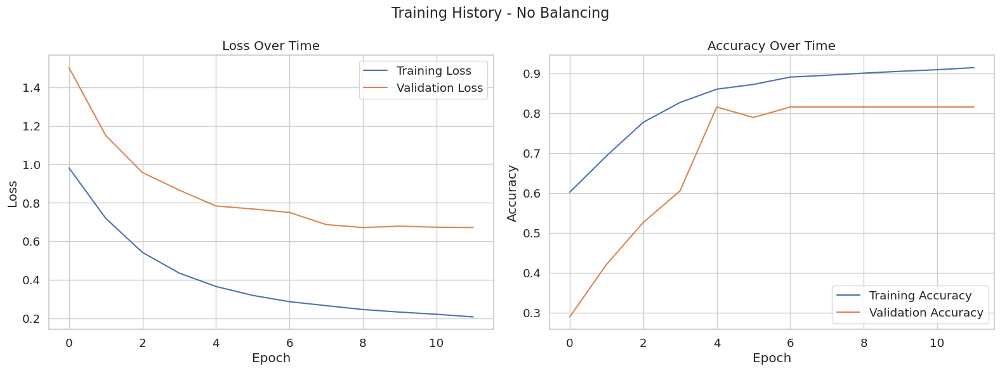

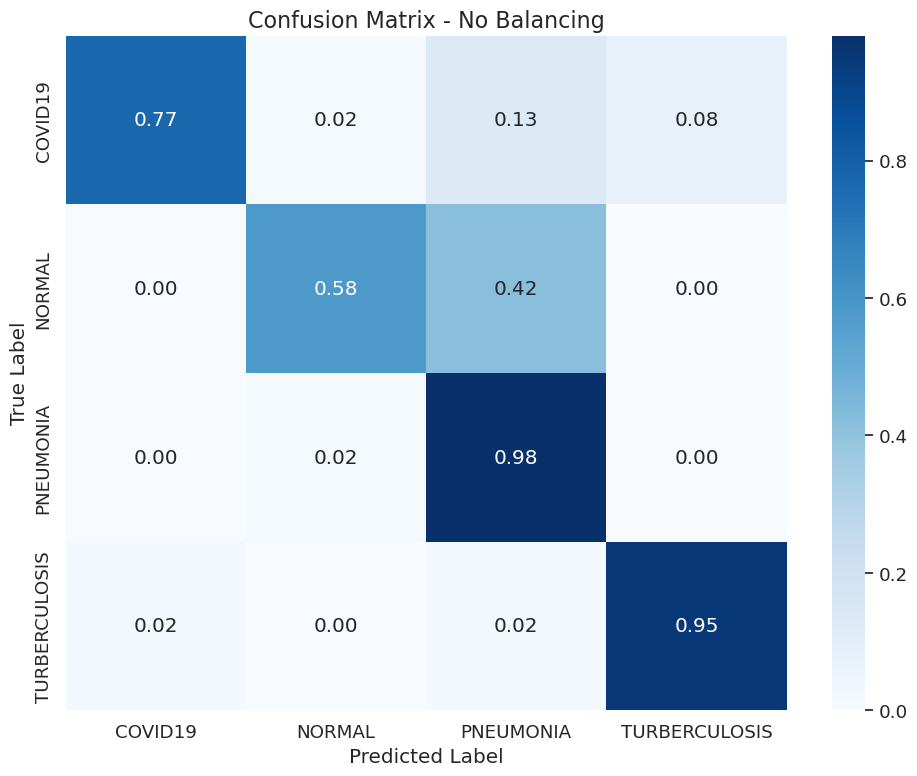

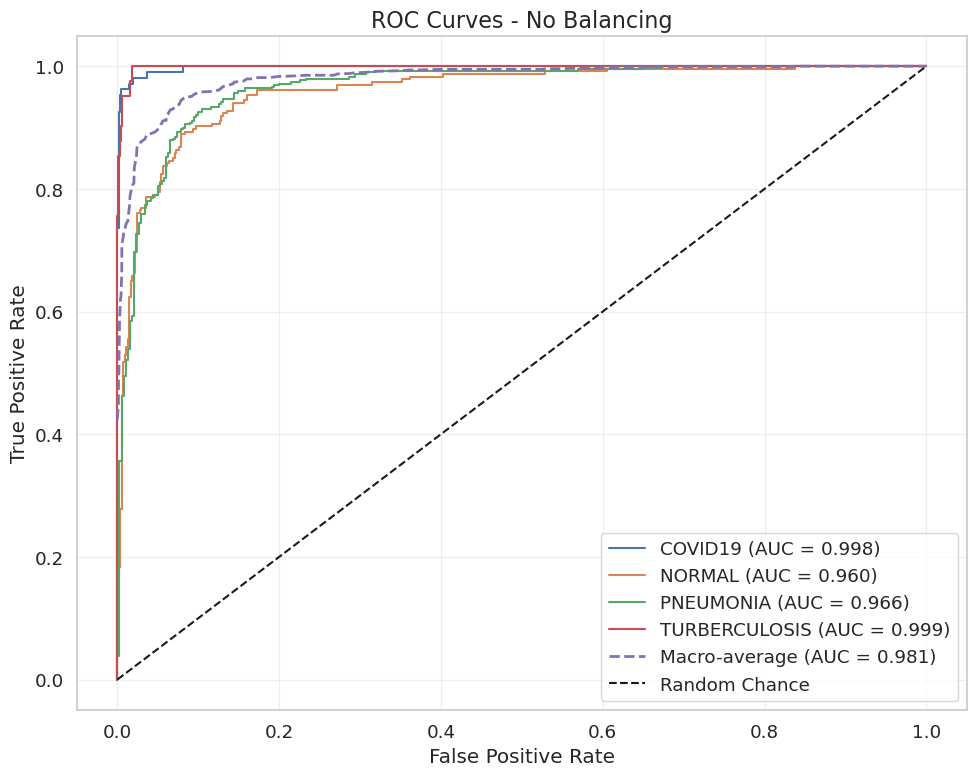

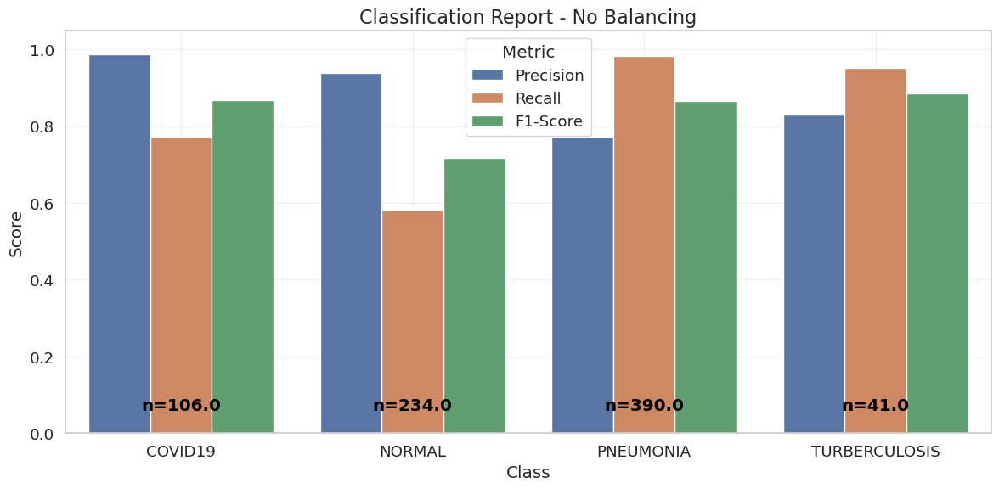

In [ ]:
print(f"\n--- Testing class balancing technique: No Balancing ---\n")
technique_name = 'No Balancing'
technique = balancing_techniques[technique_name]
# Reload datasets to apply different samplers
train_loader = DataLoader(
    data['train_dataset'],
    batch_size=batch_size,
    shuffle=True, # Shuffle if no sampler
    num_workers=3,
    pin_memory=True,
    persistent_workers=True,
    prefetch_factor=4,
    drop_last=True
)
current_data = {**data, 'train_loader': train_loader}
is_weighted = False
criterion_weight = None

# Initialize model
model = initialize_model(best_architecture, num_classes=num_classes, feature_extract=True)
model = model.to(device)
# Setup loss function with class weights
criterion = nn.CrossEntropyLoss(weight=criterion_weight)
# Setup optimizer
optimizer = optim.Adam(model.parameters(), lr=0.0003)
# Setup learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3,
)
# Train model
model, history = train_model(
    model, current_data, criterion, optimizer, scheduler, num_epochs=25,
    is_weighted=is_weighted
)
# Evaluate model
eval_results = evaluate_model(model, current_data['test_loader'], criterion)
# Plot results
plot_training_history(history, title=f'Training History - {technique_name}')
plot_confusion_matrix(
    eval_results['confusion_matrix'], data['class_names'], title=f'Confusion Matrix - {technique_name}'
)
plot_roc_curves(eval_results, title=f'ROC Curves - {technique_name}')
plot_classification_report(eval_results['classification_report'], title=f'Classification Report - {technique_name}')
all_balancing_results[technique_name] = {'history': history, 'evaluation': eval_results, 'model': model}


# ### Cell 13.2: Class Balancing: Weighted Sampler



--- Testing class balancing technique: Weighted Sampler ---



/tmp/ipykernel_53715/1996001161.py:38: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)


Converted densenet121 to channels-last format for improved GPU performance
Applied torch.compile() to densenet121 for accelerated execution
Model densenet121 initialized with 6,957,956 total parameters
Trainable parameters: 4,100 (0.06% of total)

Training for up to 25 epochs with early stopping patience 7...
Epoch 1/25
----------


train: 100%|██████████| 24/24 [00:40<00:00,  1.67s/it]


train Loss: 1.1873 Acc: 0.5005


val: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


val Loss: 1.0986 Acc: 0.7368

Epoch 2/25
----------


train: 100%|██████████| 24/24 [00:41<00:00,  1.73s/it]


train Loss: 0.8312 Acc: 0.7852


val: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


val Loss: 0.8371 Acc: 0.8421

Epoch 3/25
----------


train: 100%|██████████| 24/24 [00:39<00:00,  1.66s/it]


train Loss: 0.6088 Acc: 0.8558


val: 100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


val Loss: 0.7425 Acc: 0.8947

Epoch 4/25
----------


train: 100%|██████████| 24/24 [00:40<00:00,  1.69s/it]


train Loss: 0.4865 Acc: 0.8751


val: 100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


val Loss: 0.6572 Acc: 0.8947

Epoch 5/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.76s/it]


train Loss: 0.4019 Acc: 0.8925


val: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


val Loss: 0.6118 Acc: 0.8947

Epoch 6/25
----------


train: 100%|██████████| 24/24 [00:40<00:00,  1.69s/it]


train Loss: 0.3460 Acc: 0.8954


val: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


val Loss: 0.5626 Acc: 0.8947

Epoch 7/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.78s/it]


train Loss: 0.3053 Acc: 0.9012


val: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


val Loss: 0.5322 Acc: 0.8947

Epoch 8/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.78s/it]


train Loss: 0.2713 Acc: 0.9099


val: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


val Loss: 0.5017 Acc: 0.8947

Epoch 9/25
----------


train: 100%|██████████| 24/24 [00:42<00:00,  1.76s/it]


train Loss: 0.2583 Acc: 0.9121


val: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


val Loss: 0.4857 Acc: 0.8947

Epoch 10/25
----------


train: 100%|██████████| 24/24 [00:41<00:00,  1.72s/it]


train Loss: 0.2474 Acc: 0.9123


val: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


val Loss: 0.4602 Acc: 0.8947

Early stopping triggered after 10 epochs
Training complete in 6m 60s
Best val Acc: 0.8947 at epoch 3


Evaluating: 100%|██████████| 4/4 [00:08<00:00,  2.08s/it]


Test Loss: 0.3402, Test Acc: 0.9001
Macro ROC AUC: 0.9805


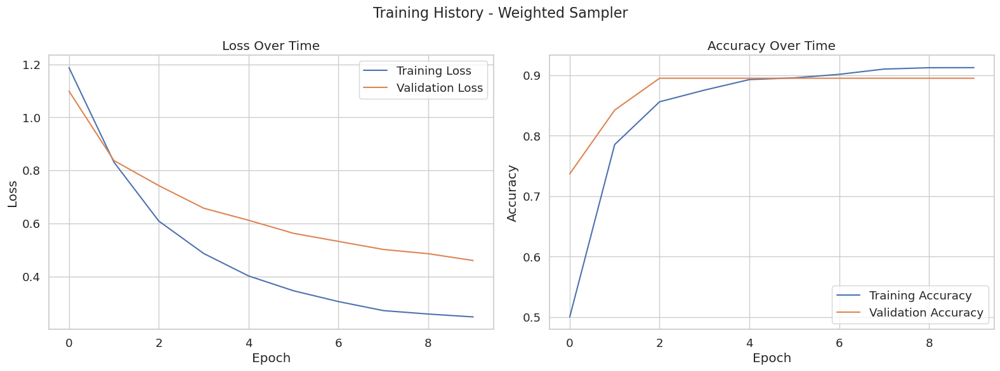

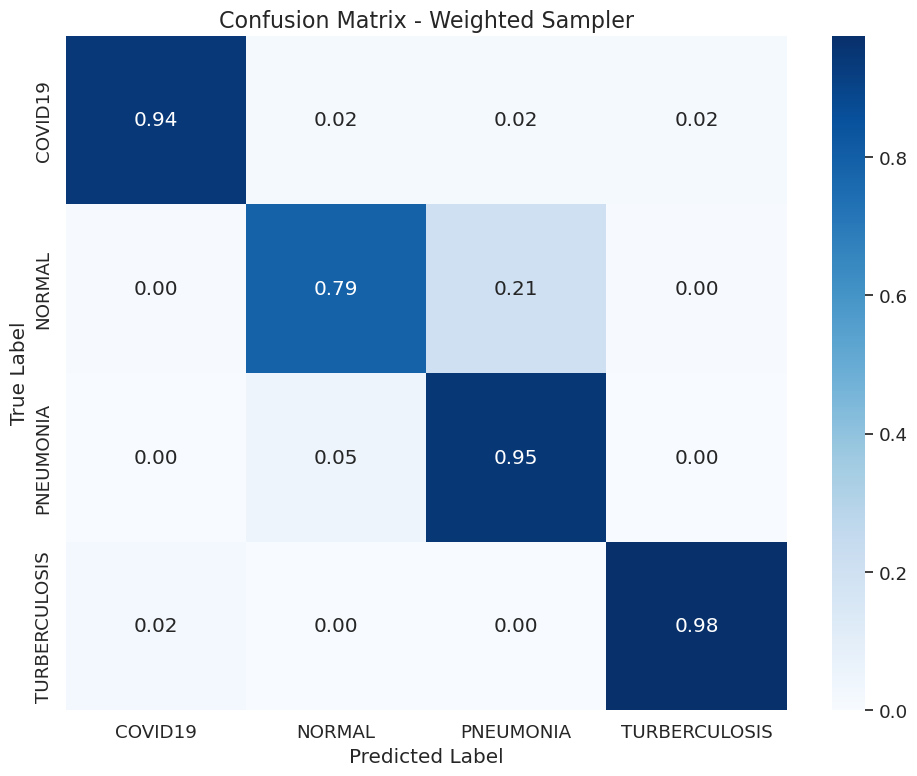

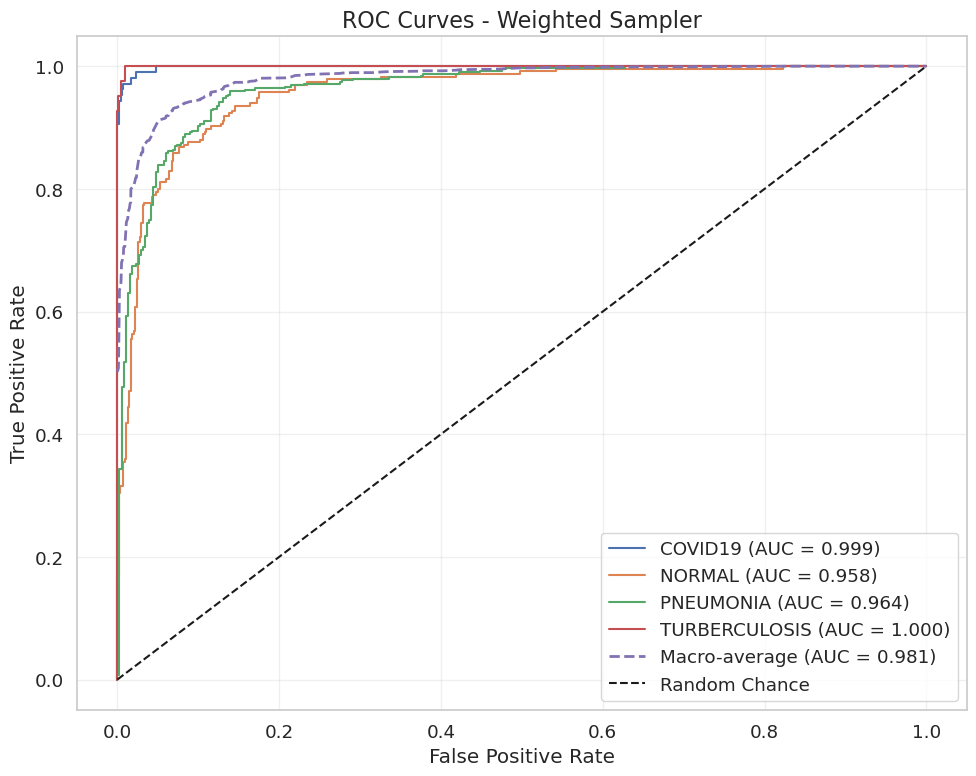

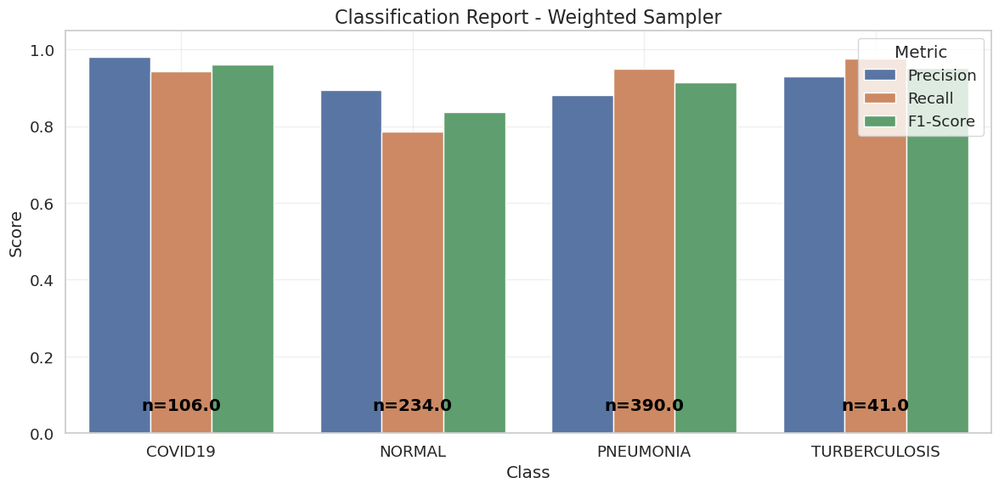

In [ ]:
print(f"\n--- Testing class balancing technique: Weighted Sampler ---\n")
technique_name = 'Weighted Sampler'
technique = balancing_techniques[technique_name]
# Reload datasets to apply different samplers
train_loader = DataLoader(
    data['train_dataset'],
    batch_size=batch_size,
    sampler=create_weighted_sampler(data['train_dataset']),
    num_workers=3,
    pin_memory=True,
    persistent_workers=True,
    prefetch_factor=4,
    drop_last=True
)
current_data = {**data, 'train_loader': train_loader}
is_weighted = False # Weights are in the sampler
criterion_weight = None

# Initialize model
model = initialize_model(best_architecture, num_classes=num_classes, feature_extract=True)
model = model.to(device)
# Setup loss function with class weights
criterion = nn.CrossEntropyLoss(weight=criterion_weight)
# Setup optimizer
optimizer = optim.Adam(model.parameters(), lr=0.0003)
# Setup learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3,
)
# Train model
model, history = train_model(
    model, current_data, criterion, optimizer, scheduler, num_epochs=25,
    is_weighted=is_weighted
)
# Evaluate model
eval_results = evaluate_model(model, current_data['test_loader'], criterion)
# Plot results
plot_training_history(history, title=f'Training History - {technique_name}')
plot_confusion_matrix(
    eval_results['confusion_matrix'], data['class_names'], title=f'Confusion Matrix - {technique_name}'
)
plot_roc_curves(eval_results, title=f'ROC Curves - {technique_name}')
plot_classification_report(eval_results['classification_report'], title=f'Classification Report - {technique_name}')
all_balancing_results[technique_name] = {'history': history, 'evaluation': eval_results, 'model': model}


# ### Cell 13.3: Class Balancing: Class Weights


/tmp/ipykernel_53715/1996001161.py:38: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)



--- Testing class balancing technique: Class Weights ---

Converted densenet121 to channels-last format for improved GPU performance
Applied torch.compile() to densenet121 for accelerated execution
Model densenet121 initialized with 6,957,956 total parameters
Trainable parameters: 4,100 (0.06% of total)

Training for up to 25 epochs with early stopping patience 7...
Epoch 1/25
----------


train: 100%|██████████| 24/24 [00:36<00:00,  1.51s/it]


train Loss: 1.0036 Acc: 0.3568


val: 100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


val Loss: 0.9971 Acc: 0.3947

Epoch 2/25
----------


train: 100%|██████████| 24/24 [00:35<00:00,  1.49s/it]


train Loss: 0.6936 Acc: 0.5892


val: 100%|██████████| 1/1 [00:00<00:00,  2.27it/s]


val Loss: 0.9288 Acc: 0.6316

Epoch 3/25
----------


train: 100%|██████████| 24/24 [00:35<00:00,  1.49s/it]


train Loss: 0.4866 Acc: 0.6747


val: 100%|██████████| 1/1 [00:00<00:00,  2.17it/s]


val Loss: 0.8690 Acc: 0.6053

Epoch 4/25
----------


train: 100%|██████████| 24/24 [00:35<00:00,  1.48s/it]


train Loss: 0.3856 Acc: 0.7126


val: 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]


val Loss: 0.8246 Acc: 0.6842

Epoch 5/25
----------


train: 100%|██████████| 24/24 [00:36<00:00,  1.52s/it]


train Loss: 0.3096 Acc: 0.7785


val: 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]


val Loss: 0.7797 Acc: 0.7368

Epoch 6/25
----------


train: 100%|██████████| 24/24 [00:37<00:00,  1.55s/it]


train Loss: 0.2670 Acc: 0.8199


val: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]


val Loss: 0.7343 Acc: 0.7632

Epoch 7/25
----------


train: 100%|██████████| 24/24 [00:34<00:00,  1.45s/it]


train Loss: 0.2407 Acc: 0.8445


val: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


val Loss: 0.6925 Acc: 0.7895

Epoch 8/25
----------


train: 100%|██████████| 24/24 [00:35<00:00,  1.46s/it]


train Loss: 0.2179 Acc: 0.8604


val: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


val Loss: 0.6982 Acc: 0.8158

Epoch 9/25
----------


train: 100%|██████████| 24/24 [00:33<00:00,  1.40s/it]


train Loss: 0.2008 Acc: 0.8702


val: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]


val Loss: 0.7138 Acc: 0.8421

Epoch 10/25
----------


train: 100%|██████████| 24/24 [00:35<00:00,  1.47s/it]


train Loss: 0.1908 Acc: 0.8795


val: 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]


val Loss: 0.6696 Acc: 0.8421

Epoch 11/25
----------


train: 100%|██████████| 24/24 [00:34<00:00,  1.44s/it]


train Loss: 0.1769 Acc: 0.8805


val: 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]


val Loss: 0.6633 Acc: 0.8684

Epoch 12/25
----------


train: 100%|██████████| 24/24 [00:36<00:00,  1.52s/it]


train Loss: 0.1618 Acc: 0.8890


val: 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]


val Loss: 0.6528 Acc: 0.8947

Epoch 13/25
----------


train: 100%|██████████| 24/24 [00:34<00:00,  1.44s/it]


train Loss: 0.1588 Acc: 0.8972


val: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]


val Loss: 0.6466 Acc: 0.8947

Epoch 14/25
----------


train: 100%|██████████| 24/24 [00:36<00:00,  1.52s/it]


train Loss: 0.1492 Acc: 0.9010


val: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]


val Loss: 0.6228 Acc: 0.8947

Epoch 15/25
----------


train: 100%|██████████| 24/24 [00:37<00:00,  1.55s/it]


train Loss: 0.1411 Acc: 0.9025


val: 100%|██████████| 1/1 [00:00<00:00,  2.49it/s]


val Loss: 0.6175 Acc: 0.8947

Epoch 16/25
----------


train: 100%|██████████| 24/24 [00:34<00:00,  1.43s/it]


train Loss: 0.1394 Acc: 0.9006


val: 100%|██████████| 1/1 [00:00<00:00,  2.50it/s]


val Loss: 0.6058 Acc: 0.8947

Epoch 17/25
----------


train: 100%|██████████| 24/24 [00:34<00:00,  1.43s/it]


train Loss: 0.1251 Acc: 0.9112


val: 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]


val Loss: 0.6083 Acc: 0.8947

Epoch 18/25
----------


train: 100%|██████████| 24/24 [00:34<00:00,  1.44s/it]


train Loss: 0.1287 Acc: 0.9063


val: 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]


val Loss: 0.5803 Acc: 0.8947

Epoch 19/25
----------


train: 100%|██████████| 24/24 [00:36<00:00,  1.53s/it]


train Loss: 0.1221 Acc: 0.9094


val: 100%|██████████| 1/1 [00:00<00:00,  2.43it/s]


val Loss: 0.5932 Acc: 0.8947

Early stopping triggered after 19 epochs
Training complete in 11m 23s
Best val Acc: 0.8947 at epoch 12


Evaluating: 100%|██████████| 4/4 [00:07<00:00,  1.79s/it]


Test Loss: 0.2553, Test Acc: 0.8923
Macro ROC AUC: 0.9809


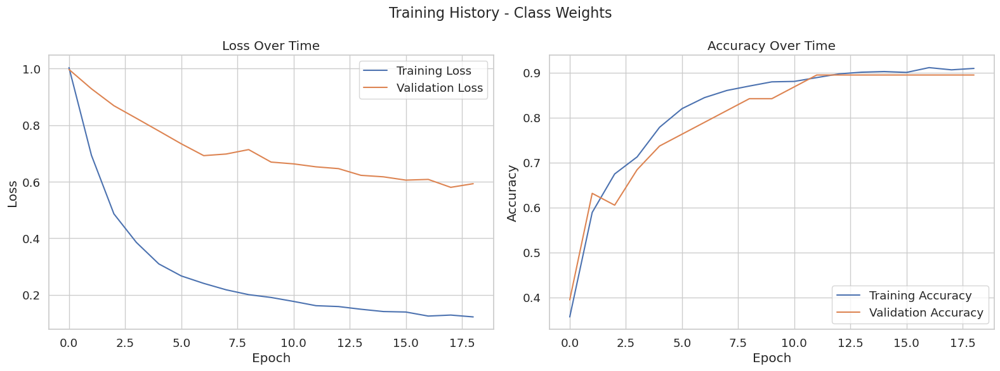

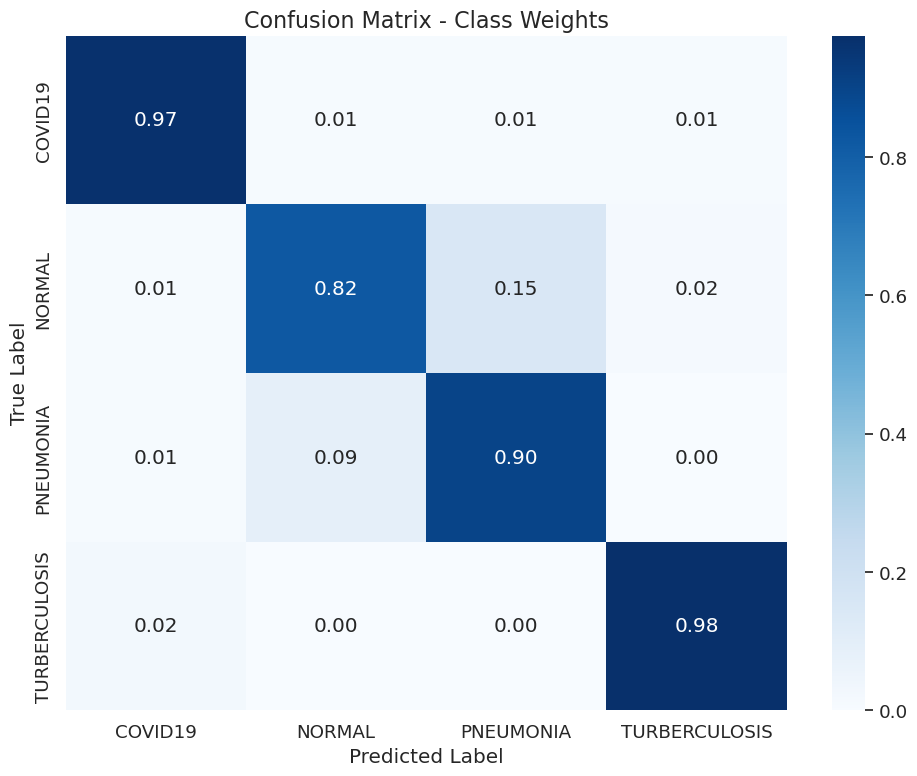

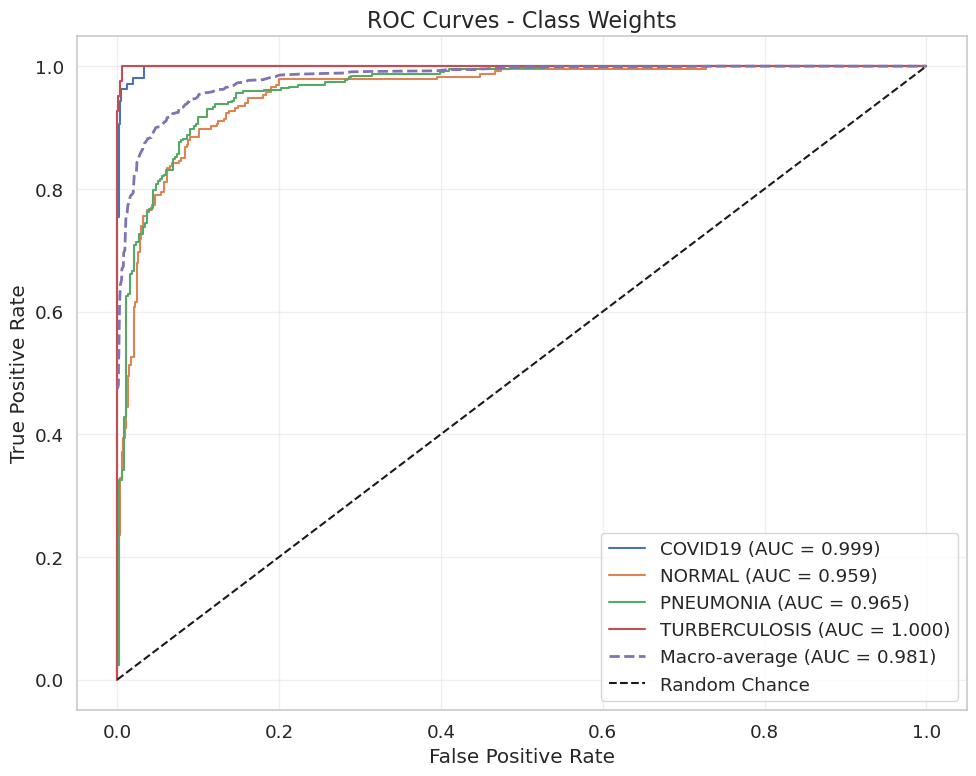

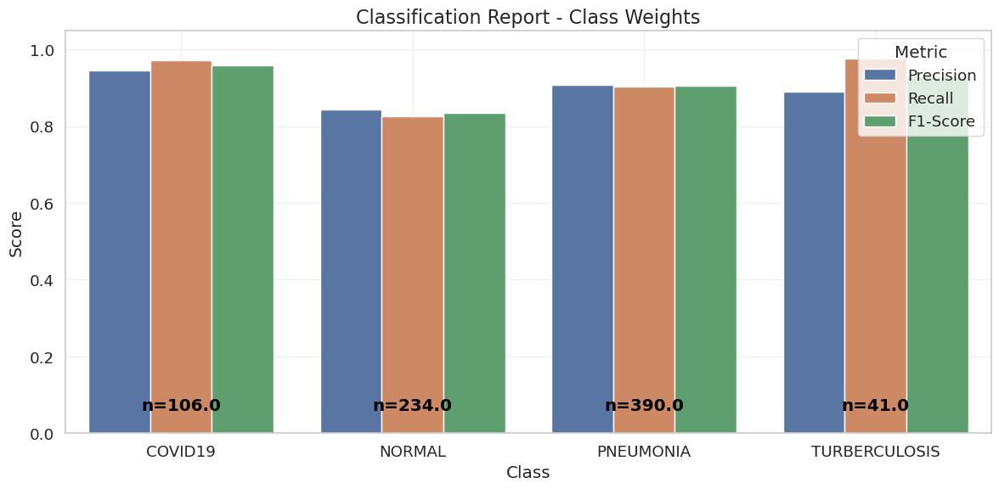

In [ ]:
print(f"\n--- Testing class balancing technique: Class Weights ---\n")
technique_name = 'Class Weights'
technique = balancing_techniques[technique_name]
# Reload datasets to apply different samplers
current_data = data
is_weighted = True
criterion_weight = current_data['class_weights']

# Initialize model
model = initialize_model(best_architecture, num_classes=num_classes, feature_extract=True)
model = model.to(device)
# Setup loss function with class weights
criterion = nn.CrossEntropyLoss(weight=criterion_weight)
# Setup optimizer
optimizer = optim.Adam(model.parameters(), lr=0.0003)
# Setup learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer, mode='min', factor=0.5, patience=3,
)
# Train model
model, history = train_model(
    model, current_data, criterion, optimizer, scheduler, num_epochs=25,
    is_weighted=is_weighted
)
# Evaluate model
eval_results = evaluate_model(model, current_data['test_loader'], criterion)
# Plot results
plot_training_history(history, title=f'Training History - {technique_name}')
plot_confusion_matrix(
    eval_results['confusion_matrix'], data['class_names'], title=f'Confusion Matrix - {technique_name}'
)
plot_roc_curves(eval_results, title=f'ROC Curves - {technique_name}')
plot_classification_report(eval_results['classification_report'], title=f'Classification Report - {technique_name}')
all_balancing_results[technique_name] = {'history': history, 'evaluation': eval_results, 'model': model}


# ### Cell 13.4: Compare Class Balancing Techniques


=== Comparison of Class Balancing Techniques ===

         Experiment  Validation Accuracy  Test Accuracy  Macro AUC
0      No Balancing             0.815789       0.830091   0.980965
1  Weighted Sampler             0.894737       0.900130   0.980516
2     Class Weights             0.894737       0.892348   0.980871


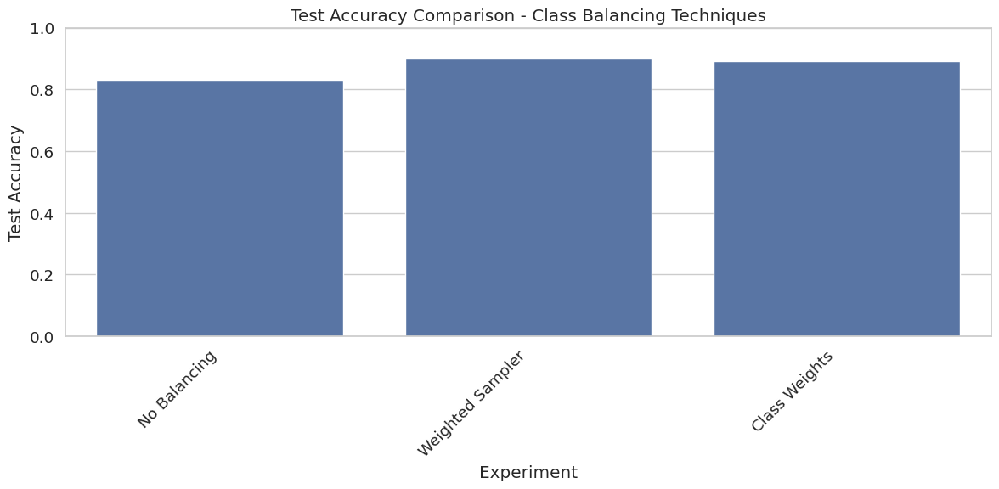

In [ ]:
compare_experiment_results(all_balancing_results, 'Class Balancing Techniques')


# ## Cell 14: Training the Optimized Model

In [ ]:
def train_optimized_model(best_preprocessing='augmented', best_architecture='densenet121'):
    """
    Train the model with sample weights for handling class imbalance
    
    Returns:
    dict: Results of the optimized training
    """
    print("\n=== Training Sample Weighted Model ===\n")
    
    # Load datasets with the best preprocessing method
    data = load_datasets(preprocessing_method=best_preprocessing)
    
    # Compute sample weights for the training dataset
    train_labels = [label for _, label in data['train_dataset']]
    sample_weights = compute_sample_weights(train_labels)
    
    # Convert sample weights to tensor
    sample_weights_tensor = torch.tensor(sample_weights, dtype=torch.float)
    
    # Compute class weights for loss function
    unique_labels = np.unique(train_labels)
    class_weights = compute_class_weight(
        class_weight='balanced', 
        classes=unique_labels, 
        y=train_labels
    )
    class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)
    
    # Create a weighted sampler for the training dataset
    weighted_sampler = WeightedRandomSampler(
        weights=sample_weights_tensor, 
        num_samples=len(sample_weights_tensor),
        replacement=True
    )
    
    # Update train loader with weighted sampler
    data['train_loader'] = DataLoader(
        data['train_dataset'], 
        batch_size=batch_size, 
        sampler=weighted_sampler,
        num_workers=3
    )

    # Initialize the best model architecture
    model = initialize_model(best_architecture, num_classes=num_classes, feature_extract=False, use_pretrained=True)
    for stage in model.features[-3:]:  
        for param in stage.parameters():
            param.requires_grad = True

    model = model.to(device)
    
    # Use weighted Cross Entropy Loss
    criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
    
    # Setup optimizer
    optimizer = optim.Adam(model.parameters(), lr=0.0003, weight_decay=1e-4)
    
    # Setup learning rate scheduler
    scheduler = ReduceLROnPlateau(
        optimizer, mode='min', factor=0.5, patience=3,
    )
    
    # Train the model 
    model, history = train_model(
        model, 
        data, 
        criterion, 
        optimizer, 
        scheduler, 
        num_epochs=num_epochs,
        is_weighted=True,
        early_stopping_patience=early_stopping_patience, 
        use_amp=use_amp
    )
    
    # Evaluate the model on the test set
    eval_results = evaluate_model(model, data['test_loader'], criterion)
    
    # Visualization and plotting
    plot_training_history(history, title='Training History - Sample Weighted Model')
    plot_confusion_matrix(
        eval_results['confusion_matrix'], data['class_names'], 
        title='Confusion Matrix - Sample Weighted Model'
    )
    plot_roc_curves(eval_results, title='ROC Curves - Sample Weighted Model')
    plot_classification_report(
        eval_results['classification_report'], 
        title='Classification Report - Sample Weighted Model'
    )
    visualize_model_predictions(model, data['test_loader'])
    
    # Save the optimized model
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'history': history,
        'evaluation': eval_results,
        'preprocessing_method': best_preprocessing,
        'model_architecture': best_architecture,
        'test_accuracy': eval_results['test_acc'],
        'macro_auc': eval_results['roc']['auc']['macro']
    }, 'sample_weighted_chest_xray_model.pth')
    
    print(f"\nSample weighted model saved with test accuracy: {eval_results['test_acc']:.4f}")
    
    return {
        'history': history,
        'evaluation': eval_results,
        'model': model,
        'data': data
    }

# ## Cell 15: Run And Test Optimized Model Training


=== Training Sample Weighted Model ===

Loading datasets with augmented preprocessing...

Class distribution:
COVID19: Train=414, Val=56, Test=106
NORMAL: Train=1207, Val=142, Test=234
PNEUMONIA: Train=3488, Val=395, Test=390
TURBERCULOSIS: Train=585, Val=76, Test=41


/tmp/ipykernel_19572/1996001161.py:38: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)


Converted densenet121 to channels-last format for improved GPU performance
Applied torch.compile() to densenet121 for accelerated execution
Model densenet121 initialized with 6,957,956 total parameters
Trainable parameters: 6,957,956 (100.00% of total)

Training for up to 25 epochs with early stopping patience 7...
Epoch 1/25
----------


train: 100%|██████████| 23/23 [00:40<00:00,  1.77s/it]


train Loss: 0.2268 Acc: 0.8815


val: 100%|██████████| 3/3 [00:09<00:00,  3.25s/it]


val Loss: 0.4329 Acc: 0.8550

Epoch 2/25
----------


train: 100%|██████████| 23/23 [00:36<00:00,  1.58s/it]


train Loss: 0.0356 Acc: 0.9789


val: 100%|██████████| 3/3 [00:05<00:00,  1.78s/it]


val Loss: 0.2741 Acc: 0.9028

Epoch 3/25
----------


train: 100%|██████████| 23/23 [00:36<00:00,  1.57s/it]


train Loss: 0.0257 Acc: 0.9803


val: 100%|██████████| 3/3 [00:05<00:00,  1.77s/it]


val Loss: 0.1732 Acc: 0.9223

Epoch 4/25
----------


train: 100%|██████████| 23/23 [00:40<00:00,  1.77s/it]


train Loss: 0.0215 Acc: 0.9847


val: 100%|██████████| 3/3 [00:06<00:00,  2.22s/it]


val Loss: 0.2366 Acc: 0.9357

Epoch 5/25
----------


train: 100%|██████████| 23/23 [00:51<00:00,  2.22s/it]


train Loss: 0.0094 Acc: 0.9919


val: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


val Loss: 0.3169 Acc: 0.8999

Epoch 6/25
----------


train: 100%|██████████| 23/23 [00:37<00:00,  1.64s/it]


train Loss: 0.0132 Acc: 0.9879


val: 100%|██████████| 3/3 [00:05<00:00,  1.81s/it]


val Loss: 0.1122 Acc: 0.9686

Epoch 7/25
----------


train: 100%|██████████| 23/23 [00:36<00:00,  1.59s/it]


train Loss: 0.0081 Acc: 0.9924


val: 100%|██████████| 3/3 [00:05<00:00,  1.77s/it]


val Loss: 0.1002 Acc: 0.9626

Epoch 8/25
----------


train: 100%|██████████| 23/23 [00:36<00:00,  1.59s/it]


train Loss: 0.0117 Acc: 0.9916


val: 100%|██████████| 3/3 [00:05<00:00,  1.77s/it]


val Loss: 0.2899 Acc: 0.9223

Epoch 9/25
----------


train: 100%|██████████| 23/23 [00:36<00:00,  1.57s/it]


train Loss: 0.0146 Acc: 0.9847


val: 100%|██████████| 3/3 [00:05<00:00,  1.77s/it]


val Loss: 0.1962 Acc: 0.9118

Epoch 10/25
----------


train: 100%|██████████| 23/23 [00:35<00:00,  1.57s/it]


train Loss: 0.0105 Acc: 0.9907


val: 100%|██████████| 3/3 [00:05<00:00,  1.81s/it]


val Loss: 0.0837 Acc: 0.9567

Epoch 11/25
----------


train: 100%|██████████| 23/23 [00:35<00:00,  1.55s/it]


train Loss: 0.0071 Acc: 0.9937


val: 100%|██████████| 3/3 [00:05<00:00,  1.77s/it]


val Loss: 0.2714 Acc: 0.9013

Epoch 12/25
----------


train: 100%|██████████| 23/23 [00:38<00:00,  1.68s/it]


train Loss: 0.0081 Acc: 0.9924


val: 100%|██████████| 3/3 [00:05<00:00,  1.81s/it]


val Loss: 0.0822 Acc: 0.9701

Epoch 13/25
----------


train: 100%|██████████| 23/23 [00:36<00:00,  1.60s/it]


train Loss: 0.0106 Acc: 0.9944


val: 100%|██████████| 3/3 [00:05<00:00,  1.77s/it]


val Loss: 0.0922 Acc: 0.9581

Epoch 14/25
----------


train: 100%|██████████| 23/23 [00:38<00:00,  1.69s/it]


train Loss: 0.0099 Acc: 0.9939


val: 100%|██████████| 3/3 [00:05<00:00,  1.77s/it]


val Loss: 0.0884 Acc: 0.9701

Epoch 15/25
----------


train: 100%|██████████| 23/23 [00:38<00:00,  1.67s/it]


train Loss: 0.0052 Acc: 0.9960


val: 100%|██████████| 3/3 [00:05<00:00,  1.77s/it]


val Loss: 0.2140 Acc: 0.9163

Epoch 16/25
----------


train: 100%|██████████| 23/23 [00:37<00:00,  1.62s/it]


train Loss: 0.0064 Acc: 0.9951


val: 100%|██████████| 3/3 [00:05<00:00,  1.81s/it]


val Loss: 0.2284 Acc: 0.9402
Learning rate adjusted from 0.000300 to 0.000150

Epoch 17/25
----------


train: 100%|██████████| 23/23 [00:37<00:00,  1.62s/it]


train Loss: 0.0054 Acc: 0.9953


val: 100%|██████████| 3/3 [00:05<00:00,  1.81s/it]


val Loss: 0.1219 Acc: 0.9731

Epoch 18/25
----------


train: 100%|██████████| 23/23 [00:41<00:00,  1.79s/it]


train Loss: 0.0041 Acc: 0.9974


val: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


val Loss: 0.1181 Acc: 0.9761

Epoch 19/25
----------


train: 100%|██████████| 23/23 [00:36<00:00,  1.59s/it]


train Loss: 0.0048 Acc: 0.9944


val: 100%|██████████| 3/3 [00:05<00:00,  1.78s/it]


val Loss: 0.1453 Acc: 0.9552

Epoch 20/25
----------


train: 100%|██████████| 23/23 [00:37<00:00,  1.61s/it]


train Loss: 0.0022 Acc: 0.9984


val: 100%|██████████| 3/3 [00:05<00:00,  1.78s/it]


val Loss: 0.1717 Acc: 0.9492
Learning rate adjusted from 0.000150 to 0.000075

Epoch 21/25
----------


train: 100%|██████████| 23/23 [00:39<00:00,  1.71s/it]


train Loss: 0.0015 Acc: 0.9986


val: 100%|██████████| 3/3 [00:05<00:00,  1.79s/it]


val Loss: 0.0877 Acc: 0.9746

Epoch 22/25
----------


train: 100%|██████████| 23/23 [00:37<00:00,  1.63s/it]


train Loss: 0.0027 Acc: 0.9970


val: 100%|██████████| 3/3 [00:05<00:00,  1.82s/it]


val Loss: 0.0567 Acc: 0.9806

Epoch 23/25
----------


train: 100%|██████████| 23/23 [00:38<00:00,  1.65s/it]


train Loss: 0.0023 Acc: 0.9984


val: 100%|██████████| 3/3 [00:05<00:00,  1.78s/it]


val Loss: 0.1140 Acc: 0.9522

Epoch 24/25
----------


train: 100%|██████████| 23/23 [00:38<00:00,  1.69s/it]


train Loss: 0.0016 Acc: 0.9979


val: 100%|██████████| 3/3 [00:05<00:00,  1.81s/it]


val Loss: 0.0569 Acc: 0.9806

Epoch 25/25
----------


train: 100%|██████████| 23/23 [00:38<00:00,  1.69s/it]


train Loss: 0.0017 Acc: 0.9986


val: 100%|██████████| 3/3 [00:05<00:00,  1.80s/it]


val Loss: 0.0809 Acc: 0.9746

Training complete in 18m 20s
Best val Acc: 0.9806 at epoch 22


Evaluating: 100%|██████████| 4/4 [00:08<00:00,  2.16s/it]


Test Loss: 0.1839, Test Acc: 0.9494
Macro ROC AUC: 0.9938


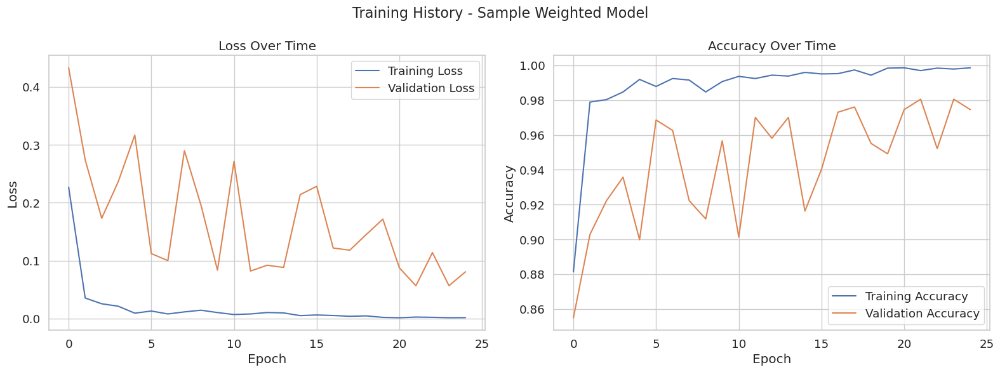

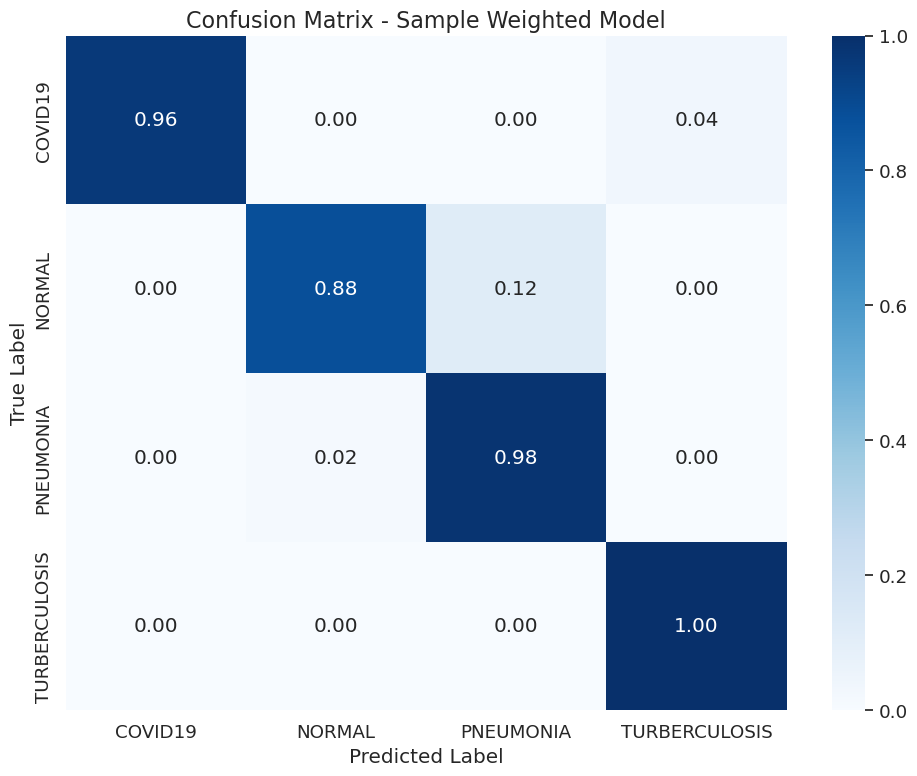

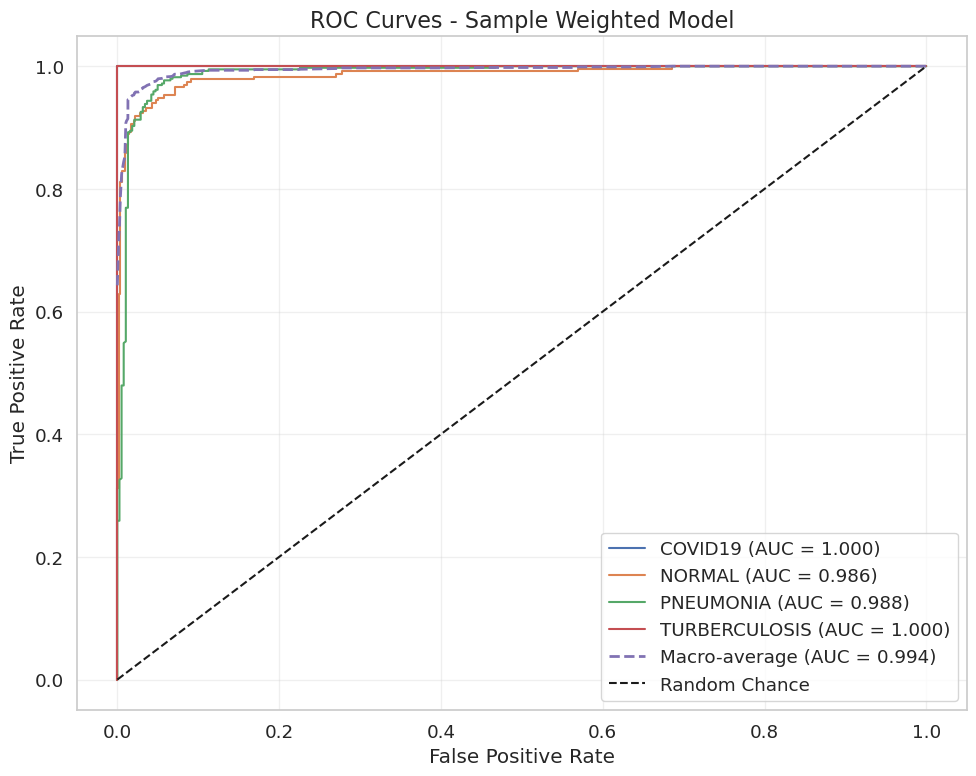

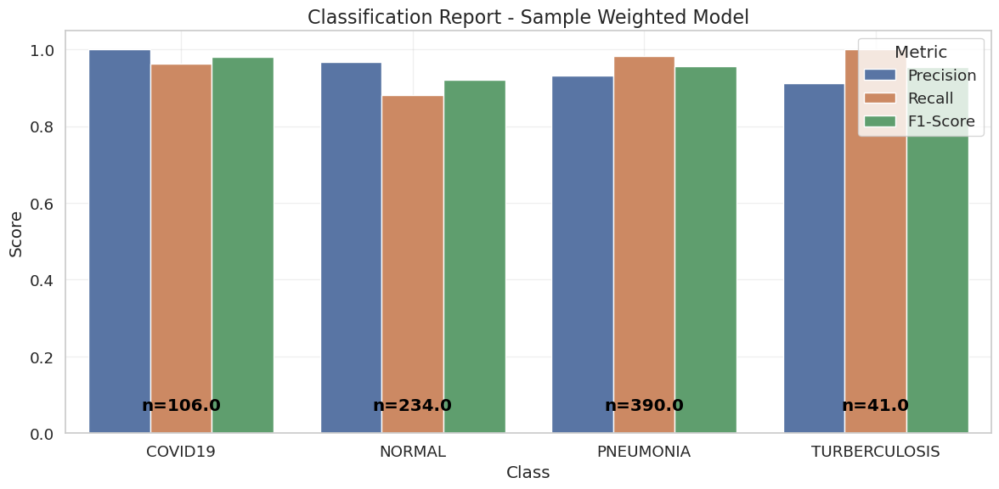

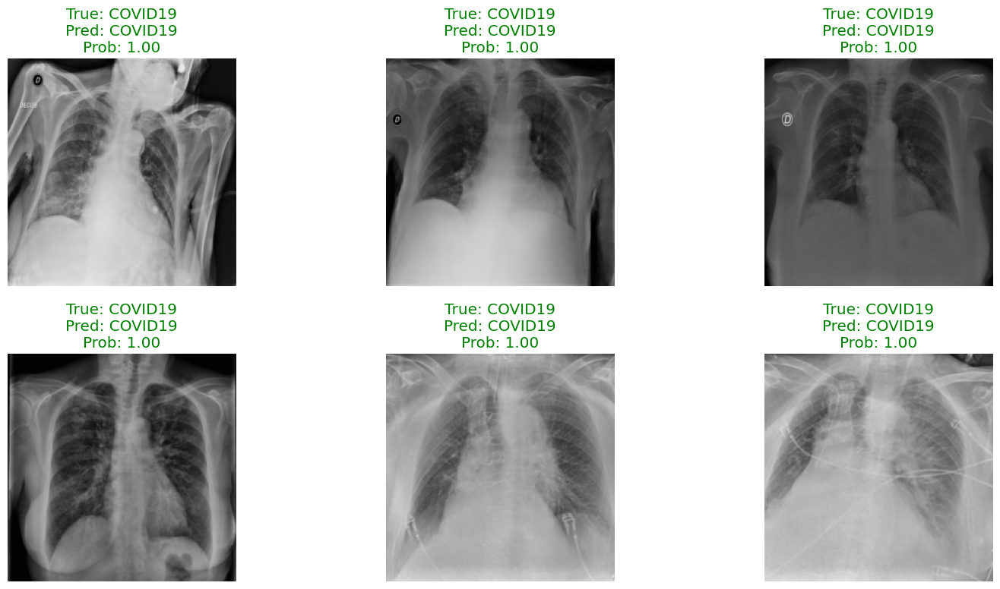


Sample weighted model saved with test accuracy: 0.9494

Optimized model training and saving completed.


In [ ]:
optimized_results = train_optimized_model()

print("\nOptimized model training and saving completed.")

Forward hook registered on Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)


W0414 17:58:02.776000 19572 site-packages/torch/_dynamo/convert_frame.py:844] [10/8] torch._dynamo hit config.cache_size_limit (8)
W0414 17:58:02.776000 19572 site-packages/torch/_dynamo/convert_frame.py:844] [10/8]    function: 'forward' (/home/grad13/jzhang/miniconda3/lib/python3.12/site-packages/torchvision/models/densenet.py:76)
W0414 17:58:02.776000 19572 site-packages/torch/_dynamo/convert_frame.py:844] [10/8]    last reason: 10/0: tensor 'L['self']._modules['norm1']._buffers['running_mean']' size mismatch at index 0. expected 512, actual 768
W0414 17:58:02.776000 19572 site-packages/torch/_dynamo/convert_frame.py:844] [10/8] To log all recompilation reasons, use TORCH_LOGS="recompiles".
W0414 17:58:02.776000 19572 site-packages/torch/_dynamo/convert_frame.py:844] [10/8] To diagnose recompilation issues, see https://pytorch.org/docs/main/torch.compiler_troubleshooting.html.


Gradient captured for target
Gradient captured for target
Gradient captured for target
Gradient captured for target


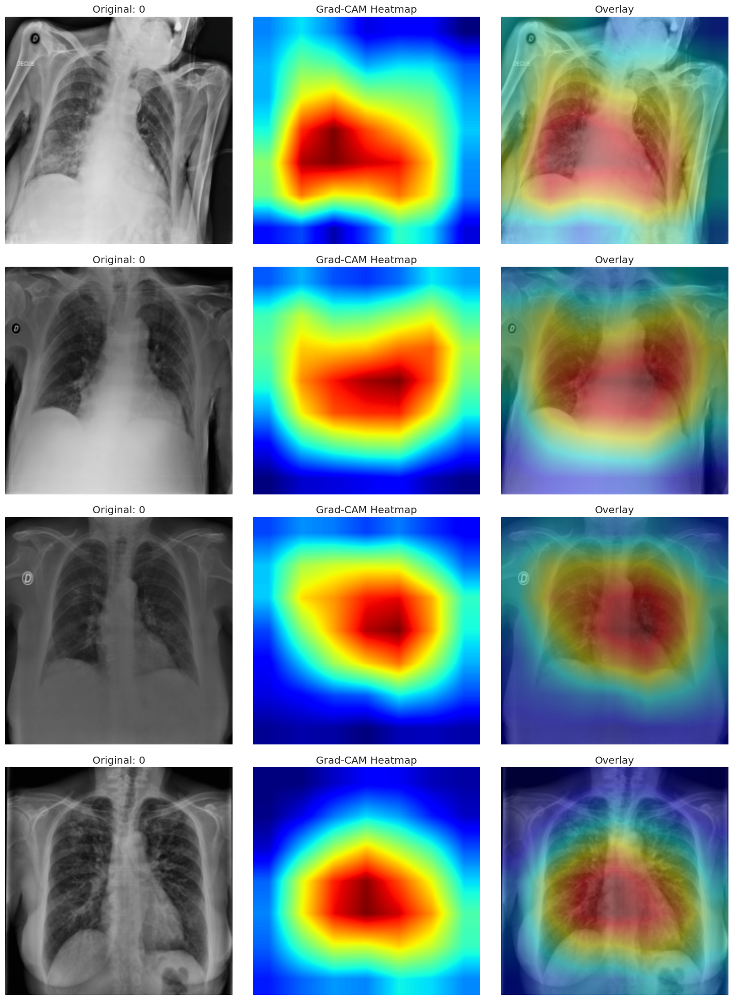


Optimized model training and saving completed.


In [ ]:
best_architecture = 'densenet121'  
model = optimized_results['model']
data = optimized_results['data']
target_layer = None
if best_architecture == 'efficientnet_b0':
    target_layer = model._conv_stem
elif best_architecture == 'resnet50':
    target_layer = model.layer4[-1].conv2
elif best_architecture == 'densenet121':
    target_layer = model.features.denseblock4.denselayer16.conv2
elif best_architecture == 'mobilenet_v2':
    target_layer = model.features[-1][0]
else:
    print("Warning: Grad-CAM target layer not defined for this architecture.")

if target_layer:
    generate_grad_cam(model, data['test_loader'], target_layer)

print("\nOptimized model training and saving completed.")

# ## Cell 18: Load and Test the Trained Optimized Model on the Separate Test Set

/tmp/ipykernel_56817/4099969378.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path, map_location=device)


Converted densenet121 to channels-last format for improved GPU performance
Applied torch.compile() to densenet121 for accelerated execution
Model densenet121 initialized with 6,957,956 total parameters
Trainable parameters: 6,957,956 (100.00% of total)


Evaluating: 100%|██████████| 5/5 [00:04<00:00,  1.16it/s]

Test Loss: 0.3265, Test Acc: 0.9308
Macro ROC AUC: 0.9916


<Figure size 1400x800 with 0 Axes>

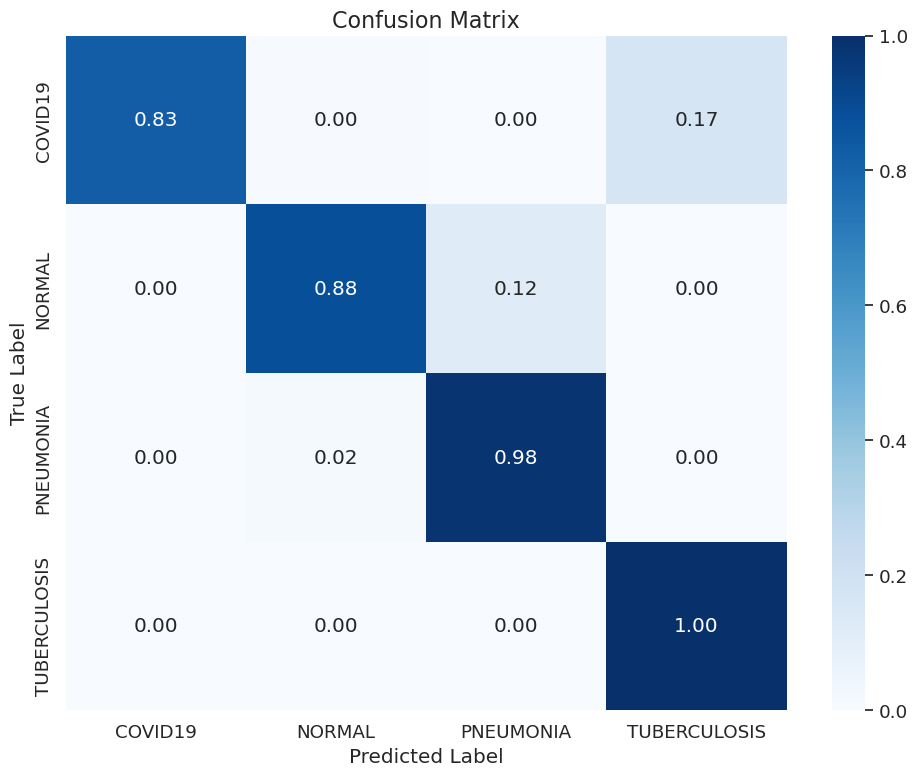

<Figure size 1400x800 with 0 Axes>

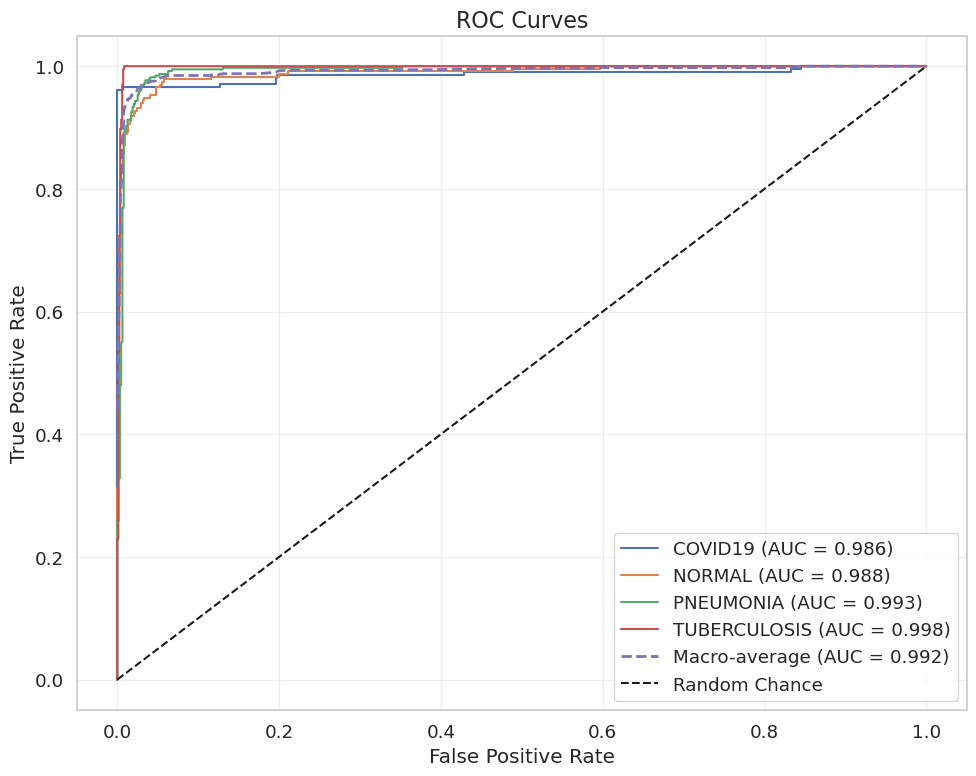

<Figure size 1000x800 with 0 Axes>

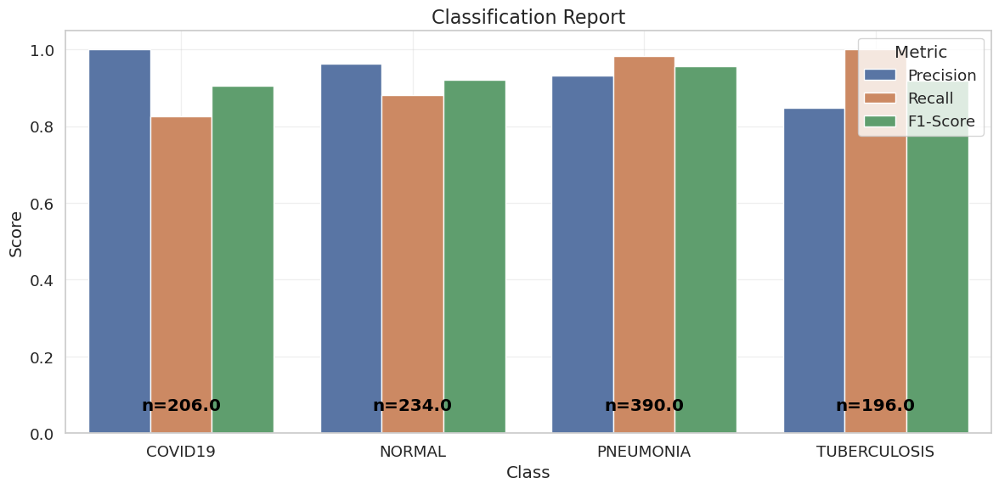

<Figure size 1400x800 with 0 Axes>

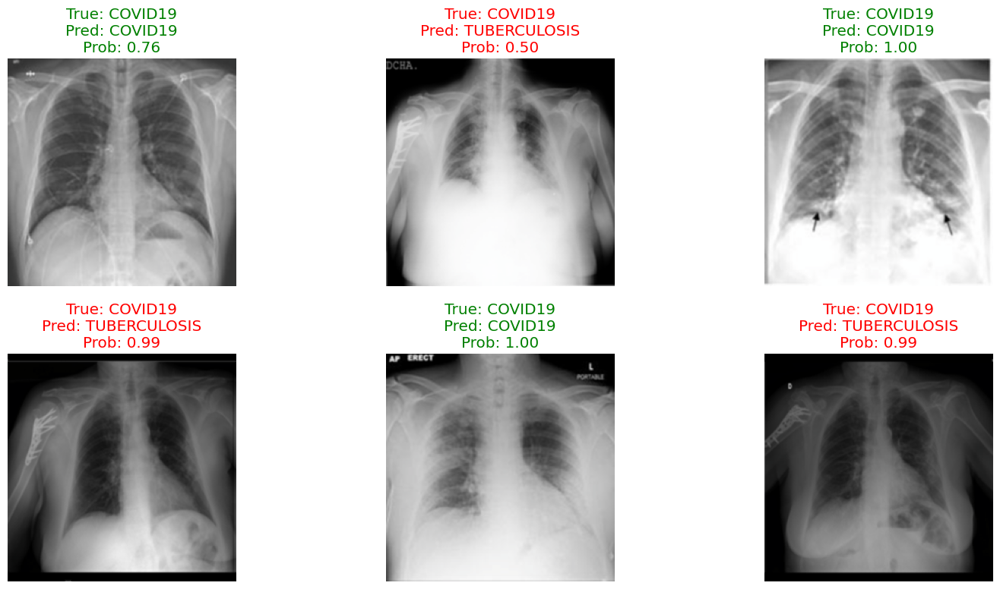

Forward hook registered on Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
Gradient captured for target
Gradient captured for target
Gradient captured for target
Gradient captured for target


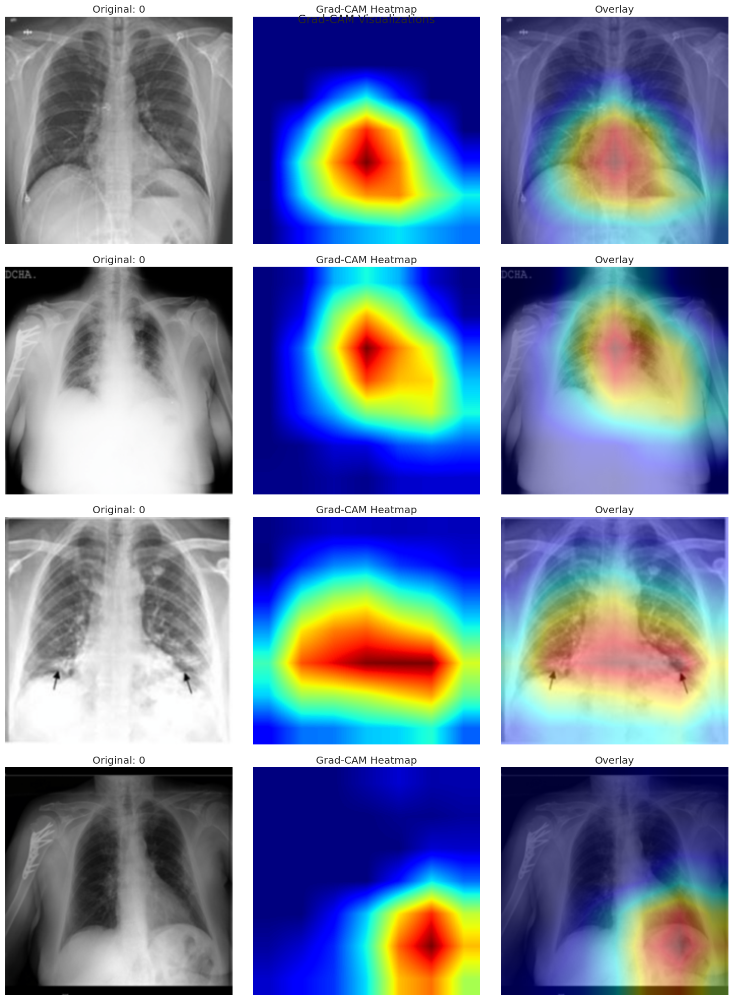


============================== New Test Set Results ==============================
Accuracy: 0.9308
Macro AUC: 0.9916
Classification Report:
              precision    recall  f1-score   support

     COVID19       1.00      0.83      0.90       206
      NORMAL       0.96      0.88      0.92       234
   PNEUMONIA       0.93      0.98      0.96       390
TUBERCULOSIS       0.85      1.00      0.92       196

    accuracy                           0.93      1026
   macro avg       0.94      0.92      0.92      1026
weighted avg       0.94      0.93      0.93      1026



In [17]:
new_test_dir = './chest_xray/'  # Ensure the directory structure matches that of the original data

# 1. Load the saved model
def load_trained_model(model_path, architecture='densenet121'):
    # Initialize the model structure
    model = initialize_model(architecture, num_classes=num_classes, feature_extract=False, use_pretrained=False)
    
    # Load the saved weights
    checkpoint = torch.load(model_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    model = model.to(device)
    model.eval()
    
    return model

# Load the model (using the best preprocessing method from training)
best_preprocessing = 'augmented'  # Must be consistent with the preprocessing used during training
best_architecture = 'densenet121'
model_path = 'sample_weighted_chest_xray_model.pth'
model = load_trained_model(model_path, best_architecture)

# 2. Prepare the new test dataset (using the same preprocessing)
test_transforms = get_transforms(best_preprocessing)['test']

new_test_dataset = datasets.ImageFolder(
    root=new_test_dir,
    transform=test_transforms
)

new_test_loader = DataLoader(
    new_test_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=4,
    pin_memory=True
)

# 3. Evaluate the model
criterion = nn.CrossEntropyLoss().to(device)
eval_results = evaluate_model(model, new_test_loader, criterion)

# 4. Visualize the results (display images on screen rather than saving to file)
def save_evaluation_results(eval_results, class_names):
    # Display the confusion matrix
    plt.figure()
    plot_confusion_matrix(eval_results['confusion_matrix'], class_names)
    plt.show()
    plt.close()

    # Display ROC curves
    plt.figure()
    plot_roc_curves(eval_results)
    plt.show()
    plt.close()

    # Display the classification report
    plt.figure(figsize=(10, 8))
    plot_classification_report(eval_results['classification_report'])
    plt.show()
    plt.close()

    # Display prediction examples
    plt.figure()
    visualize_model_predictions(model, new_test_loader)
    plt.show()
    plt.close()

# Get the class names (ensure the order is consistent with training)
class_names = new_test_dataset.classes

# Display all results
save_evaluation_results(eval_results, class_names)

# 5. Generate and display Grad-CAM heatmaps
best_architecture = 'densenet121'
target_layer = None
if best_architecture == 'efficientnet_b0':
    target_layer = model._conv_stem
elif best_architecture == 'resnet50':
    target_layer = model.layer4[-1].conv2
elif best_architecture == 'densenet121':
    target_layer = model.features.denseblock4.denselayer16.conv2
elif best_architecture == 'mobilenet_v2':
    target_layer = model.features[-1][0]
else:
    print("Warning: Grad-CAM target layer not defined for this architecture.")
if target_layer:
    generate_grad_cam(model, new_test_loader, target_layer)

# Print key metrics
print(f"\n{'='*30} New Test Set Results {'='*30}")
print(f"Accuracy: {eval_results['test_acc']:.4f}")
print(f"Macro AUC: {eval_results['roc']['auc']['macro']:.4f}")
print(f"Classification Report:\n{classification_report(eval_results['true_labels'], eval_results['predictions'], target_names=class_names)}")
